In [1]:
import aopy
from aopy.data import db
from aopy.analysis import accllr
import os
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
import h5py
import traceback
from scipy.stats import zscore
import datetime
from tqdm.auto import tqdm
from IPython.display import display, Markdown
import pandas as pd
import seaborn as sns
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm
from matplotlib import colors
from datetime import datetime, date

from aopy.visualization import annotate_spatial_map_channels, place_Opto32_subplots, plot_angles
from aopy.data.bmi3d import tabulate_ts_data
from aopy.preproc.bmi3d import get_laser_trial_times
from aopy.preproc.quality import detect_bad_trials
from aopy.analysis.connectivity import get_acq_ch_near_stimulation_site, calc_connectivity_map_coh, prepare_erp
from aopy.analysis import calc_itpc
from aopy.analysis.latency import detect_itpc_response
from aopy.analysis import calc_stat_over_dist_from_pos, calc_stat_over_angle_from_pos
from aopy.analysis import calc_fdrc_ranktest, calc_tfr_mean_fdrc_ranktest
from aopy.analysis import calc_spatial_tf_data_correlation, calc_spatial_data_correlation
from aopy.visualization import plot_spatial_drive_maps, plot_annotated_spatial_drive_map_stim
from aopy.visualization import overlay_sulci_on_spatial_map, plot_xy_scalebar, plot_tf_map_grid
from aopy.analysis import compare_conditions_bootstrap_spatial_corr

data_dir = '/media/moor-data/raw'
preproc_dir = '/media/moor-data/preprocessed'
postproc_dir = '/data/postprocessed/leo'
fig_dir = './figures'

# version = 'v251029'
version = 'v260225'

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists


In [2]:
from connectivity_analysis import *
from connectivity_plotting import *

In [3]:
aopy.utils.memory.set_memory_limit_gb(500)

## Pulse width

In [4]:
from joblib import Parallel, delayed
def sweep_trials(df, trial_sizes, fn, parallel=True, n_jobs=10):
    '''
    Splits the input dataframe into groups of trials with equal length
    according to the options in trial_sizes. Then applies the given
    fn on each subset of the dataframe.
    
    Args:
        df (ntrials,): 
        trial_sizes (n_sizes,):
        fn (function (df -> any)): 
        parallel (bool): Whether to run iterations in parallel
        n_jobs (int): Number of processes to use. -1 means all available.
        
    Returns:
        List of results where each entry corresponds to a trial size.
    '''
    
    result = []
    
    # Outer loop (Trial Sizes) - we usually keep this sequential to track progress
    for idx in tqdm(range(len(trial_sizes))):

        n_trials = trial_sizes[idx]
        n_iters = len(df) // n_trials
        
        # Pre-calculate the random indices upfront in the main process
        # This ensures the randomization logic remains identical to the original
        trials = np.random.choice(len(df), 
                                  size=(n_trials, n_iters), 
                                  replace=False)
        
        if parallel:
            # Use Joblib to parallelize the inner loop (n_iters)
            # delayed(fn)(arg) captures the function and argument for the workers
            iter_result = Parallel(n_jobs=n_jobs)(
                delayed(fn)(df.iloc[trials[:, it]].reset_index(drop=True))
                for it in range(n_iters)
            )
        else:
            # Original sequential implementation
            iter_result = []
            for it in range(n_iters):
                df_sub = df.iloc[trials[:, it]].reset_index(drop=True)
                iter_result.append(fn(df_sub))

        result.append(iter_result)
        
    return result

In [15]:
def test_sweep_trials():
    df = pd.DataFrame({'a': np.random.uniform(size=(3375,))})
    assert len(df) == 3375
    
    result = sweep_trials(df, [375, 675], np.mean, parallel=False)
    for sz in result:
        print(len(sz))
        print(sz)
    
test_sweep_trials()

  0%|          | 0/2 [00:00<?, ?it/s]

9
[np.float64(0.4822039237163208), np.float64(0.513786115310193), np.float64(0.4869046525633509), np.float64(0.5091431179555445), np.float64(0.5201025592560671), np.float64(0.4912150309974294), np.float64(0.4822830809095332), np.float64(0.4847058751951505), np.float64(0.509620390802277)]
5
[np.float64(0.4965754300670943), np.float64(0.49829746368328387), np.float64(0.4877847945049224), np.float64(0.5072993646465199), np.float64(0.4989122508236608)]


In [16]:
import multiprocessing as mp
def sweep_trials_slic(df, trial_sizes):
    
    fn = lambda df_sub: calc_slic_map(df_sub, parallel=False, verbose=False)
    result = sweep_trials(df, trial_sizes, fn, n_jobs=40)
    
    maps = []
    for sz in result:
        iter_map = []
        for iter_sz in sz:
            freqs, time, slic_map = iter_sz
            iter_map.append(slic_map)
        maps.append(iter_map)
        
    return freqs, time, maps

def sweep_trials_gc(df, trial_sizes, stim_site):
    
    fn = lambda df_sub: calc_gc_map(df_sub, stim_site, verbose=False)
    result = sweep_trials(df, trial_sizes, fn)
    
    maps = []
    for sz in result:
        iter_map = []
        for iter_sz in sz:
            freqs, time, gc_map = iter_sz
            iter_map.append(gc_map)
        maps.append(iter_map)
                
    return freqs, time, maps

def sweep_trials_accllr(df, trial_sizes):
    
    fn = lambda df_sub: calc_latency_accllr(df_sub, parallel=False, verbose=False)[0]
    conn = sweep_trials(df, trial_sizes, fn, n_jobs=40)
    return conn

def sweep_trials_itpc(df, trial_sizes, itpc_null_maps, alpha=0.01):
    
    def fn(df_sub): 
        max_itpc, latency = calc_latency(df_sub)
        diff, p = calc_fdrc_ranktest(max_itpc, itpc_null_maps, nan_policy='omit')
        return convert_latency_to_serr(stim_site, latency, max_itpc, p, alpha=alpha)
            
    conn = sweep_trials(df, trial_sizes, fn, n_jobs=40)
    return conn

In [17]:
def calc_correlation_across_cond(cond_maps, freqs=None, time=None, band=(12,150), window=(0,1), grid_size=(16,16)):
    '''
    At each condition (here, size) 
    '''
    elec_pos, _, _ = aopy.data.load_chmap()
    similarity = []
    for maps in cond_maps:
        if freqs is not None:
            ncc, shifts = calc_spatial_tf_data_correlation(freqs, time, maps, elec_pos, 
                                                           band=band, window=window)
        else:
            ncc, shifts = calc_spatial_data_correlation(maps, elec_pos)
        n, m = ncc.shape
        triangle_idx = np.tril_indices(n=n, k=-1, m=m)
        similarity.append(ncc[triangle_idx].flatten())
        
    return similarity

In [18]:
implant_days, implant_site, implant_subj, implant_ncc = aopy.data.pkl_read(
    f'trial_sz_implants_{version}.pkl', postproc_dir)

# Sort by correlation across days
mean_corr = np.array([np.mean(ncc) for ncc in implant_ncc])
sort_idx = np.flip(np.argsort(mean_corr))

print(mean_corr[sort_idx])
print(np.array(implant_site)[sort_idx])

[0.99137384 0.99086393 0.9862604  0.98296467 0.9791411  0.9782942
 0.9753695  0.97050986 0.95504184 0.94607427 0.93989629 0.93384643
 0.89817578 0.87098414 0.85722284 0.84358018 0.83812832 0.82903633
 0.59323362]
[14 29 13 29  7 29 11  6 11 29 29 29 15 14 11 15 28 11 29]


In [33]:
# Choose sizes
max_size = 225
trial_sizes = list(range(25,max_size,25)) # list(range(1,1501,50))
print("n_trials", trial_sizes)


n_trials [25, 50, 75, 100, 125, 150, 175, 200]


  0%|          | 0/16 [00:00<?, ?it/s]

Text(0.5, 0, 'Pulse width (ms)')

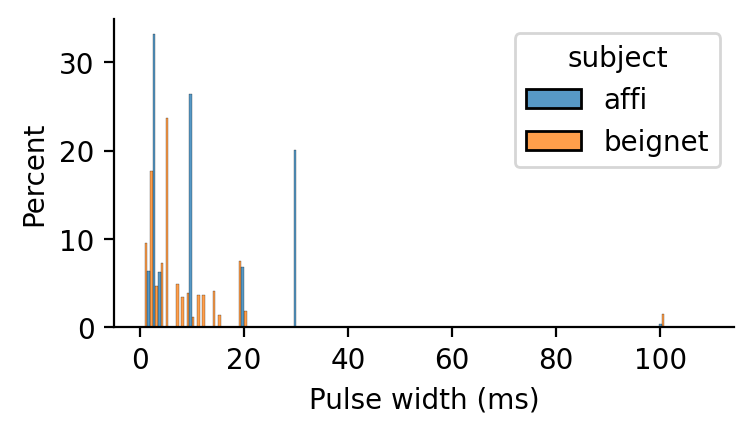

In [118]:
df_pw = None

for idx in tqdm(sort_idx[:16]):

    subject = implant_subj[idx]
    stim_site = implant_site[idx]
    days = implant_days[idx]
    
    # Load precomputed maps
    all_sites = aopy.data.pkl_read(
        f'{subject}_connectivity_all_sites_{version}.pkl', postproc_dir)
    long_df = load_df(postproc_dir, subject, 'rest_long', version)
    long_df = long_df[np.isin(long_df['date'], days)]
    df_long_site = long_df[(long_df['stimulation_site'].astype(int) == stim_site)].reset_index()
    
    df_pw = pd.concat((df_pw, pd.DataFrame({
        'subject': subject,
        'pw': (1000*df_long_site['trial_width']).tolist()
    })))
plt.figure(figsize=(4,2), dpi=200)
sns.histplot(data=df_pw, x='pw', hue='subject', stat='percent', 
             binwidth=1, common_norm=False, multiple='dodge')
sns.despine()
plt.xlabel('Pulse width (ms)')

In [34]:
pulse_widths = [(0,0.003), (0.003, 0.006), (0.006, 0.1)]

good_subjects = []
good_sites = []
good_days = []
for idx in tqdm(sort_idx[:16]):

    subject = implant_subj[idx]
    stim_site = implant_site[idx]
    days = implant_days[idx]
    
    # Load precomputed maps
    all_sites = aopy.data.pkl_read(
        f'{subject}_connectivity_all_sites_{version}.pkl', postproc_dir)
    long_df = load_df(postproc_dir, subject, 'rest_long', version)
    long_df = long_df[np.isin(long_df['date'], days)]
    max_trials = int(3*np.max(trial_sizes)) # enough for 3 repetitions at 500 trials
    df_long_site = long_df[(long_df['stimulation_site'].astype(int) == stim_site)].reset_index()
    
    i = 0
    for pulse_width in pulse_widths:
        df_long_sub_pw = df_long_site[(df_long_site['trial_width'] >= pulse_width[0]) & 
                                     (df_long_site['trial_width'] < pulse_width[1])].reset_index()

    
        print(f'{len(df_long_sub_pw)} trials for {subject} {stim_site} with pulse width {pulse_width}')
        if len(df_long_sub_pw) < max_trials: 
            continue
        i += 1
        
    if i == 3:
        print(f'enough trials for {subject} {stim_site}\n')

        good_subjects.append(subject)
        good_sites.append(stim_site)
        good_days.append(days)

  0%|          | 0/16 [00:00<?, ?it/s]

2180 trials for affi 14 with pulse width (0, 0.003)
2321 trials for affi 14 with pulse width (0.003, 0.006)
0 trials for affi 14 with pulse width (0.006, 0.1)
2115 trials for affi 29 with pulse width (0, 0.003)
2328 trials for affi 29 with pulse width (0.003, 0.006)
0 trials for affi 29 with pulse width (0.006, 0.1)
223 trials for affi 13 with pulse width (0, 0.003)
227 trials for affi 13 with pulse width (0.003, 0.006)
200 trials for affi 13 with pulse width (0.006, 0.1)
1809 trials for affi 29 with pulse width (0, 0.003)
1952 trials for affi 29 with pulse width (0.003, 0.006)
7514 trials for affi 29 with pulse width (0.006, 0.1)
enough trials for affi 29

1410 trials for beignet 7 with pulse width (0, 0.003)
501 trials for beignet 7 with pulse width (0.003, 0.006)
1993 trials for beignet 7 with pulse width (0.006, 0.1)
1424 trials for affi 29 with pulse width (0, 0.003)
1674 trials for affi 29 with pulse width (0.003, 0.006)
6210 trials for affi 29 with pulse width (0.006, 0.1)
enoug

  0%|          | 0/7 [00:00<?, ?it/s]

600 trials for affi 29 with pulse width (0, 0.003)


  0%|          | 0/8 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/la

600 trials for affi 29 with pulse width (0.003, 0.006)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for affi 29 with pulse width (0.006, 0.1)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


600 trials for affi 29 with pulse width (0, 0.003)


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for affi 29 with pulse width (0.003, 0.006)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for affi 29 with pulse width (0.006, 0.1)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for beignet 11 with pulse width (0, 0.003)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for beignet 11 with pulse width (0.003, 0.006)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for beignet 11 with pulse width (0.006, 0.1)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


600 trials for affi 29 with pulse width (0, 0.003)


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for affi 29 with pulse width (0.003, 0.006)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for affi 29 with pulse width (0.006, 0.1)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


600 trials for affi 29 with pulse width (0, 0.003)


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for affi 29 with pulse width (0.003, 0.006)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for affi 29 with pulse width (0.006, 0.1)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


600 trials for affi 14 with pulse width (0, 0.003)


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for affi 14 with pulse width (0.003, 0.006)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for affi 14 with pulse width (0.006, 0.1)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for beignet 15 with pulse width (0, 0.003)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for beignet 15 with pulse width (0.003, 0.006)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

600 trials for beignet 15 with pulse width (0.006, 0.1)


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


  0%|          | 0/8 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/visualization/base.py:804: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(axsize[0] * nrows_ncols[1], axsize[1] * nrows_ncols[0]))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


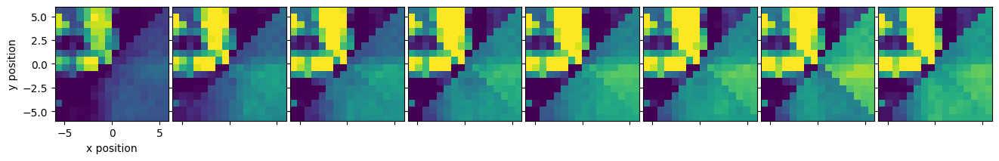

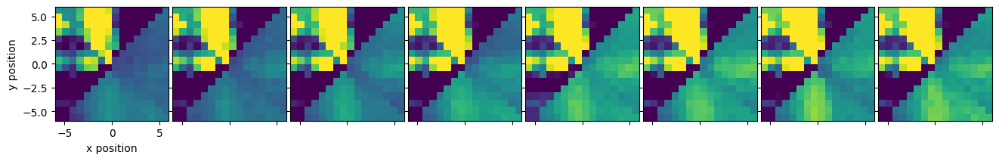

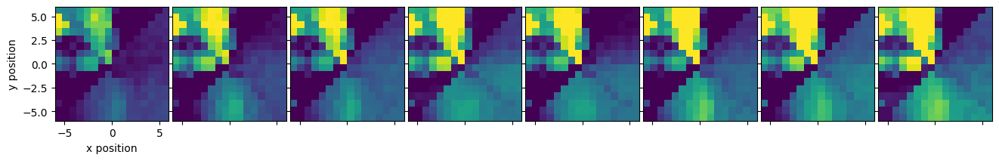

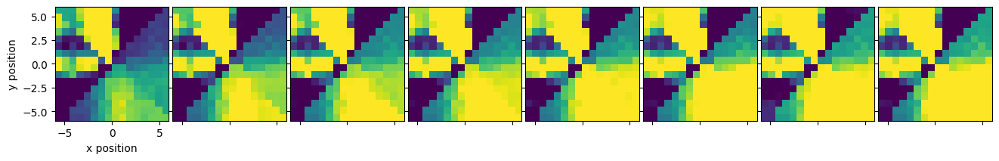

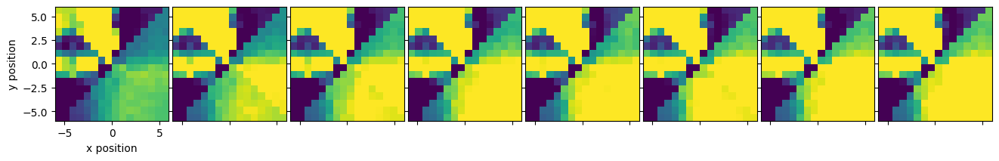

...

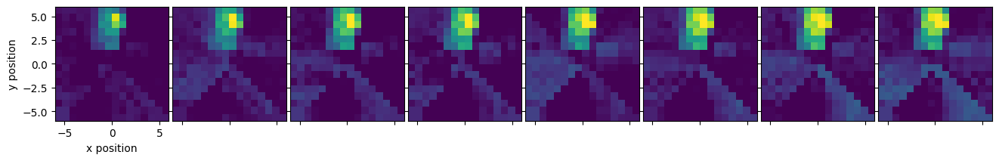

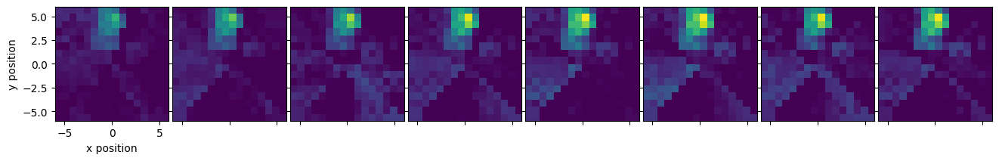

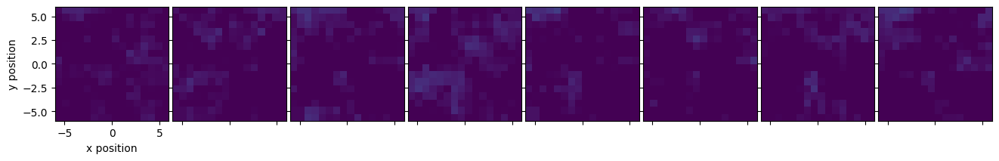

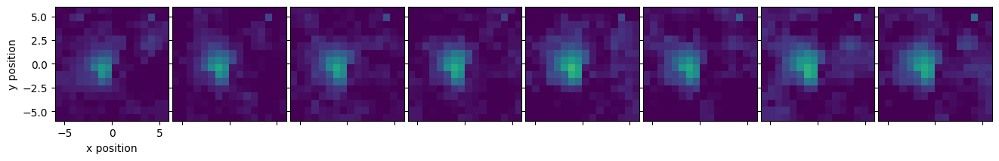

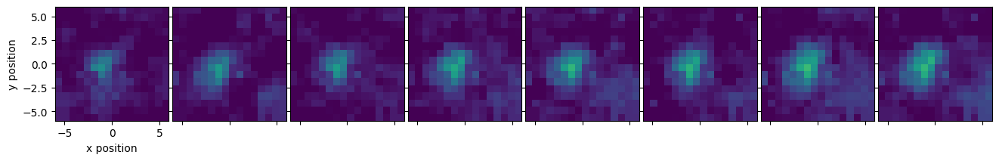

In [68]:
band = (50,150)

similarity_slic = []
similarity_subject = []
similarity_stim_site = []
similarity_pw = []

for idx in tqdm(range(len(good_subjects))):

    
    subject = good_subjects[idx]
    stim_site = good_sites[idx]
    days = good_days[idx]
    
    # Load precomputed maps
    all_sites = aopy.data.pkl_read(
        f'{subject}_connectivity_all_sites_{version}.pkl', postproc_dir)
    long_df = load_df(postproc_dir, subject, 'rest_long', version)
    long_df = long_df[np.isin(long_df['date'], days)]
    max_trials = int(3*np.max(trial_sizes)) # enough for 3 repetitions at 500 trials
    df_long_site = long_df[(long_df['stimulation_site'].astype(int) == stim_site)].reset_index()
    
    for pulse_width in pulse_widths:
        df_long_sub_pw = df_long_site[(df_long_site['trial_width'] >= pulse_width[0]) & 
                                     (df_long_site['trial_width'] < pulse_width[1])].reset_index().head(max_trials)

    
        print(f'{len(df_long_sub_pw)} trials for {subject} {stim_site} with pulse width {pulse_width}')
        if len(df_long_sub_pw) < max_trials: 
            print(f'not enough trials')
            continue

        similarity_subject.append(subject)
        similarity_stim_site.append(stim_site)
        similarity_pw.append(pulse_width)
    
        # SLIC
        freqs, time, coh_map = sweep_trials_slic(df_long_sub_pw, trial_sizes)

        avg_maps = [np.nanmean(maps, axis=0) for maps in coh_map]
        coh_bands = extract_band_across_maps(freqs, time, avg_maps, band=band)
        plot_spatial_drive_maps(coh_bands, (1,len(coh_bands)), (2,2), elec_data=True, clim=(0,0.1), cmap='viridis')
        filename = f'trial_sweep_slic_site_{subject}_{stim_site}_pw_{pulse_width}.svg'
        aopy.visualization.savefig(fig_dir, filename)

        ms = calc_correlation_across_cond(coh_map, freqs, time, band=band)
        similarity_slic.append(ms)


In [69]:
# Note, changed from mean similarity at each trial size
# to all similarity pairs at each trial size
print('done')

done


In [70]:
data = {
    'trial_sizes': trial_sizes, 
    'subject': similarity_subject,
    'stim_site': similarity_stim_site,
    'pulse_width': similarity_pw,
    'slic': similarity_slic,
}
aopy.data.pkl_write(f'trial_sz_pulse_width_{version}.pkl', data, postproc_dir)

In [71]:
print(np.shape(np.tile(trial_sizes, (len(similarity_pw),1)).tolist()))
print(np.shape(similarity_slic))

(21, 8)


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 2 dimensions. The detected shape was (21, 8) + inhomogeneous part.

In [72]:
mean_similarity_slic = [[np.mean(s) for s in p] for p in similarity_slic]
std_similarity_slic = [[np.std(s) for s in p] for p in similarity_slic]
df = pd.DataFrame({'trial_size': np.tile(trial_sizes, (len(similarity_pw),1)).tolist(),
                   'pulse_width': similarity_pw,
                   'stim_site': similarity_stim_site,
                   'subject': similarity_subject,
                   'mean_slic': mean_similarity_slic,
                   'std_slic': std_similarity_slic
                  })

In [98]:
df_exploded = df.explode(['trial_size', 'mean_slic', 'std_slic'])
display(df_exploded)

,trial_size,pulse_width,stim_site,subject,mean_slic,std_slic,combined_idx
0,25,"(0, 0.003)",29,affi,0.383618,0.210359,"(affi, 29, (0, 0.003))"
0,50,"(0, 0.003)",29,affi,0.547342,0.190013,"(affi, 29, (0, 0.003))"
0,75,"(0, 0.003)",29,affi,0.651959,0.130058,"(affi, 29, (0, 0.003))"
0,100,"(0, 0.003)",29,affi,0.772322,0.09244,"(affi, 29, (0, 0.003))"
0,125,"(0, 0.003)",29,affi,0.851022,0.046889,"(affi, 29, (0, 0.003))"
...,...,...,...,...,...,...,...
20,100,"(0.006, 0.1)",15,beignet,0.341379,0.166777,"(beignet, 15, (0.006, 0.1))"
20,125,"(0.006, 0.1)",15,beignet,0.411334,0.09835,"(beignet, 15, (0.006, 0.1))"
20,150,"(0.006, 0.1)",15,beignet,0.538028,0.070763,"(beignet, 15, (0.006, 0.1))"
20,175,"(0.006, 0.1)",15,beignet,0.606371,0.032334,"(beignet, 15, (0.006, 0.1))"


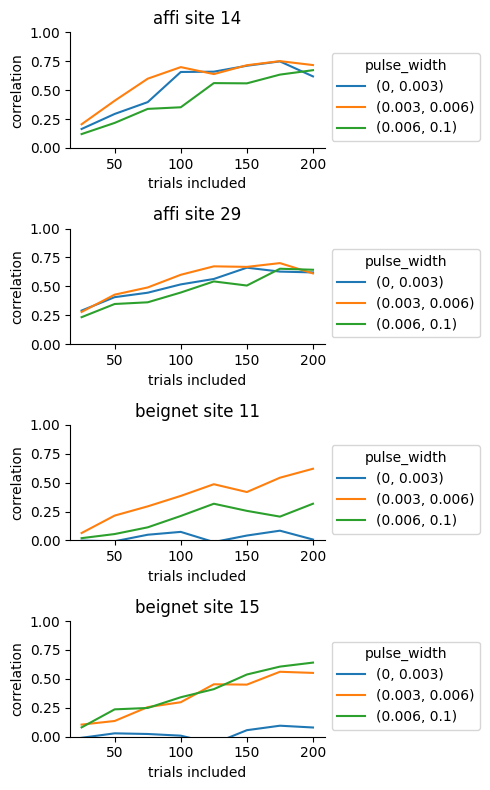

In [103]:
# Plot all together
idx = 1
plt.figure(figsize=(5,8))
for subject, df_subject in df_exploded.groupby('subject'):
    for stim_site, df_stim_site in df_subject.groupby('stim_site'):
        plt.subplot(4,1,idx)
        ax = plt.gca()
        sns.lineplot(data=df_stim_site, x='trial_size', y='mean_slic', hue='pulse_width', errorbar=None)
        sns.move_legend(ax, "lower left", bbox_to_anchor=(1,0))
        plt.ylim(0,1)
        plt.xlabel('trials included')
        plt.ylabel('correlation')
        plt.title(f'{subject} site {stim_site}')
        
        idx += 1

    
sns.despine()

plt.tight_layout()

## Within day changes

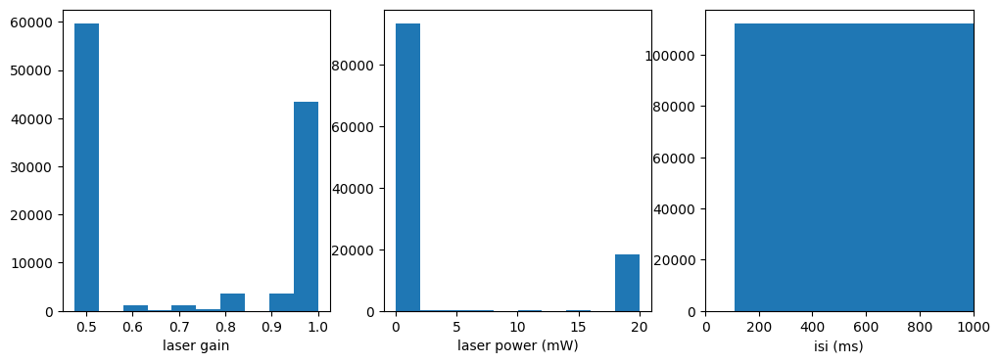

In [4]:
b_long_df = load_df(postproc_dir, 'beignet', 'rest_long', version)
trial_filter = filter_stim_trials(b_long_df, min_isi=0.01)
b_long_df = b_long_df[trial_filter].reset_index()
b_long_df['stimulation_site'] = b_long_df['stimulation_site'].astype(int)

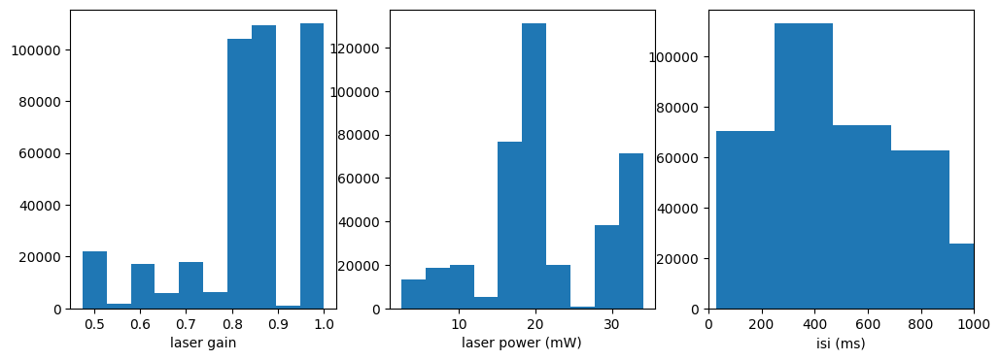

In [5]:
a_long_df = load_df(postproc_dir, 'affi', 'rest_long', version)
trial_filter = filter_stim_trials(a_long_df, min_isi=0.1)
a_long_df = a_long_df[trial_filter].reset_index()
a_long_df['stimulation_site'] = a_long_df['stimulation_site'].astype(int)

In [6]:
n_trials = 100
n_bootstraps = 40
n_shuffle = 20

all_subject = []
all_stim_site = []
all_date = []
all_mean1 = []
all_mean2 = []
all_dist1 = []
all_dist2 = []
all_observed_corr = []
all_observed_dprime = []
all_shuff_dists1 = []
all_shuff_dists2 = []
all_shuff_dprimes = []
for subject, subject_data in zip(['beignet', 'affi'], [b_long_df, a_long_df]):
    
    for day, df_day in subject_data.groupby('date'):
            
        for stim_site, df_site in df_day.groupby('stimulation_site'):
                
            # Check if there are two sessions
            pre_ids = []
            pre_trials = 0
            post_ids = []
            post_trials = 0
            for te_id, df_id in df_site.groupby('te_id'):
                session = db.lookup_sessions(id=te_id)[0].session
                if 'pre' in session:
                    print(day, subject, stim_site, 'pre', len(df_id))
                    pre_ids.append(te_id)
                    pre_trials += len(df_id)
                elif 'post' in session:
                    print(day, subject, stim_site, 'post', len(df_id))
                    post_ids.append(te_id)
                    post_trials += len(df_id)
            if not (pre_trials > 150) & (post_trials > 150):
                continue
                
            # Set up conditions
            df_site['condition'] = 'none'
            df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
            df_site['condition'][np.isin(df_site['te_id'], post_ids)] = 'post'
            df_site.drop(df_site.index[df_site['condition'] == 'none'])
            df, num = make_equal_sizes(df_site)

            # Remove outlier trials
            elec_pos, acq_ch, elecs = aopy.data.load_chmap()
            bad_trials = get_bad_stim_trials(df, channels=acq_ch-1, debug=False)

            df = df[~bad_trials]
            df, num = make_equal_sizes(df)

            # Compute
            pool = mp.Pool(mp.cpu_count()//2)
            try:
                stat = get_connectivity_statistic(stim_site, 'slic', parallel=False)
                labels = df['condition'].to_numpy()

                (observed_dists, conditions, observed_corr, observed_dprime, 
                     shuff_dists_dist, shuff_corr_dist, shuff_dprimes
                ) = compare_conditions_bootstrap_spatial_corr(
                    df, elec_pos, labels, 
                    n_trials=n_trials, n_bootstraps=n_bootstraps, n_shuffle=n_shuffle, 
                    statistics=stat, parallel=pool
                )
                mean1 = stat(df.iloc[labels == conditions[0]].reset_index(drop=True))
                mean2 = stat(df.iloc[labels == conditions[1]].reset_index(drop=True))
                dist1 = observed_dists[0]
                dist2 = observed_dists[1]
                shuff_dists1 = [s[0] for s in shuff_dists_dist]
                shuff_dists2 = [s[1] for s in shuff_dists_dist]
            finally:
                pool.close()
                
            all_subject.append(subject)
            all_stim_site.append(stim_site)
            all_date.append(day)
            all_mean1.append(mean1)
            all_mean2.append(mean2)
            all_dist1.append(dist1)
            all_dist2.append(dist2)
            all_observed_corr.append(observed_corr)
            all_observed_dprime.append(observed_dprime)
            all_shuff_dists1.append(shuff_dists1)
            all_shuff_dists2.append(shuff_dists2)
            all_shuff_dprimes.append(shuff_dprimes)


2022-03-15 beignet 1 post 199
2022-03-15 beignet 4 pre 200
2022-03-15 beignet 4 post 200
Before: 200 trials for pre, 200 trials for post
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-15 beignet 11 pre 209
2022-03-15 beignet 11 post 200
Before: 209 trials for pre, 200 trials for post
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for post, 200 trials for pre
After: 200 trials for post, 200 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-16 beignet 1 pre 201
2022-03-16 beignet 1 post 200
Before: 201 trials for pre, 200 trials for post
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for post, 200 trials for pre
After: 200 trials for post, 200 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-16 beignet 4 pre 199
2022-03-16 beignet 4 post 205
Before: 205 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 198 trials for pre
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-16 beignet 11 pre 200
2022-03-16 beignet 11 post 201
Before: 201 trials for post, 200 trials for pre
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for pre, 198 trials for post
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-17 beignet 1 pre 199
2022-03-17 beignet 4 pre 203
2022-03-17 beignet 11 pre 200
2022-03-17 beignet 11 pre 202
2022-03-18 beignet 1 post 199
2022-03-18 beignet 4 post 199
2022-03-18 beignet 11 pre 13
2022-03-18 beignet 11 pre 201
2022-03-18 beignet 11 post 203
Before: 214 trials for pre, 203 trials for post
After: 203 trials for post, 203 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 203 trials for pre, 201 trials for post
After: 201 trials for post, 201 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-22 beignet 4 pre 199
2022-03-22 beignet 4 post 199
Before: 199 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 198 trials for post, 197 trials for pre
After: 197 trials for post, 197 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-22 beignet 11 pre 201
2022-03-22 beignet 11 pre 202
2022-03-23 beignet 1 pre 200
2022-03-23 beignet 1 post 204
Before: 204 trials for post, 200 trials for pre
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-23 beignet 4 pre 199
2022-03-23 beignet 4 post 199
Before: 199 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 198 trials for post, 198 trials for pre
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-23 beignet 11 pre 199
2022-03-23 beignet 11 post 199
Before: 199 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for pre, 198 trials for post
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-24 beignet 1 pre 199
2022-03-24 beignet 1 post 203
Before: 203 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for pre, 197 trials for post
After: 197 trials for post, 197 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-24 beignet 4 pre 199
2022-03-24 beignet 4 post 199
Before: 199 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 197 trials for pre
After: 197 trials for post, 197 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-24 beignet 11 pre 203
2022-03-24 beignet 11 post 200
Before: 203 trials for pre, 200 trials for post
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-25 beignet 1 pre 199
2022-03-25 beignet 1 post 200
Before: 200 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-25 beignet 4 pre 201
2022-03-25 beignet 4 post 201
Before: 201 trials for pre, 201 trials for post
After: 201 trials for post, 201 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for post, 200 trials for pre
After: 200 trials for post, 200 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-26 beignet 1 pre 200
2022-03-26 beignet 4 pre 200
2022-03-26 beignet 11 pre 200
2022-03-29 beignet 1 pre 202
2022-03-29 beignet 1 post 200
Before: 202 trials for pre, 200 trials for post
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-29 beignet 4 pre 199
2022-03-29 beignet 4 post 201
Before: 201 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-29 beignet 11 pre 200
2022-03-29 beignet 11 post 201
Before: 201 trials for post, 200 trials for pre
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-30 beignet 1 pre 202
2022-03-30 beignet 4 pre 66
2022-03-31 beignet 1 pre 199
2022-03-31 beignet 1 post 204
Before: 204 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 198 trials for pre, 197 trials for post
After: 197 trials for post, 197 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-31 beignet 4 pre 199
2022-03-31 beignet 4 post 200
Before: 200 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 198 trials for pre
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-03-31 beignet 11 pre 200
2022-03-31 beignet 11 post 202
Before: 202 trials for post, 200 trials for pre
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-01 beignet 1 pre 200
2022-04-01 beignet 1 post 200
Before: 200 trials for pre, 200 trials for post
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for post, 197 trials for pre
After: 197 trials for post, 197 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-01 beignet 4 pre 199
2022-04-01 beignet 4 post 199
Before: 199 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-05 beignet 1 pre 202
2022-04-05 beignet 1 post 199
Before: 202 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-05 beignet 4 pre 200
2022-04-05 beignet 4 post 200
Before: 200 trials for pre, 200 trials for post
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for post, 198 trials for pre
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-05 beignet 11 pre 201
2022-04-05 beignet 11 post 201
Before: 201 trials for pre, 201 trials for post
After: 201 trials for post, 201 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 201 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-05 beignet 15 pre 199
2022-04-05 beignet 15 post 200
Before: 200 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 198 trials for post, 198 trials for pre
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-06 beignet 1 pre 199
2022-04-06 beignet 1 post 200
Before: 200 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 198 trials for pre, 197 trials for post
After: 197 trials for post, 197 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-06 beignet 4 pre 202
2022-04-06 beignet 4 post 200
Before: 202 trials for pre, 200 trials for post
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for post, 200 trials for pre
After: 200 trials for post, 200 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-06 beignet 11 pre 206
2022-04-06 beignet 11 post 201
Before: 206 trials for pre, 201 trials for post
After: 201 trials for post, 201 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 201 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-06 beignet 15 pre 203
2022-04-06 beignet 15 post 201
Before: 203 trials for pre, 201 trials for post
After: 201 trials for post, 201 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 201 trials for post, 201 trials for pre
After: 201 trials for post, 201 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-07 beignet 1 pre 201
2022-04-07 beignet 1 post 201
Before: 201 trials for pre, 201 trials for post
After: 201 trials for post, 201 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 201 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-07 beignet 4 pre 203
2022-04-07 beignet 4 post 202
Before: 203 trials for pre, 202 trials for post
After: 202 trials for post, 202 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 202 trials for post, 202 trials for pre
After: 202 trials for post, 202 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-07 beignet 11 pre 200
2022-04-07 beignet 11 post 199
Before: 200 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 198 trials for pre
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-07 beignet 15 pre 200
2022-04-07 beignet 15 post 202
Before: 202 trials for post, 200 trials for pre
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 198 trials for pre
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-08 beignet 1 pre 199
2022-04-08 beignet 1 post 199
Before: 199 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 198 trials for pre, 193 trials for post
After: 193 trials for post, 193 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-08 beignet 4 pre 200
2022-04-08 beignet 4 post 205
Before: 205 trials for post, 200 trials for pre
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-08 beignet 11 pre 199
2022-04-08 beignet 11 post 203
Before: 203 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for pre, 198 trials for post
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-08 beignet 15 pre 199
2022-04-08 beignet 15 post 199
Before: 199 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for pre, 196 trials for post
After: 196 trials for post, 196 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-09 beignet 1 pre 199
2022-04-09 beignet 1 post 208
Before: 208 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 198 trials for post, 197 trials for pre
After: 197 trials for post, 197 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-09 beignet 4 pre 202
2022-04-09 beignet 4 post 199
Before: 202 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 198 trials for post, 198 trials for pre
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-10 beignet 1 pre 200
2022-04-10 beignet 1 post 207
Before: 207 trials for post, 200 trials for pre
After: 200 trials for post, 200 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 200 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-10 beignet 4 pre 199
2022-04-10 beignet 4 post 200
Before: 200 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-10 beignet 15 pre 199
2022-04-10 beignet 15 post 201
2022-04-10 beignet 15 post 104
Before: 305 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for pre, 198 trials for post
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-11 beignet 1 pre 17
2022-04-11 beignet 1 pre 199
2022-04-11 beignet 1 post 199
Before: 216 trials for pre, 199 trials for post
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 198 trials for pre, 197 trials for post
After: 197 trials for post, 197 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-11 beignet 15 pre 199
2022-04-11 beignet 15 post 202
Before: 202 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for post, 198 trials for pre
After: 198 trials for post, 198 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-04-12 beignet 1 pre 199
2022-04-12 beignet 1 post 203
Before: 203 trials for post, 199 trials for pre
After: 199 trials for post, 199 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 199 trials for pre, 194 trials for post
After: 194 trials for post, 194 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-10 beignet 11 pre 299
2022-06-10 beignet 11 post 302
Before: 302 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 292 trials for post
After: 292 trials for post, 292 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-11 beignet 1 pre 299
2022-06-11 beignet 1 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in divide
  coh[win,:] = np.abs(np.imag(S12/np.sqrt(S1*S2)))
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:1779: RuntimeWarning: invalid value encountered in div

2022-06-11 beignet 4 pre 299
2022-06-11 beignet 4 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre
Before: 299 trials for pre, 291 trials for post
After: 291 trials for post, 291 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-11 beignet 11 pre 299
2022-06-11 beignet 11 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 294 trials for pre
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-12 beignet 1 pre 299
2022-06-12 beignet 1 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 290 trials for post
After: 290 trials for post, 290 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-12 beignet 4 pre 2
2022-06-12 beignet 4 pre 299
2022-06-12 beignet 4 post 299
Before: 301 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-14 beignet 11 pre 301
2022-06-14 beignet 11 post 301
Before: 301 trials for pre, 301 trials for post
After: 301 trials for post, 301 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for post, 295 trials for pre
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-15 beignet 1 pre 300
2022-06-15 beignet 1 post 300
Before: 300 trials for pre, 300 trials for post
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-15 beignet 4 pre 300
2022-06-15 beignet 4 post 300
Before: 300 trials for pre, 300 trials for post
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-15 beignet 11 pre 300
2022-06-15 beignet 11 post 300
Before: 300 trials for pre, 300 trials for post
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for post, 295 trials for pre
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-16 beignet 4 pre 299
2022-06-16 beignet 4 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-20 beignet 7 pre 307
2022-06-20 beignet 7 post 307
Before: 307 trials for pre, 307 trials for post
After: 307 trials for post, 307 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 307 trials for pre, 301 trials for post
After: 301 trials for post, 301 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-23 beignet 4 pre 251
2022-06-23 beignet 4 post 249
Before: 251 trials for pre, 249 trials for post
After: 249 trials for post, 249 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 249 trials for post, 245 trials for pre
After: 245 trials for post, 245 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-23 beignet 11 pre 249
2022-06-23 beignet 11 post 249
Before: 249 trials for pre, 249 trials for post
After: 249 trials for post, 249 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 249 trials for post, 247 trials for pre
After: 247 trials for post, 247 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-24 beignet 1 pre 249
2022-06-24 beignet 1 post 249
Before: 249 trials for pre, 249 trials for post
After: 249 trials for post, 249 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 249 trials for pre, 248 trials for post
After: 248 trials for post, 248 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-24 beignet 7 pre 249
2022-06-24 beignet 7 post 254
Before: 254 trials for post, 249 trials for pre
After: 249 trials for post, 249 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 249 trials for pre, 243 trials for post
After: 243 trials for post, 243 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-24 beignet 11 pre 251
2022-06-24 beignet 11 post 249
Before: 251 trials for pre, 249 trials for post
After: 249 trials for post, 249 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 249 trials for pre, 245 trials for post
After: 245 trials for post, 245 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-25 beignet 11 pre 252
2022-06-25 beignet 11 post 252
Before: 252 trials for pre, 252 trials for post
After: 252 trials for post, 252 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 251 trials for pre, 249 trials for post
After: 249 trials for post, 249 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2022-06-27 beignet 4 post 1013
2023-04-03 affi 11 pre 299
2023-04-03 affi 11 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-03 affi 14 pre 299
2023-04-03 affi 14 pre 299
2023-04-03 affi 14 post 299
Before: 598 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-03 affi 29 pre 6
2023-04-03 affi 29 pre 300
2023-04-03 affi 29 post 299
Before: 306 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-03 affi 31 pre 299
2023-04-03 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-04 affi 11 pre 300
2023-04-04 affi 11 post 300
Before: 300 trials for pre, 300 trials for post
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-05 affi 14 pre 299
2023-04-05 affi 14 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-05 affi 31 pre 299
2023-04-05 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 293 trials for post
After: 293 trials for post, 293 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-06 affi 11 pre 299
2023-04-06 affi 11 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-06 affi 14 pre 299
2023-04-06 affi 14 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-06 affi 29 pre 301
2023-04-06 affi 29 post 300
Before: 301 trials for pre, 300 trials for post
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 291 trials for pre
After: 291 trials for post, 291 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-06 affi 31 pre 299
2023-04-06 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 295 trials for pre
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-07 affi 29 pre 299
2023-04-07 affi 29 post 119
2023-04-07 affi 29 post 299
Before: 418 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-10 affi 11 pre 299
2023-04-10 affi 11 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-10 affi 31 pre 299
2023-04-10 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-11 affi 11 pre 299
2023-04-11 affi 11 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-11 affi 14 pre 299
2023-04-11 affi 14 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-11 affi 20 post 300
2023-04-11 affi 28 post 45
2023-04-11 affi 28 post 299
2023-04-11 affi 29 pre 300
2023-04-11 affi 29 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-04-11 affi 31 pre 299
2023-04-11 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-16 affi 14 post 299
2023-05-17 affi 11 post 103
2023-05-17 affi 11 post 362
2023-05-17 affi 14 post 299
2023-05-17 affi 30 post 299
2023-05-18 affi 3 pre 141
2023-05-18 affi 3 pre 256
2023-05-18 affi 6 pre 30
2023-05-18 affi 6 pre 299
2023-05-18 affi 13 pre 299
2023-05-18 affi 28 pre 300
2023-05-18 affi 32 pre 229
2023-05-19 affi 13 pre 349
2023-05-19 affi 26 post 299
2023-05-19 affi 26 post 111
2023-05-19 affi 26 post 93
2023-05-19 affi 26 post 171
2023-05-19 affi 26 post 247
2023-05-19 affi 26 post 599
2023-05-19 affi 28 post 104
2023-05-19 affi 28 post 271
2023-05-19 affi 28 post 407
2023-05-22 affi 11 pre 299
2023-05-22 affi 11 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-22 affi 14 post 299
2023-05-22 affi 29 pre 299
2023-05-22 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-22 affi 31 pre 299
2023-05-22 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 293 trials for pre
After: 293 trials for post, 293 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-23 affi 11 pre 299
2023-05-23 affi 11 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-23 affi 29 pre 299
2023-05-23 affi 29 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-23 affi 31 pre 299
2023-05-23 affi 31 pre 299
2023-05-24 affi 11 pre 299
2023-05-24 affi 11 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-24 affi 14 pre 299
2023-05-24 affi 14 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 294 trials for pre
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-24 affi 29 pre 299
2023-05-24 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-24 affi 31 pre 299
2023-05-24 affi 31 pre 8
2023-05-24 affi 31 post 299
Before: 307 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 294 trials for post
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-25 affi 14 pre 299
2023-05-25 affi 14 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-25 affi 29 pre 299
2023-05-25 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-25 affi 31 pre 299
2023-05-25 affi 31 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-26 affi 11 pre 299
2023-05-26 affi 11 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-26 affi 29 pre 299
2023-05-26 affi 29 post 301
Before: 301 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-27 affi 11 pre 302
2023-05-27 affi 11 post 300
Before: 302 trials for pre, 300 trials for post
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-27 affi 14 pre 299
2023-05-27 affi 14 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 294 trials for pre
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-27 affi 29 pre 299
2023-05-27 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-27 affi 31 pre 299
2023-05-27 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-28 affi 29 pre 299
2023-05-28 affi 29 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-29 affi 11 pre 299
2023-05-29 affi 11 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-29 affi 14 pre 299
2023-05-29 affi 14 post 299
2023-05-29 affi 14 post 299
Before: 598 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 296 trials for pre, 294 trials for post
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-29 affi 29 pre 300
2023-05-29 affi 29 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-29 affi 31 pre 299
2023-05-29 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-30 affi 11 pre 300
2023-05-30 affi 11 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-30 affi 14 pre 300
2023-05-30 affi 14 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 293 trials for pre
After: 293 trials for post, 293 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-30 affi 29 pre 299
2023-05-30 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-05-30 affi 31 pre 299
2023-05-30 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-24 affi 11 post 299
2023-07-24 affi 14 post 299
2023-07-25 affi 11 pre 299
2023-07-25 affi 11 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 294 trials for pre
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Exception ignored in: <function tqdm.__del__ at 0x7f0ac81d3100>
Traceback (most recent call last):
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/std.py", line 1148, in __del__
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/notebook.py", line 282, in close
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/notebook.py", line 171, in display
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 716, in __set__
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 706, in set
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 1513, in _notify_trait
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/ipywidgets/widgets/widget.py",

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Exception ignored in: <function tqdm.__del__ at 0x7f0ac81d3100>
Traceback (most recent call last):
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/std.py", line 1148, in __del__
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/notebook.py", line 282, in close
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/tqdm/notebook.py", line 171, in display
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 716, in __set__
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 706, in set
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/traitlets/traitlets.py", line 1513, in _notify_trait
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/ipywidgets/widgets/widget.py",

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-25 affi 14 pre 299
2023-07-25 affi 14 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 295 trials for pre
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-27 affi 2 pre 299
2023-07-27 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-27 affi 26 pre 299
2023-07-27 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 289 trials for post
After: 289 trials for post, 289 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-27 affi 29 pre 299
2023-07-27 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-28 affi 2 pre 299
2023-07-28 affi 2 pre 301
2023-07-28 affi 2 post 299
Before: 600 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-28 affi 26 pre 299
2023-07-28 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-28 affi 29 pre 299
2023-07-28 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-29 affi 2 pre 299
2023-07-29 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-29 affi 26 pre 299
2023-07-29 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 295 trials for pre
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-29 affi 29 pre 299
2023-07-29 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 297 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-31 affi 2 pre 299
2023-07-31 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 297 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-07-31 affi 29 pre 300
2023-07-31 affi 29 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-01 affi 2 pre 299
2023-08-01 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-01 affi 26 pre 299
2023-08-01 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-01 affi 29 pre 299
2023-08-01 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-02 affi 2 pre 299
2023-08-02 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-02 affi 26 pre 299
2023-08-02 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-03 affi 2 pre 300
2023-08-03 affi 2 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-03 affi 29 pre 300
2023-08-03 affi 29 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-08 affi 2 pre 299
2023-08-08 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-08 affi 26 pre 299
2023-08-08 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-08 affi 29 pre 299
2023-08-08 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-09 affi 2 pre 299
2023-08-09 affi 2 post 301
Before: 301 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-09 affi 26 pre 299
2023-08-09 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-10 affi 2 pre 299
2023-08-10 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-10 affi 26 pre 300
2023-08-10 affi 26 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 291 trials for post
After: 291 trials for post, 291 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-10 affi 29 pre 300
2023-08-10 affi 29 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-11 affi 2 pre 300
2023-08-11 affi 2 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-12 affi 2 pre 300
2023-08-12 affi 2 post 300
Before: 300 trials for pre, 300 trials for post
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-12 affi 26 pre 299
2023-08-12 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 294 trials for pre
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-12 affi 29 pre 299
2023-08-12 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-13 affi 2 pre 299
2023-08-13 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 293 trials for post
After: 293 trials for post, 293 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-13 affi 26 pre 299
2023-08-13 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 294 trials for post
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-13 affi 29 pre 299
2023-08-13 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-14 affi 2 pre 299
2023-08-14 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-14 affi 26 pre 299
2023-08-14 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-14 affi 29 pre 299
2023-08-14 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-15 affi 26 pre 299
2023-08-15 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-15 affi 29 pre 300
2023-08-15 affi 29 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-16 affi 2 pre 299
2023-08-16 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-16 affi 26 pre 299
2023-08-16 affi 26 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-16 affi 29 pre 299
2023-08-16 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-17 affi 26 post 299
2023-08-17 affi 29 pre 299
2023-08-17 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-18 affi 2 pre 299
2023-08-18 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 294 trials for post
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-18 affi 26 pre 299
2023-08-18 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-18 affi 29 pre 299
2023-08-18 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-19 affi 26 pre 299
2023-08-19 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-20 affi 2 pre 299
2023-08-20 affi 26 pre 299
2023-08-20 affi 29 pre 299
2023-08-21 affi 2 pre 299
2023-08-21 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-21 affi 26 pre 299
2023-08-21 affi 26 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-21 affi 29 pre 299
2023-08-21 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-23 affi 2 pre 299
2023-08-23 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-23 affi 26 pre 300
2023-08-23 affi 26 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 290 trials for pre
After: 290 trials for post, 290 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-24 affi 2 pre 299
2023-08-24 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 294 trials for post
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-24 affi 26 pre 299
2023-08-24 affi 26 post 301
Before: 301 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-08-24 affi 29 pre 300
2023-08-24 affi 29 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-07 affi 2 pre 299
2023-09-07 affi 26 pre 300
2023-09-07 affi 26 post 299
2023-09-07 affi 26 post 299
Before: 598 trials for post, 300 trials for pre
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-08 affi 2 pre 299
2023-09-08 affi 26 pre 299
2023-09-08 affi 26 post 299
2023-09-08 affi 26 post 299
Before: 598 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-08 affi 29 pre 299
2023-09-08 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-09 affi 2 pre 299
2023-09-09 affi 26 pre 299
2023-09-09 affi 26 post 300
2023-09-09 affi 26 post 300
2023-09-09 affi 26 post 299
Before: 899 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 297 trials for post, 289 trials for pre
After: 289 trials for post, 289 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-09 affi 29 pre 301
2023-09-09 affi 29 post 299
Before: 301 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-10 affi 29 pre 299
2023-09-10 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 296 trials for pre, 294 trials for post
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-11 affi 26 pre 299
2023-09-11 affi 26 pre 300
2023-09-11 affi 26 pre 299
2023-09-11 affi 26 post 299
2023-09-11 affi 26 post 299
Before: 898 trials for pre, 598 trials for post
After: 598 trials for post, 598 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 593 trials for post, 592 trials for pre
After: 592 trials for post, 592 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-11 affi 29 post 299
2023-09-12 affi 2 pre 299
2023-09-12 affi 26 pre 299
2023-09-12 affi 26 pre 299
2023-09-12 affi 26 pre 299
2023-09-12 affi 26 pre 300
2023-09-12 affi 26 pre 299
2023-09-12 affi 26 pre 299
2023-09-12 affi 26 post 299
2023-09-12 affi 26 post 299
Before: 1795 trials for pre, 598 trials for post
After: 598 trials for post, 598 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 596 trials for post, 594 trials for pre
After: 594 trials for post, 594 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-12 affi 29 pre 300
2023-09-12 affi 29 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-13 affi 2 pre 299
2023-09-13 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-13 affi 26 pre 299
2023-09-13 affi 26 pre 301
2023-09-13 affi 26 post 299
Before: 898 trials for none, 600 trials for pre, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre, 295 trials for none
After: 295 trials for none, 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-14 affi 2 pre 299
2023-09-14 affi 2 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-14 affi 26 pre 299
2023-09-14 affi 26 post 299
Before: 897 trials for none, 299 trials for pre, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for none, 297 trials for post
After: 297 trials for none, 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-14 affi 29 pre 299
2023-09-14 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-15 affi 2 pre 301
2023-09-15 affi 2 post 299
Before: 301 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-15 affi 29 pre 299
2023-09-15 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-16 affi 2 pre 299
2023-09-16 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-16 affi 26 pre 299
2023-09-16 affi 26 post 300
Before: 805 trials for none, 300 trials for post, 299 trials for pre
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for none, 299 trials for post, 297 trials for pre
After: 297 trials for none, 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-16 affi 29 pre 299
2023-09-16 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-17 affi 2 pre 299
2023-09-17 affi 2 post 300
Before: 300 trials for post, 299 trials for pre, 299 trials for none
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre, 297 trials for none
After: 297 trials for none, 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-17 affi 26 pre 299
2023-09-17 affi 26 post 299
Before: 299 trials for pre, 299 trials for none, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for none, 298 trials for pre
After: 298 trials for none, 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-17 affi 29 pre 299
2023-09-17 affi 29 post 299
Before: 299 trials for pre, 299 trials for none, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for none, 299 trials for post, 297 trials for pre
After: 297 trials for none, 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-18 affi 2 pre 299
2023-09-18 affi 2 post 299
Before: 798 trials for none, 299 trials for pre, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for none, 297 trials for post
After: 297 trials for none, 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-18 affi 26 pre 299
2023-09-18 affi 26 post 299
Before: 301 trials for none, 299 trials for pre, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre, 295 trials for none
After: 295 trials for none, 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-18 affi 29 pre 299
2023-09-18 affi 29 post 299
Before: 299 trials for pre, 299 trials for none, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for none, 299 trials for post, 297 trials for pre
After: 297 trials for none, 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-19 affi 2 pre 299
2023-09-19 affi 2 post 300
Before: 598 trials for none, 300 trials for post, 299 trials for pre
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post, 296 trials for none
After: 296 trials for none, 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-19 affi 26 pre 299
2023-09-19 affi 26 post 301
Before: 598 trials for none, 301 trials for post, 299 trials for pre
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for none, 290 trials for pre
After: 290 trials for none, 290 trials for post, 290 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:01<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-19 affi 29 pre 299
2023-09-19 affi 29 post 299
Before: 598 trials for none, 299 trials for pre, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for none, 298 trials for post, 298 trials for pre
After: 298 trials for none, 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-20 affi 2 pre 299
2023-09-20 affi 2 post 299
Before: 598 trials for none, 299 trials for pre, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre, 297 trials for none
After: 297 trials for none, 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-20 affi 29 pre 299
2023-09-20 affi 29 post 299
Before: 599 trials for none, 299 trials for pre, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for none, 297 trials for post, 297 trials for pre
After: 297 trials for none, 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-21 affi 2 pre 299
2023-09-21 affi 2 post 299
Before: 598 trials for none, 299 trials for pre, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post, 297 trials for none
After: 297 trials for none, 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-21 affi 26 pre 300
2023-09-21 affi 26 post 300
Before: 598 trials for none, 300 trials for pre, 300 trials for post
After: 300 trials for none, 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for pre, 299 trials for none, 298 trials for post
After: 298 trials for none, 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-21 affi 29 pre 299
2023-09-21 affi 29 post 299
Before: 599 trials for none, 299 trials for pre, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for none, 298 trials for post, 298 trials for pre
After: 298 trials for none, 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-22 affi 2 pre 299
2023-09-22 affi 2 post 299
Before: 459 trials for none, 299 trials for pre, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for none, 298 trials for post, 298 trials for pre
After: 298 trials for none, 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-22 affi 26 pre 299
2023-09-22 affi 26 post 299
Before: 598 trials for none, 299 trials for pre, 299 trials for post
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre, 295 trials for none
After: 295 trials for none, 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-09-22 affi 29 pre 299
2023-09-22 affi 29 post 300
Before: 467 trials for none, 300 trials for post, 299 trials for pre
After: 299 trials for none, 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for none, 297 trials for post
After: 297 trials for none, 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-03 affi 26 pre 299
2023-10-03 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-03 affi 29 pre 301
2023-10-03 affi 29 post 299
Before: 301 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-04 affi 2 pre 299
2023-10-04 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-04 affi 26 pre 301
2023-10-04 affi 26 post 299
Before: 301 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-04 affi 29 pre 299
2023-10-04 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-08 affi 26 pre 299
2023-10-08 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-08 affi 29 pre 299
2023-10-08 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-09 affi 2 pre 299
2023-10-09 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-09 affi 26 pre 299
2023-10-09 affi 26 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-09 affi 29 pre 299
2023-10-09 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-10 affi 2 pre 299
2023-10-10 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-10 affi 26 pre 299
2023-10-10 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-10 affi 29 pre 299
2023-10-10 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-11 affi 2 pre 299
2023-10-11 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 292 trials for pre
After: 292 trials for post, 292 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-11 affi 26 pre 299
2023-10-11 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-11 affi 29 pre 300
2023-10-11 affi 29 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-12 affi 2 pre 299
2023-10-12 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-12 affi 29 pre 299
2023-10-12 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-13 affi 2 pre 299
2023-10-13 affi 26 post 59
2023-10-13 affi 26 pre 301
2023-10-13 affi 26 post 299
Before: 358 trials for post, 301 trials for pre
After: 301 trials for post, 301 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-13 affi 29 pre 299
2023-10-13 affi 29 post 99
2023-10-17 affi 3 pre 299
2023-10-17 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 290 trials for pre
After: 290 trials for post, 290 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-17 affi 26 pre 299
2023-10-17 affi 26 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-17 affi 29 pre 299
2023-10-17 affi 29 post 297
2023-10-17 affi 29 post 299
Before: 596 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-18 affi 26 pre 299
2023-10-18 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-18 affi 29 pre 300
2023-10-18 affi 29 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-19 affi 3 pre 299
2023-10-19 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 293 trials for pre
After: 293 trials for post, 293 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-19 affi 26 pre 299
2023-10-19 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-19 affi 29 pre 255
2023-10-19 affi 29 pre 299
2023-10-19 affi 29 post 299
Before: 554 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-20 affi 3 pre 300
2023-10-20 affi 3 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-20 affi 26 pre 299
2023-10-20 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-20 affi 29 pre 299
2023-10-20 affi 29 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-21 affi 3 pre 299
2023-10-21 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-21 affi 26 pre 299
2023-10-21 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-22 affi 3 pre 300
2023-10-22 affi 3 post 301
Before: 301 trials for post, 300 trials for pre
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-22 affi 26 pre 299
2023-10-22 affi 26 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-22 affi 29 pre 299
2023-10-22 affi 29 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-23 affi 3 pre 299
2023-10-23 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-23 affi 26 pre 299
2023-10-23 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-24 affi 26 pre 299
2023-10-24 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-24 affi 29 pre 299
2023-10-24 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-25 affi 3 pre 299
2023-10-25 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 296 trials for post, 295 trials for pre
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-25 affi 26 pre 299
2023-10-25 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-25 affi 29 pre 300
2023-10-25 affi 29 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-26 affi 3 pre 299
2023-10-26 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 295 trials for pre
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-26 affi 26 pre 299
2023-10-26 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-10-26 affi 29 pre 299
2023-10-26 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-06 affi 3 pre 299
2023-11-06 affi 14 pre 349
2023-11-06 affi 26 pre 299
2023-11-06 affi 29 pre 299
2023-11-07 affi 3 pre 299
2023-11-07 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-07 affi 26 pre 299
2023-11-07 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-07 affi 29 pre 299
2023-11-07 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-08 affi 26 pre 299
2023-11-08 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-08 affi 29 pre 299
2023-11-08 affi 29 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-09 affi 3 pre 300
2023-11-09 affi 3 pre 299
2023-11-09 affi 3 pre 299
2023-11-09 affi 26 post 299
2023-11-09 affi 29 pre 299
2023-11-09 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-10 affi 3 pre 299
2023-11-10 affi 3 pre 299
2023-11-10 affi 26 pre 299
2023-11-10 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-10 affi 29 pre 299
2023-11-10 affi 29 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-11 affi 3 pre 299
2023-11-11 affi 26 pre 300
2023-11-11 affi 29 pre 299
2023-11-12 affi 3 pre 299
2023-11-12 affi 3 pre 300
2023-11-12 affi 26 pre 299
2023-11-12 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-12 affi 29 pre 299
2023-11-12 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-13 affi 3 pre 299
2023-11-13 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-13 affi 26 pre 300
2023-11-13 affi 26 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-13 affi 29 pre 299
2023-11-13 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-14 affi 3 pre 299
2023-11-14 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-14 affi 26 pre 299
2023-11-14 affi 26 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-14 affi 29 pre 299
2023-11-14 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-15 affi 26 pre 300
2023-11-15 affi 26 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-15 affi 29 pre 299
2023-11-15 affi 29 post 302
Before: 302 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-16 affi 3 pre 301
2023-11-16 affi 3 post 299
Before: 301 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-16 affi 26 pre 299
2023-11-16 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-16 affi 29 pre 299
2023-11-16 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-17 affi 3 pre 299
2023-11-17 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-17 affi 26 pre 300
2023-11-17 affi 26 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-17 affi 29 pre 299
2023-11-17 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-18 affi 3 pre 299
2023-11-18 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 290 trials for post
After: 290 trials for post, 290 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-18 affi 26 pre 300
2023-11-18 affi 26 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-18 affi 29 pre 299
2023-11-18 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-19 affi 29 pre 299
2023-11-19 affi 29 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-20 affi 3 pre 87
2023-11-20 affi 3 pre 299
2023-11-20 affi 3 post 299
Before: 386 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-20 affi 29 pre 299
2023-11-20 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-21 affi 3 pre 300
2023-11-21 affi 3 post 300
Before: 300 trials for pre, 300 trials for post
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for pre, 294 trials for post
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-21 affi 26 pre 299
2023-11-21 affi 26 post 301
Before: 301 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-21 affi 29 pre 299
2023-11-21 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-22 affi 3 pre 299
2023-11-22 affi 3 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-11-22 affi 26 pre 299
2023-11-22 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-02 affi 2 pre 299
2023-12-02 affi 2 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 294 trials for pre
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-03 affi 2 pre 299
2023-12-03 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-03 affi 26 pre 299
2023-12-03 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-03 affi 29 pre 299
2023-12-03 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-04 affi 2 pre 299
2023-12-04 affi 2 pre 299
2023-12-04 affi 2 post 300
Before: 598 trials for pre, 300 trials for post
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-04 affi 29 pre 299
2023-12-04 affi 29 pre 299
2023-12-04 affi 29 post 299
Before: 598 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-05 affi 2 pre 299
2023-12-05 affi 2 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-05 affi 26 pre 299
2023-12-05 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-05 affi 29 pre 299
2023-12-05 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-07 affi 2 pre 299
2023-12-07 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-08 affi 2 pre 299
2023-12-08 affi 2 pre 299
2023-12-08 affi 2 post 300
Before: 598 trials for pre, 300 trials for post
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-08 affi 29 pre 299
2023-12-08 affi 29 pre 300
2023-12-08 affi 29 post 299
Before: 599 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 145 trials for pre
After: 145 trials for post, 145 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-09 affi 2 pre 300
2023-12-09 affi 2 post 301
Before: 301 trials for post, 300 trials for pre
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-10 affi 29 pre 299
2023-12-10 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-11 affi 2 pre 299
2023-12-11 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-11 affi 26 pre 300
2023-12-11 affi 26 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-11 affi 29 pre 299
2023-12-11 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-12 affi 29 pre 299
2023-12-12 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-13 affi 2 pre 299
2023-12-13 affi 2 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-13 affi 26 pre 299
2023-12-13 affi 26 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-13 affi 29 pre 299
2023-12-13 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-14 affi 29 pre 299
2023-12-14 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-15 affi 26 pre 299
2023-12-15 affi 26 post 301
Before: 301 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-15 affi 29 pre 299
2023-12-15 affi 29 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2023-12-26 affi 4 post 299
2023-12-26 affi 11 post 299
2023-12-26 affi 14 post 300
2023-12-26 affi 30 post 300
2023-12-27 affi 2 post 299
2023-12-27 affi 26 post 299
2023-12-27 affi 29 post 299
2023-12-28 affi 3 post 300
2023-12-28 affi 6 post 300
2023-12-28 affi 31 post 299
2023-12-29 affi 13 post 300
2023-12-29 affi 16 post 299
2023-12-29 affi 20 post 299
2023-12-29 affi 28 post 299
2024-01-03 affi 26 post 299
2024-01-03 affi 26 post 299
2024-01-04 affi 26 post 299
2024-01-08 affi 31 post 299
2024-01-09 affi 31 post 443
2024-01-09 affi 31 post 299
2024-01-09 affi 31 post 299
2024-01-11 affi 31 pre 431
2024-01-11 affi 31 pre 299
2024-01-11 affi 31 post 299
Before: 730 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-01-16 affi 31 pre 299
2024-01-16 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-01-17 affi 13 post 299
2024-01-17 affi 26 post 300
2024-01-17 affi 28 pre 299
2024-01-17 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-01-17 affi 31 pre 299
2024-01-17 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-01-22 affi 28 pre 299
2024-01-22 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-01-22 affi 31 pre 299
2024-01-22 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-01-23 affi 31 pre 299
2024-01-23 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-01-24 affi 28 pre 299
2024-01-24 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 293 trials for pre
After: 293 trials for post, 293 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-01-25 affi 31 pre 299
2024-01-25 affi 31 post 301
Before: 301 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-01-30 affi 11 pre 299
2024-01-30 affi 11 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-01-30 affi 26 pre 299
2024-01-30 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 291 trials for post
After: 291 trials for post, 291 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-01-31 affi 26 pre 299
2024-01-31 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-02-01 affi 26 pre 299
2024-02-01 affi 26 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-02-02 affi 26 pre 299
2024-02-02 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-02-03 affi 26 pre 299
2024-02-03 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-02-06 affi 26 pre 300
2024-02-06 affi 26 post 299
Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 297 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-02-07 affi 26 pre 299
2024-02-07 affi 26 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-02-08 affi 26 pre 299
2024-02-08 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-02-09 affi 26 pre 299
2024-02-09 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-02-10 affi 26 pre 299
2024-02-10 affi 26 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-02-11 affi 26 pre 299
2024-02-11 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-02-12 affi 26 pre 299
2024-02-12 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 290 trials for post
After: 290 trials for post, 290 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-02-13 affi 26 pre 299
2024-02-13 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 297 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-07 affi 26 pre 299
2024-03-07 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 292 trials for pre
After: 292 trials for post, 292 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-08 affi 26 pre 299
2024-03-08 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-09 affi 26 pre 299
2024-03-09 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-11 affi 26 pre 299
2024-03-11 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 294 trials for pre
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-12 affi 26 pre 299
2024-03-12 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 294 trials for pre
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-13 affi 26 pre 299
2024-03-13 affi 26 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-14 affi 26 pre 299
2024-03-14 affi 26 post 298
Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 297 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-15 affi 26 pre 300
2024-03-20 affi 1 post 600
2024-03-20 affi 2 post 600
2024-03-20 affi 3 post 599
2024-03-20 affi 4 post 600
2024-03-20 affi 5 post 591
2024-03-20 affi 6 post 1200
2024-03-20 affi 7 post 1200
2024-03-20 affi 8 post 737
2024-03-20 affi 8 post 300
2024-03-20 affi 8 post 300
2024-03-20 affi 9 post 300
2024-03-20 affi 9 post 300
2024-03-20 affi 10 post 299
2024-03-20 affi 10 post 299
2024-03-20 affi 11 post 300
2024-03-20 affi 11 post 300
2024-03-20 affi 12 post 300
2024-03-20 affi 12 post 300
2024-03-20 affi 17 post 600
2024-03-20 affi 17 post 600
2024-03-20 affi 18 post 600
2024-03-20 affi 18 post 600
2024-03-20 affi 19 post 600
2024-03-20 affi 19 post 600
2024-03-20 affi 20 post 600
2024-03-20 affi 20 post 600
2024-03-20 affi 21 post 600
2024-03-20 affi 21 post 600
2024-03-20 affi 22 post 599
2024-03-20 affi 22 post 599
2024-03-20 affi 23 post 600
2024-03-20 affi 25 post 600
2024-03-20 affi 26 post 600
2024-03-20 affi 28 post 600
2024-03-20 affi 30 post 599
202

/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post, 297 trials for none
After: 297 trials for none, 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-25 affi 31 pre 299
2024-03-25 affi 31 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 297 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-26 affi 20 pre 299
2024-03-26 affi 20 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-26 affi 28 pre 299
2024-03-26 affi 28 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-27 affi 20 pre 299
2024-03-27 affi 20 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-28 affi 20 pre 299
2024-03-28 affi 20 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 294 trials for pre
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-28 affi 28 pre 299
2024-03-28 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-29 affi 20 pre 301
2024-03-29 affi 20 post 299
Before: 301 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-29 affi 28 pre 299
2024-03-29 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-30 affi 20 pre 301
2024-03-30 affi 20 post 299
Before: 301 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 297 trials for post, 294 trials for pre
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-30 affi 28 pre 299
2024-03-30 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 294 trials for post
After: 294 trials for post, 294 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-03-31 affi 1 post 1499
2024-03-31 affi 20 pre 299
2024-03-31 affi 20 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 292 trials for post
After: 292 trials for post, 292 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-01 affi 20 pre 299
2024-04-01 affi 20 post 299
2024-04-01 affi 20 post 1499
2024-04-01 affi 20 post 1500
Before: 3298 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 297 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-01 affi 28 pre 299
2024-04-01 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 293 trials for post
After: 293 trials for post, 293 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-02 affi 20 pre 299
2024-04-02 affi 20 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-02 affi 28 pre 299
2024-04-02 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-04 affi 28 pre 299
2024-04-04 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-05 affi 20 pre 301
2024-04-05 affi 20 post 302
Before: 302 trials for post, 301 trials for pre
After: 301 trials for post, 301 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 300 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-05 affi 28 pre 299
2024-04-06 affi 20 pre 299
2024-04-06 affi 20 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-06 affi 28 pre 299
2024-04-06 affi 28 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-07 affi 20 pre 299
2024-04-07 affi 20 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-08 affi 28 pre 299
2024-04-08 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-09 affi 20 pre 301
2024-04-09 affi 20 post 299
Before: 301 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 298 trials for post
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-09 affi 28 pre 299
2024-04-09 affi 28 post 4
2024-04-09 affi 28 post 299
Before: 303 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 295 trials for pre
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-11 affi 20 pre 299
2024-04-11 affi 28 pre 300
2024-04-12 affi 20 pre 299
2024-04-12 affi 20 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-12 affi 28 pre 299
2024-04-12 affi 28 post 300
2024-04-12 affi 28 post 299
Before: 599 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 296 trials for post
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-13 affi 28 pre 299
2024-04-13 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-17 affi 20 pre 299
2024-04-17 affi 20 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 296 trials for pre
After: 296 trials for post, 296 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-17 affi 28 pre 299
2024-04-17 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-18 affi 28 pre 299
2024-04-18 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-20 affi 20 pre 300
2024-04-20 affi 20 post 300
Before: 300 trials for pre, 300 trials for post
After: 300 trials for post, 300 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for pre, 297 trials for post
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-22 affi 28 pre 299
2024-04-22 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 293 trials for post
After: 293 trials for post, 293 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-23 affi 20 pre 299
2024-04-23 affi 20 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 292 trials for post
After: 292 trials for post, 292 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-23 affi 28 pre 299
2024-04-23 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for pre, 295 trials for post
After: 295 trials for post, 295 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-24 affi 20 pre 300
2024-04-24 affi 20 pre 449
2024-04-24 affi 20 post 299
Before: 749 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 293 trials for pre
After: 293 trials for post, 293 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-24 affi 28 pre 299
2024-04-24 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-25 affi 20 pre 299
2024-04-25 affi 20 post 300
Before: 300 trials for post, 299 trials for pre
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:01<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-26 affi 20 pre 299
2024-04-26 affi 20 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 299 trials for post, 297 trials for pre
After: 297 trials for post, 297 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-26 affi 28 pre 299
2024-04-26 affi 28 post 299
Before: 299 trials for pre, 299 trials for post
After: 299 trials for post, 299 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 298 trials for post, 298 trials for pre
After: 298 trials for post, 298 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-27 affi 20 pre 599
2024-04-27 affi 20 post 602
Before: 602 trials for post, 599 trials for pre
After: 599 trials for post, 599 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 597 trials for post, 596 trials for pre
After: 596 trials for post, 596 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-27 affi 28 pre 599
2024-04-27 affi 28 post 599
Before: 599 trials for pre, 599 trials for post
After: 599 trials for post, 599 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 598 trials for pre, 597 trials for post
After: 597 trials for post, 597 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-28 affi 20 pre 599
2024-04-28 affi 20 post 599
Before: 599 trials for pre, 599 trials for post
After: 599 trials for post, 599 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 598 trials for pre, 588 trials for post
After: 588 trials for post, 588 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-29 affi 20 pre 599
2024-04-29 affi 20 post 599
Before: 599 trials for pre, 599 trials for post
After: 599 trials for post, 599 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 598 trials for post, 594 trials for pre
After: 594 trials for post, 594 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-29 affi 28 pre 599
2024-04-29 affi 28 post 600
Before: 600 trials for post, 599 trials for pre
After: 599 trials for post, 599 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 597 trials for post, 597 trials for pre
After: 597 trials for post, 597 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-04-30 affi 28 pre 599
2024-04-30 affi 28 post 602
Before: 602 trials for post, 599 trials for pre
After: 599 trials for post, 599 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 597 trials for pre, 594 trials for post
After: 594 trials for post, 594 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-05-01 affi 20 pre 599
2024-05-01 affi 20 pre 599
2024-05-01 affi 20 post 599
2024-05-01 affi 20 post 599
2024-05-01 affi 20 post 349
Before: 1547 trials for post, 1198 trials for pre, 599 trials for none
After: 599 trials for none, 599 trials for post, 599 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 599 trials for none, 598 trials for post, 582 trials for pre
After: 582 trials for none, 582 trials for post, 582 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-05-01 affi 28 pre 599
2024-05-01 affi 28 post 599
Before: 599 trials for pre, 599 trials for post
After: 599 trials for post, 599 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 599 trials for post, 597 trials for pre
After: 597 trials for post, 597 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

2024-05-02 affi 20 pre 599
2024-05-02 affi 20 post 599
Before: 1198 trials for none, 599 trials for pre, 599 trials for post
After: 599 trials for none, 599 trials for post, 599 trials for pre


/tmp/ipykernel_314697/62436589.py:43: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df_site['condition'][np.isin(df_site['te_id'], pre_ids)] = 'pre'
/tmp/ipykernel_314697/62436589.py:43: SettingWithCopyWarning: 
A value is trying to be set o

Before: 598 trials for post, 596 trials for pre, 593 trials for none
After: 593 trials for none, 593 trials for post, 593 trials for pre


/home/aolab/projects/ECoG_opto_connectivity/connectivity_analysis.py:86: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(min_count, random_state=seed))


Shuffles:   0%|          | 0/20 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py:2054: UserWarning: Removing 16 NaN values in data maps
  warnings.warn(f'Removing {np.sum(mask)} NaN values in data maps')


Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Bootstraps:   0%|          | 0/40 [00:00<?, ?it/s]

Process ForkPoolWorker-20788:
Process ForkPoolWorker-20791:
Process ForkPoolWorker-20799:
Process ForkPoolWorker-20762:
Process ForkPoolWorker-20797:
Traceback (most recent call last):
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/analysis/base.py", line 2647, in calc_statistic_random_trials
    dist.append(statistic(data[trials[k]]))
                          ~~~~^^^^^^^^^^^
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pandas/core/frame.py", line 4119, in __getitem__
    indexer = self.columns._get_indexer_strict(key, "columns")[1]
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
Traceback (most recent call last):
Process ForkPoolWorker-20798:
  File "/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/pandas/core/indexes/base.py", line 6212, in _get_indexer_strict
    self._raise_if_missing(keyarr, indexer, axis_name)
Process ForkPoolWorker-20768:
  File

KeyboardInterrupt: 

Process ForkPoolWorker-20822:
Process ForkPoolWorker-20810:
Process ForkPoolWorker-20815:
Process ForkPoolWorker-20823:
Process ForkPoolWorker-20807:
Process ForkPoolWorker-20806:
Process ForkPoolWorker-20826:
Process ForkPoolWorker-20821:
Process ForkPoolWorker-20804:
Process ForkPoolWorker-20834:
Process ForkPoolWorker-20825:
Process ForkPoolWorker-20828:
Process ForkPoolWorker-20817:
Process ForkPoolWorker-20813:
Process ForkPoolWorker-20835:
Process ForkPoolWorker-20829:
Process ForkPoolWorker-20816:
Process ForkPoolWorker-20808:
Process ForkPoolWorker-20819:
Process ForkPoolWorker-20839:
Process ForkPoolWorker-20820:
Process ForkPoolWorker-20838:
Process ForkPoolWorker-20812:
Process ForkPoolWorker-20814:
Process ForkPoolWorker-20830:
Process ForkPoolWorker-20840:
Process ForkPoolWorker-20833:
Process ForkPoolWorker-20809:
Process ForkPoolWorker-20827:
Process ForkPoolWorker-20805:
Process ForkPoolWorker-20831:
Process ForkPoolWorker-20818:
Process ForkPoolWorker-20824:
Process Fo

In [7]:
print('done')

done


In [8]:
old_site_day_data = aopy.data.pkl_read(f'connectivity_site_days_pre_post_{version}.pkl', postproc_dir)


In [11]:
print(len(old_site_day_data['all_subject']), len(all_subject))
print(np.sum(np.array(old_site_day_data['all_subject'])=='beignet'), np.sum(np.array(all_subject)=='beignet'))

487 519
59 93


In [13]:
for su, ss, da in zip(old_site_day_data['all_subject'], old_site_day_data['all_stim_site'], old_site_day_data['all_date']):
    print(f'{su}: site {ss} on {da}')


beignet: site 4 on 2022-03-15
beignet: site 11 on 2022-03-15
beignet: site 1 on 2022-03-16
beignet: site 4 on 2022-03-16
beignet: site 11 on 2022-03-16
beignet: site 11 on 2022-03-18
beignet: site 1 on 2022-03-22
beignet: site 4 on 2022-03-22
beignet: site 1 on 2022-03-23
beignet: site 4 on 2022-03-23
beignet: site 11 on 2022-03-23
beignet: site 1 on 2022-03-24
beignet: site 4 on 2022-03-24
beignet: site 11 on 2022-03-24
beignet: site 1 on 2022-03-25
beignet: site 4 on 2022-03-25
beignet: site 11 on 2022-03-25
beignet: site 1 on 2022-03-29
beignet: site 4 on 2022-03-29
beignet: site 11 on 2022-03-29
beignet: site 1 on 2022-03-31
beignet: site 4 on 2022-03-31
beignet: site 11 on 2022-03-31
beignet: site 1 on 2022-04-01
beignet: site 4 on 2022-04-01
beignet: site 11 on 2022-04-01
beignet: site 15 on 2022-04-01
beignet: site 1 on 2022-04-05
beignet: site 4 on 2022-04-05
beignet: site 11 on 2022-04-05
beignet: site 15 on 2022-04-05
beignet: site 1 on 2022-04-06
beignet: site 4 on 2022-04-0

In [12]:
for su, ss, da in zip(all_subject, all_stim_site, all_date):
    print(f'{su}: site {ss} on {da}')


beignet: site 4 on 2022-03-15
beignet: site 11 on 2022-03-15
beignet: site 1 on 2022-03-16
beignet: site 4 on 2022-03-16
beignet: site 11 on 2022-03-16
beignet: site 11 on 2022-03-18
beignet: site 1 on 2022-03-22
beignet: site 4 on 2022-03-22
beignet: site 1 on 2022-03-23
beignet: site 4 on 2022-03-23
beignet: site 11 on 2022-03-23
beignet: site 1 on 2022-03-24
beignet: site 4 on 2022-03-24
beignet: site 11 on 2022-03-24
beignet: site 1 on 2022-03-25
beignet: site 4 on 2022-03-25
beignet: site 11 on 2022-03-25
beignet: site 1 on 2022-03-29
beignet: site 4 on 2022-03-29
beignet: site 11 on 2022-03-29
beignet: site 1 on 2022-03-31
beignet: site 4 on 2022-03-31
beignet: site 11 on 2022-03-31
beignet: site 1 on 2022-04-01
beignet: site 4 on 2022-04-01
beignet: site 11 on 2022-04-01
beignet: site 15 on 2022-04-01
beignet: site 1 on 2022-04-05
beignet: site 4 on 2022-04-05
beignet: site 11 on 2022-04-05
beignet: site 15 on 2022-04-05
beignet: site 1 on 2022-04-06
beignet: site 4 on 2022-04-0

In [15]:
# Save data
site_day_data = {
    'all_subject': all_subject,
    'all_stim_site': all_stim_site,
    'all_date': all_date,
    'all_mean1': all_mean1,
    'all_mean2': all_mean2,
    'all_dist1': all_dist1,
    'all_dist2': all_dist2,
    'all_observed_corr': all_observed_corr,
    'all_observed_dprime': all_observed_dprime,
    'all_shuff_dists1': all_shuff_dists1,
    'all_shuff_dists2': all_shuff_dists2,
    'all_shuff_dprimes': all_shuff_dprimes,
}

aopy.data.pkl_write(f'connectivity_site_days_pre_post_{version}.pkl',
                    site_day_data,
                    postproc_dir)

In [4]:
# Load data
site_day_data = aopy.data.pkl_read(f'connectivity_site_days_pre_post_{version}.pkl', postproc_dir)
all_subject = site_day_data['all_subject']
all_stim_site = site_day_data['all_stim_site']
all_date = site_day_data['all_date']
all_mean1 = site_day_data['all_mean1']
all_mean2 = site_day_data['all_mean2']
all_dist1 = site_day_data['all_dist1']
all_dist2 = site_day_data['all_dist2']
all_observed_corr = site_day_data['all_observed_corr']
all_observed_dprime = site_day_data['all_observed_dprime']
all_shuff_dists1 = site_day_data['all_shuff_dists1']
all_shuff_dists2 = site_day_data['all_shuff_dists2']
all_shuff_dprimes = site_day_data['all_shuff_dprimes']


In [5]:
print(all_subject, all_stim_site, all_date)


['beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet', 'beignet'

(16, 40, 240)


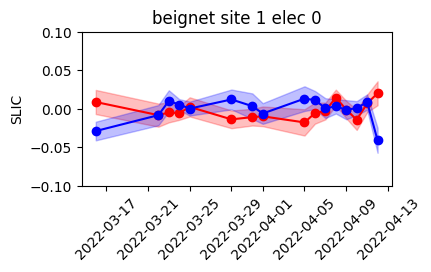

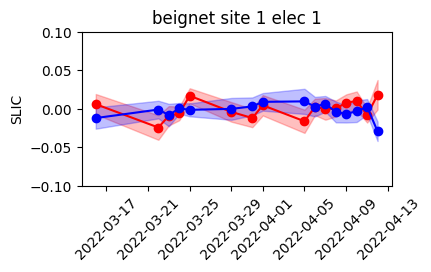

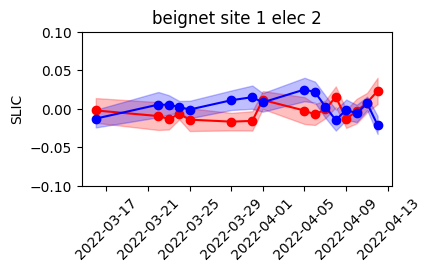

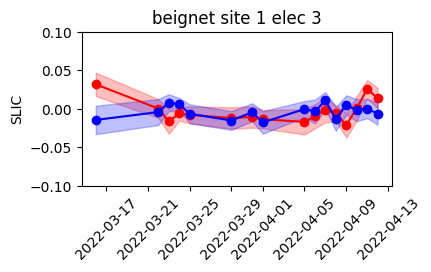

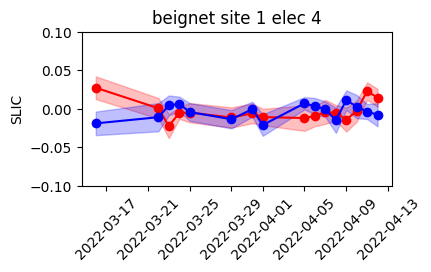

...

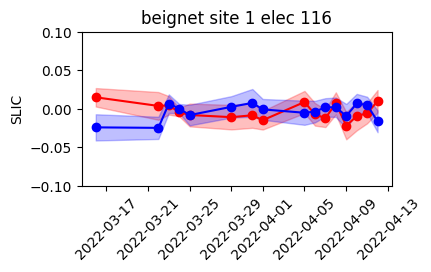

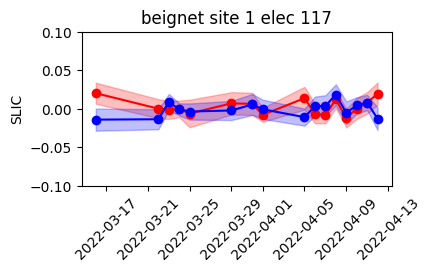

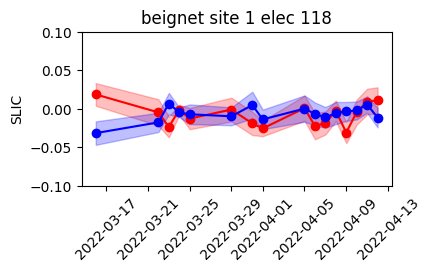

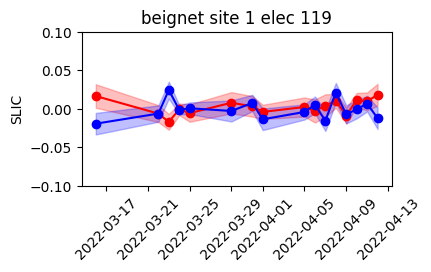

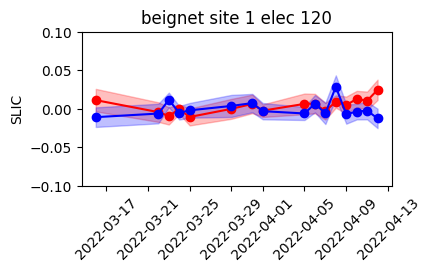

KeyboardInterrupt: 

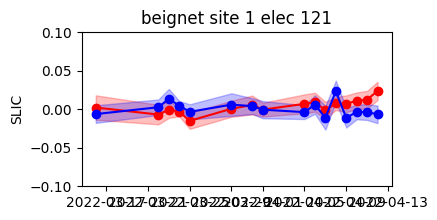

In [6]:
# For each stim site, for each electrode, plot the mean slic within/across days
subjects = np.unique(all_subject)
for subject in subjects:
    row_idx = np.array(all_subject) == subject
    stim_sites = np.unique(np.array(all_stim_site)[row_idx])
    for stim_site in stim_sites:
        all_row_idx = (np.array(all_subject) == subject) & (np.array(all_stim_site) == stim_site)
        
        # Just take the first division of trials (sometimes there are more than 1 because there are more trials)
        dist1_this_site = np.array([all_dist1[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
        dist2_this_site = np.array([all_dist2[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
        dates_this_site = [all_date[idx] for idx in range(len(all_row_idx)) if all_row_idx[idx]]
        
        print(np.shape(dist1_this_site))
        
        elec_pos, acq_ch, elecs = aopy.data.load_chmap()

        for elec_idx in range(len(elecs)):
            
            plt.figure(figsize=(4,2))
            elec1m = np.mean(dist1_this_site[:,:,elec_idx], axis=1)
            elec2m = np.mean(dist2_this_site[:,:,elec_idx], axis=1)
            elec1s = np.std(dist1_this_site[:,:,elec_idx], axis=1)
            elec2s = np.std(dist2_this_site[:,:,elec_idx], axis=1)
            plt.fill_between(dates_this_site, elec1m-elec1s, elec1m+elec1s, color='r', alpha=0.25)
            plt.fill_between(dates_this_site, elec2m-elec2s, elec2m+elec2s, color='b', alpha=0.25)
            plt.plot(dates_this_site, elec1m, 'ro-')
            plt.plot(dates_this_site, elec2m, 'bo-')
            plt.title(f'{subject} site {stim_site} elec {elec_idx}')
            plt.ylabel('SLIC')
            plt.ylim(-0.1, 0.1)
            plt.xticks(rotation=45)
            
            plt.show()

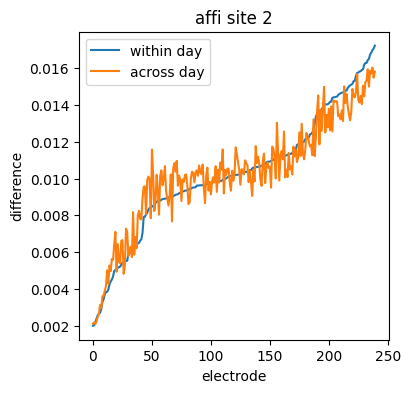

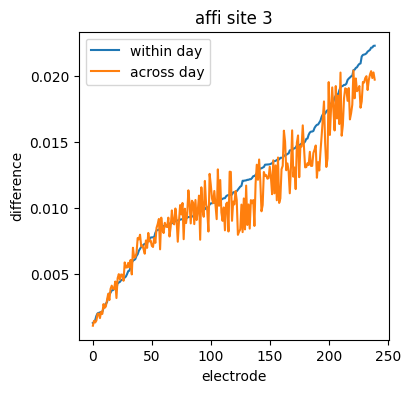

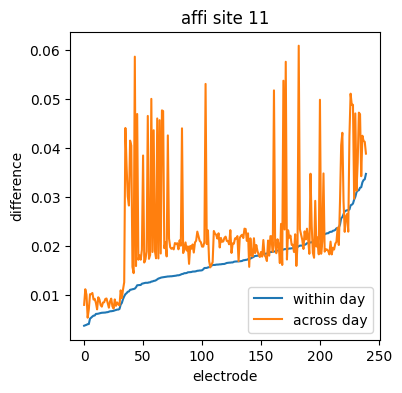

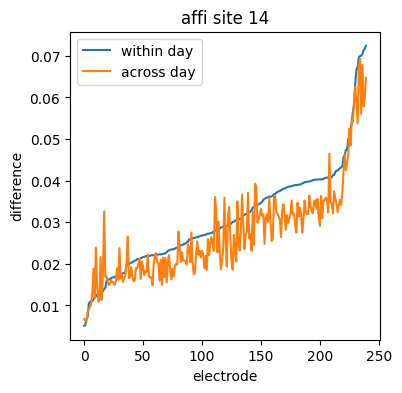

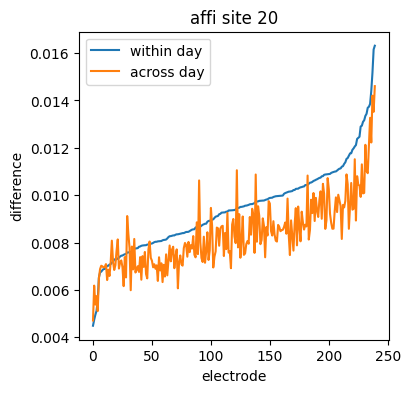

...

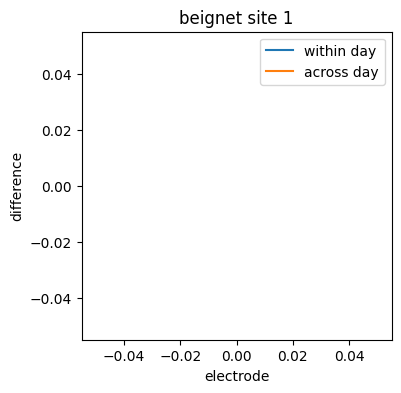

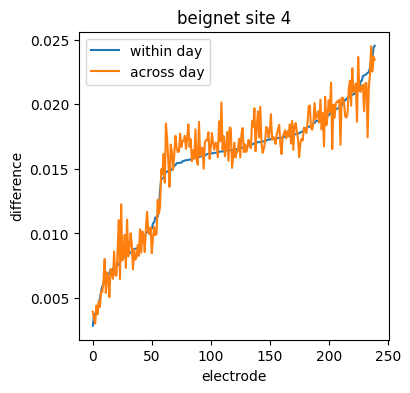

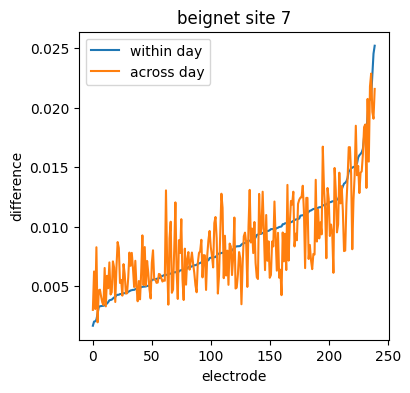

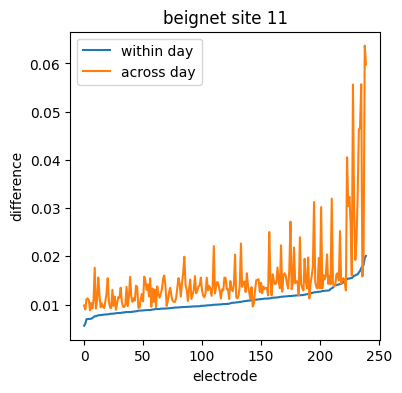

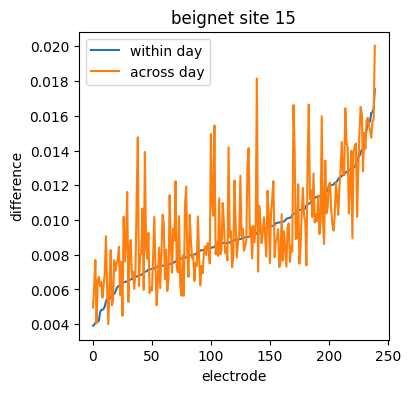

In [16]:
# Any electrodes where the post is consistently higher/lower than the pre
subjects = np.unique(all_subject)
for subject in subjects:
    row_idx = np.array(all_subject) == subject
    stim_sites = np.unique(np.array(all_stim_site)[row_idx])
    for stim_site in stim_sites:
        all_row_idx = (np.array(all_subject) == subject) & (np.array(all_stim_site) == stim_site)

        # Just take the first division of trials (sometimes there are more than 1 because there are more trials)
        dist1_this_site = np.array([all_dist1[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
        dist2_this_site = np.array([all_dist2[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
        dates_this_site = [all_date[idx] for idx in range(len(all_row_idx)) if all_row_idx[idx]]
                
        elec_pos, acq_ch, elecs = aopy.data.load_chmap()

        dist1m = np.mean(dist1_this_site, axis=1)
        dist2m = np.mean(dist2_this_site, axis=1)
        
        within_day_diff = np.mean(abs(dist1m-dist2m), axis=0) # average over days
        across_day_diff = np.mean([abs(np.diff(dist1m, axis=0)), abs(np.diff(dist2m, axis=0))], axis=(0,1))
        # print(within_day_diff.shape, across_day_diff.shape)
        sort_idx = np.argsort(within_day_diff)
        
        plt.figure(figsize=(4,4))
        plt.plot(within_day_diff[sort_idx])
        plt.plot(across_day_diff[sort_idx])
        plt.xlabel('electrode')
        plt.ylabel('difference')
        plt.title(f'{subject} site {stim_site}')
        plt.legend(['within day', 'across day'])

        plt.show()

(55, 40, 240)
(55, 240)


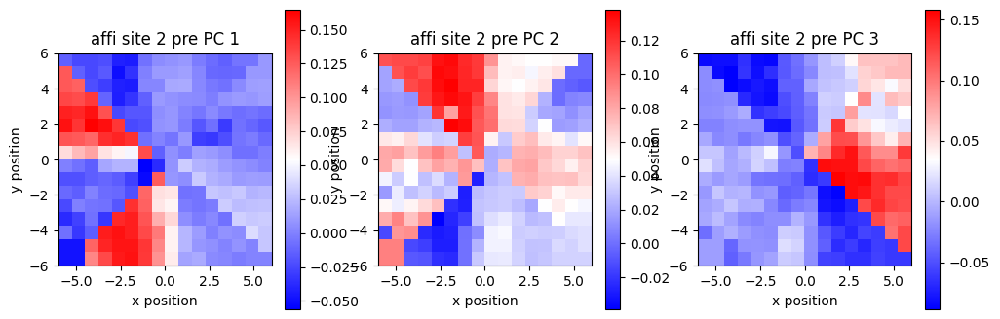

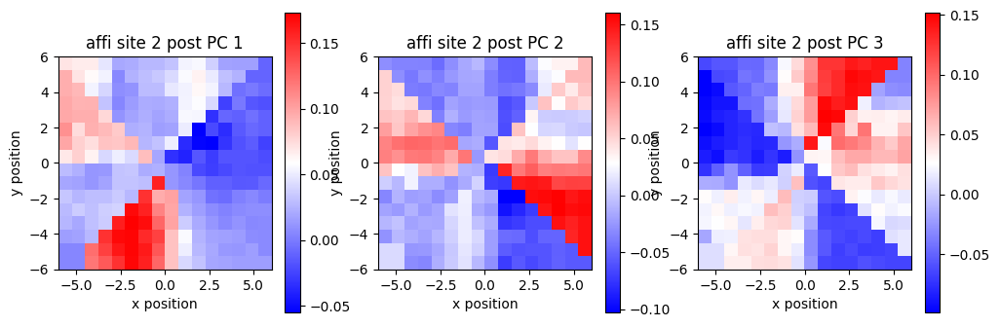

(22, 40, 240)
(22, 240)


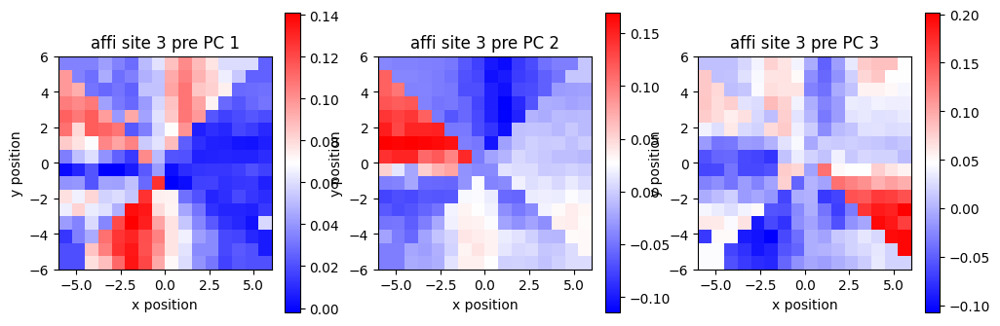

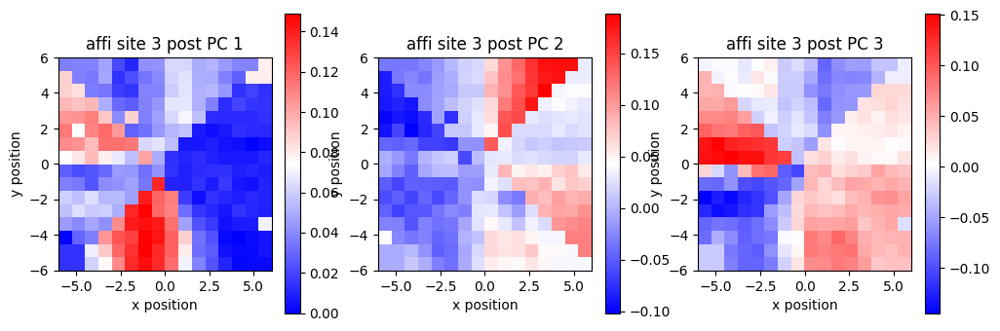

(18, 40, 240)
(18, 240)


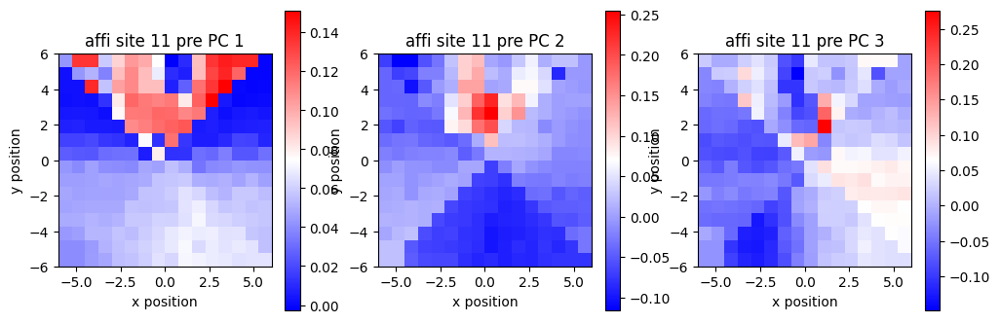

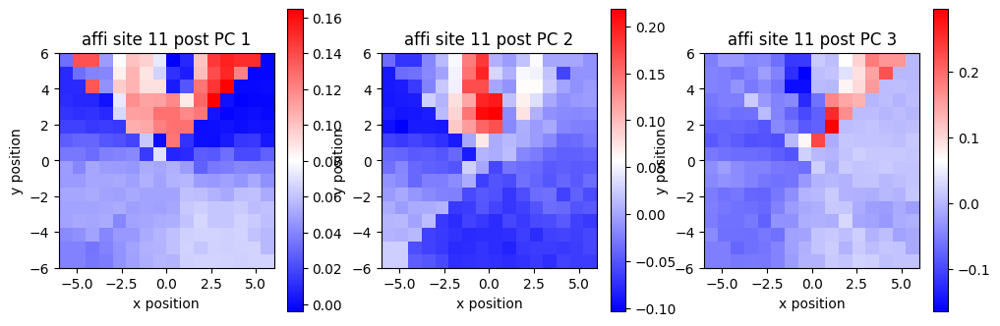

(16, 40, 240)
(16, 240)


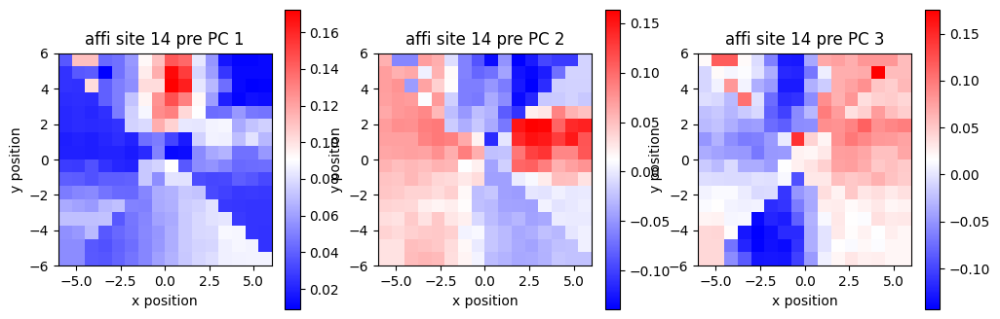

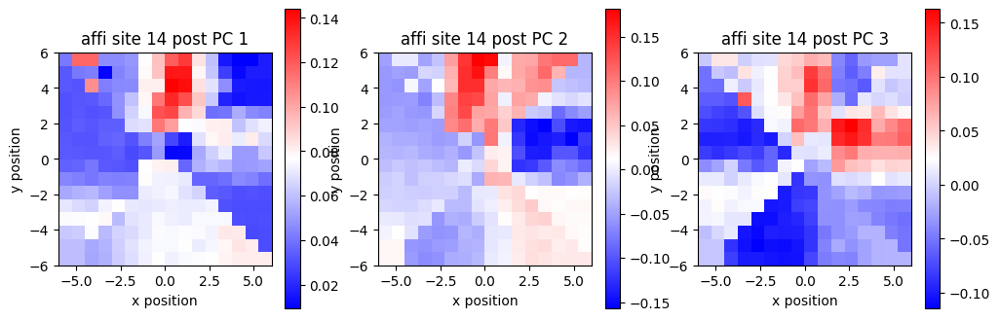

(36, 40, 240)
(36, 240)


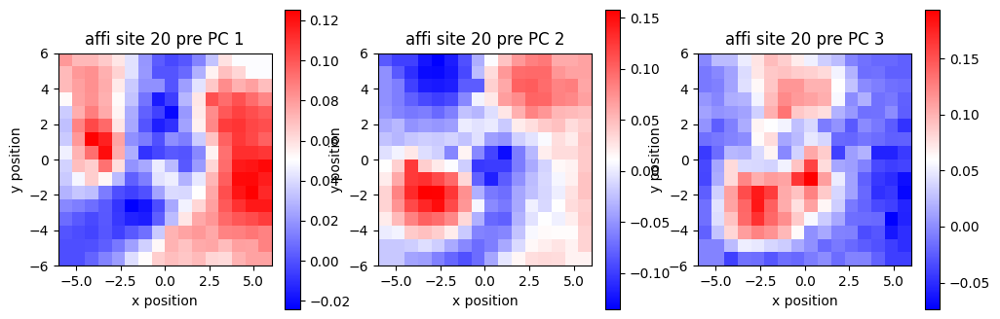

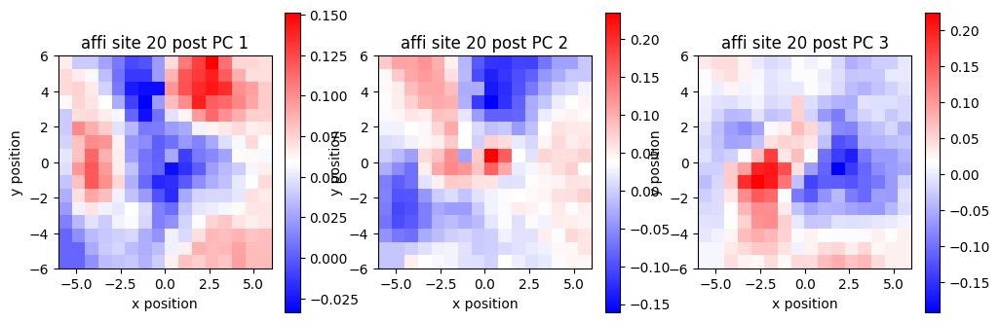

(111, 40, 240)
(111, 240)


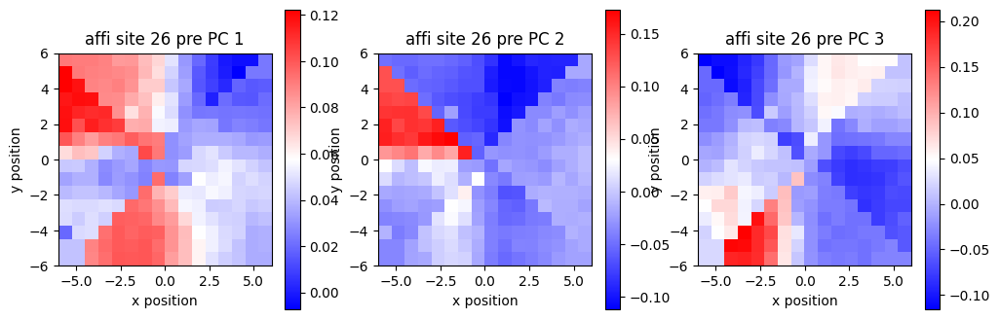

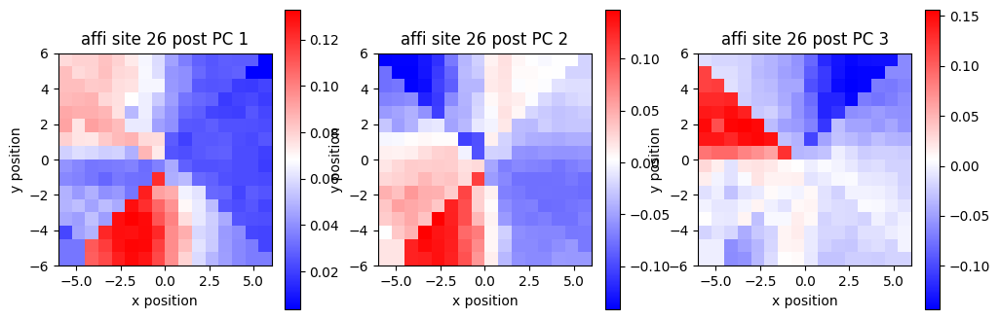

(43, 40, 240)
(43, 240)


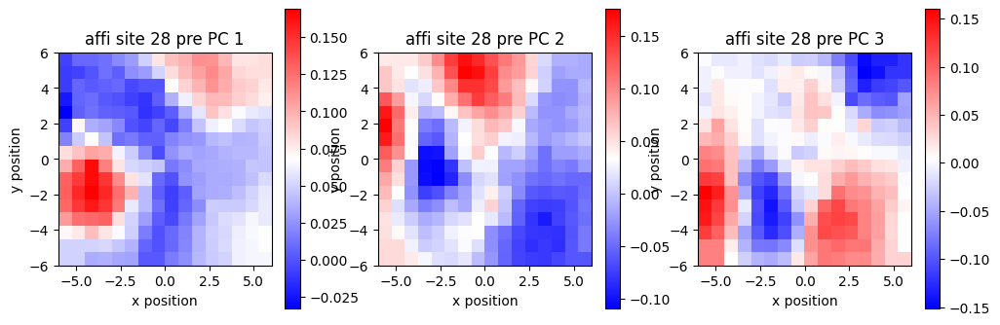

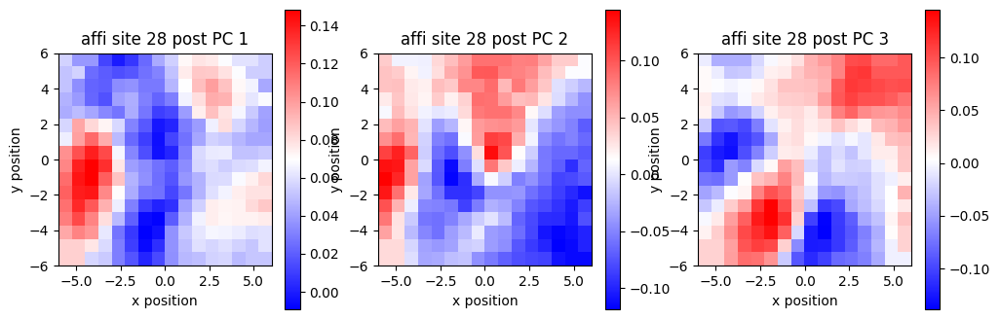

(101, 40, 240)
(101, 240)


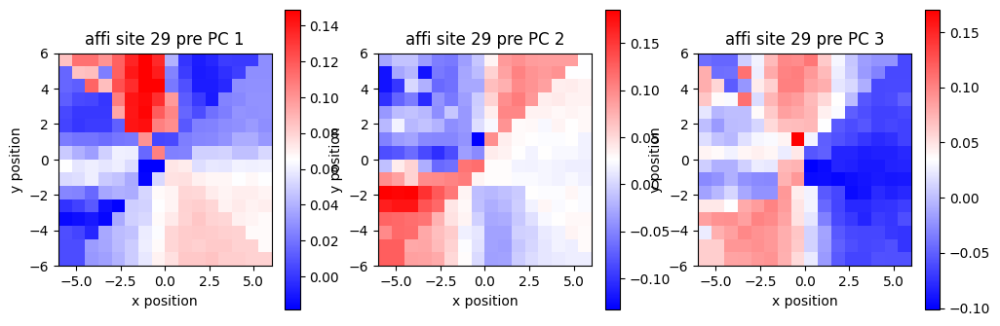

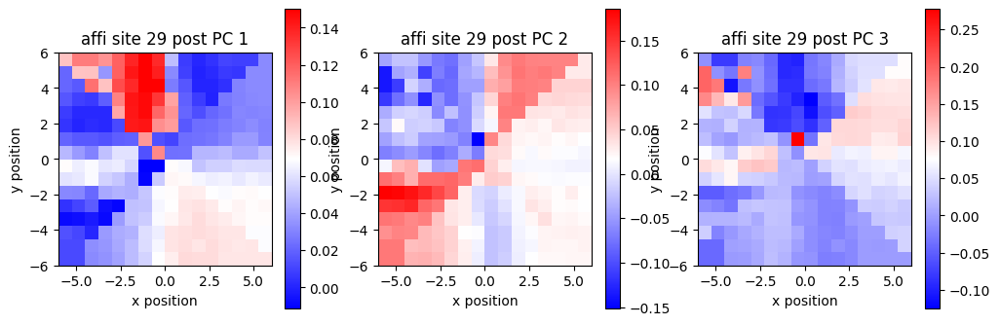

(26, 40, 240)
(26, 240)


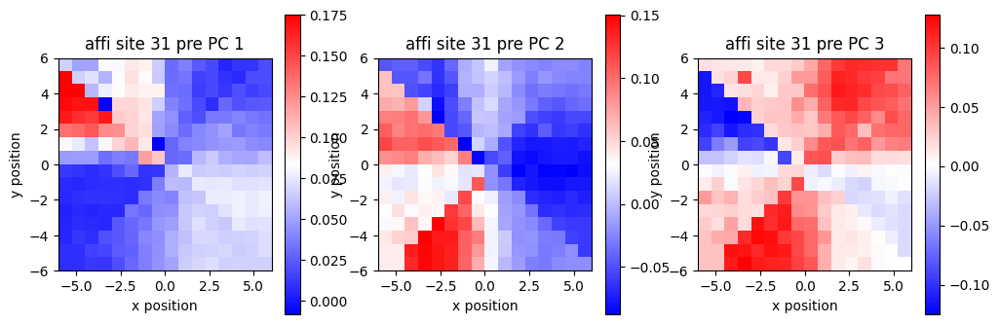

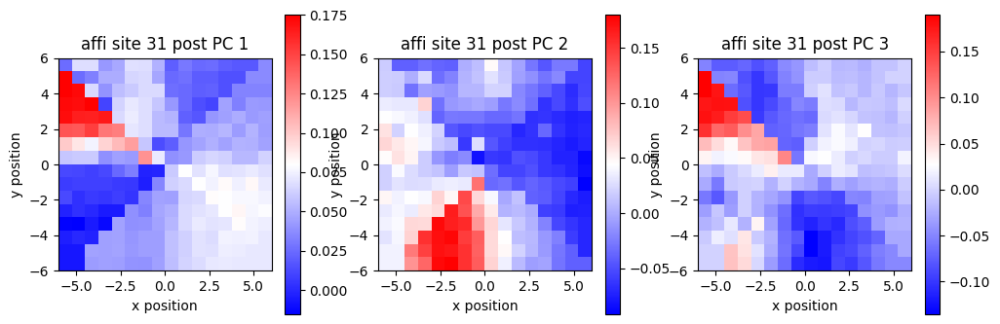

(16, 40, 240)
(16, 240)


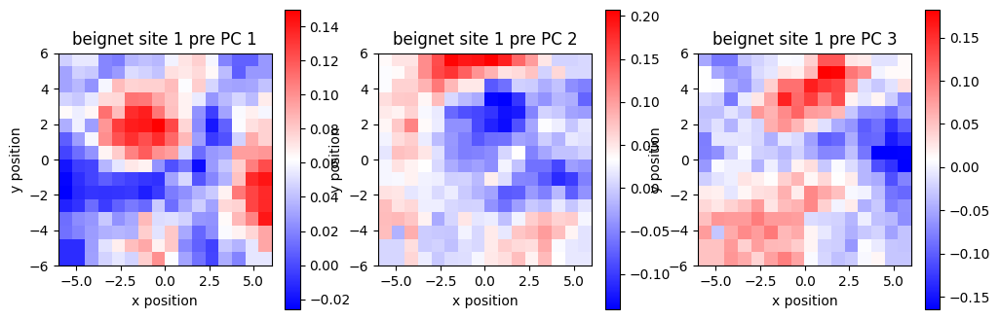

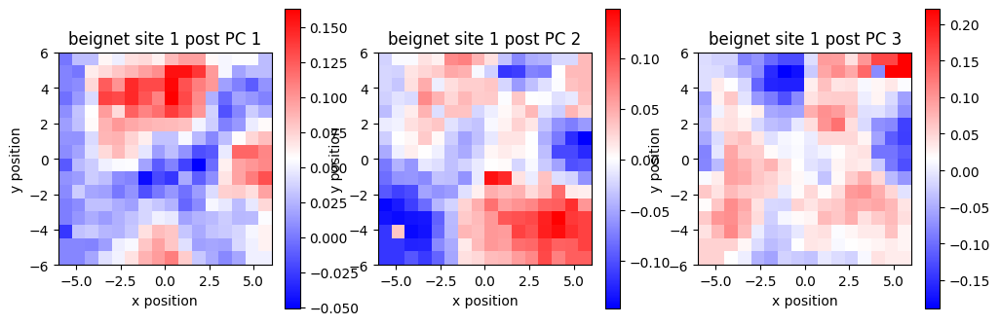

(17, 40, 240)
(17, 240)


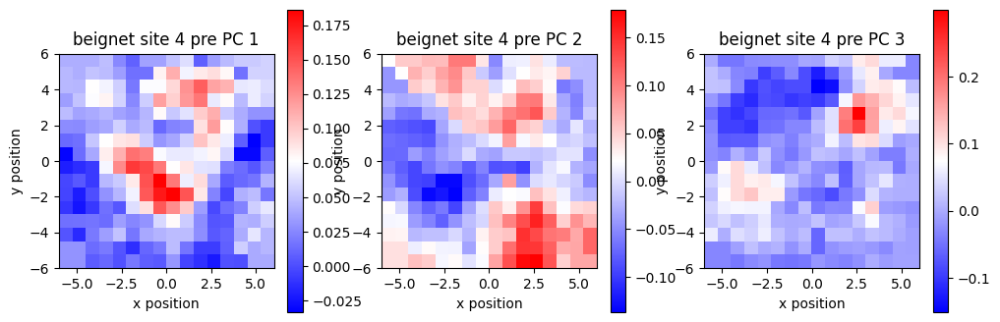

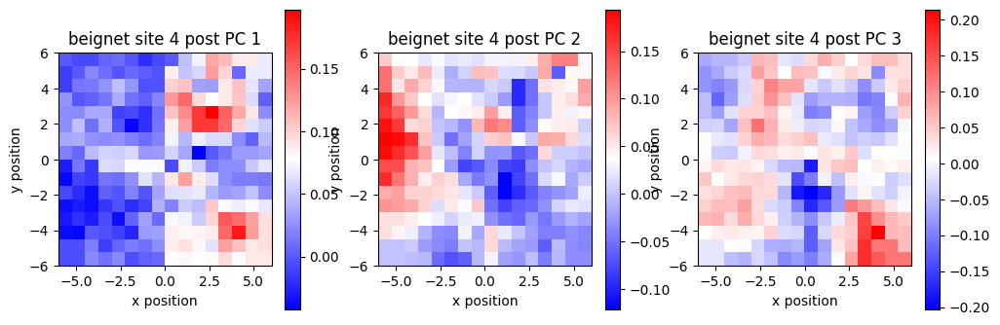

(17, 40, 240)
(17, 240)


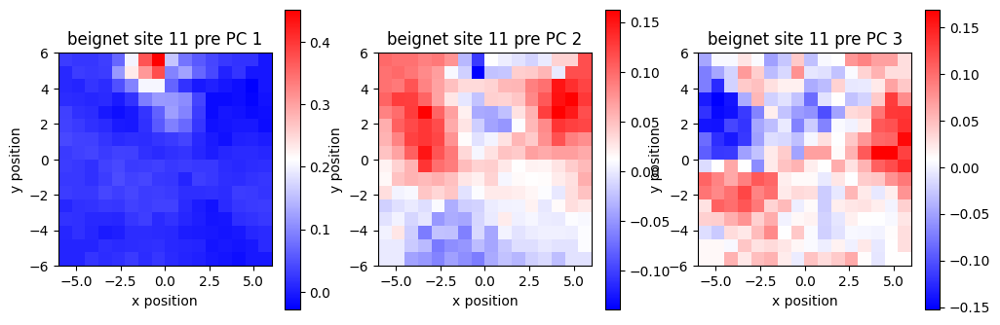

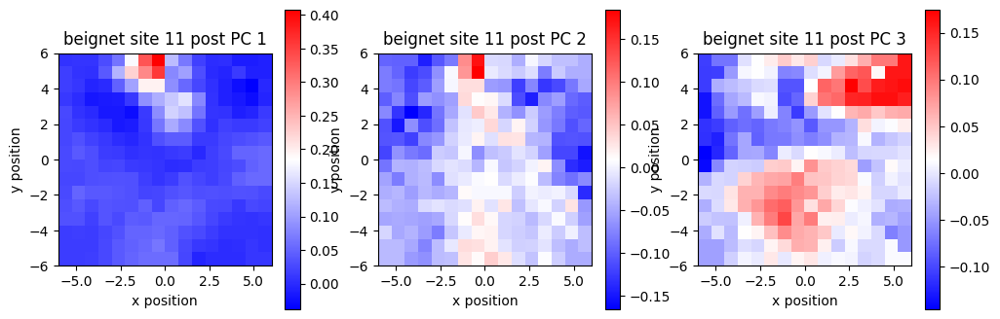

(9, 40, 240)
(9, 240)


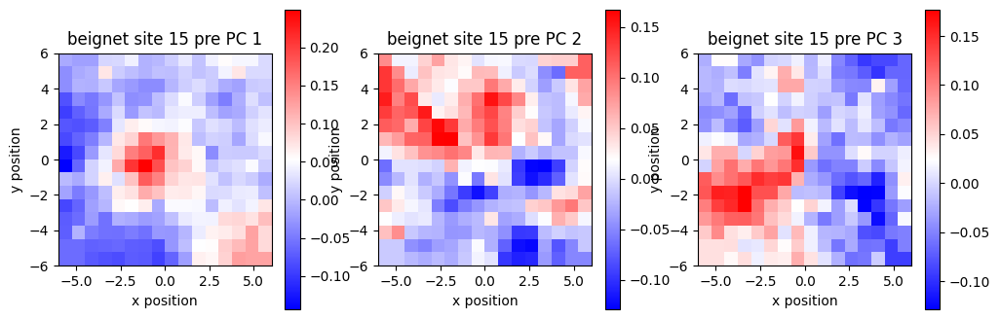

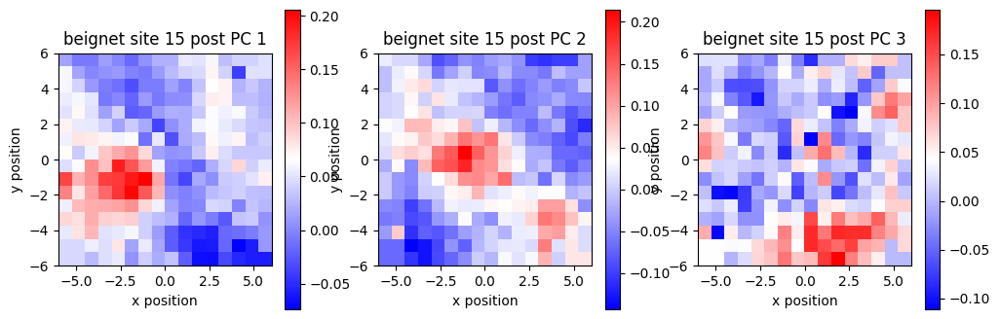

In [51]:
# Visualize the spatial variance modes
from sklearn.decomposition import PCA, NMF

def decompose_modes_pca(connectivity_maps, n_components=3):
    pca = PCA(n_components=n_components)
    pca_components = pca.fit_transform(connectivity_maps) # Temporal evolution (Scores)
    pca_maps = pca.components_ # Spatial patterns (Eigenvectors)
    return pca_maps

def plot_modes(maps, title, theta=0):
    fig, axes = plt.subplots(1, len(maps), figsize=(12, 4))
    for i, ax in enumerate(axes):
        im = aopy.visualization.plot_spatial_drive_map(maps[i], elec_data=True, theta=theta, ax=ax)
        ax.set_title(f'{title} PC {i+1}')
        plt.colorbar(im, ax=ax)
    plt.show()

# Any electrodes where the post is consistently higher/lower than the pre
subjects = np.unique(all_subject)
for subject in subjects:
    row_idx = np.array(all_subject) == subject
    stim_sites = np.unique(np.array(all_stim_site)[row_idx])
    for stim_site in stim_sites:
        all_row_idx = (np.array(all_subject) == subject) & (np.array(all_stim_site) == stim_site)
        
        # Just take the first division of trials (sometimes there are more than 1 because there are more trials)
        dist1_this_site = np.array([all_dist1[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
        dist2_this_site = np.array([all_dist2[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
        dates_this_site = [all_date[idx] for idx in range(len(all_row_idx)) if all_row_idx[idx]]
        
        print(np.shape(dist1_this_site))
        
        dist1m = np.mean(dist1_this_site, axis=1)
        dist2m = np.mean(dist2_this_site, axis=1)
        print(dist1m.shape)
        
        pca_maps = decompose_modes_pca(dist1m)
        plot_modes(pca_maps, f"{subject} site {stim_site} pre", theta=0)
        pca_maps = decompose_modes_pca(dist2m)
        plot_modes(pca_maps, f"{subject} site {stim_site} post", theta=0)



In [19]:
from dPCA import dPCA

def decompose_modes_dpca(dist1, dist2):
    '''
    gets (nt, ntr, nch) for dist1 and dist2
    wants (ntr, nch, ncond, nt)
    '''
    X = np.stack((dist1, dist2), axis=-1).transpose(1,2,3,0)

    # 't' = time, 'c' = condition
    labels = 'ct' 
    dpca = dPCA.dPCA(labels=labels, regularizer=1, n_components={'c': 1, 't': 10, 'ct': 3}) # 'auto'
    dpca.protect = ['t'] # Optional: protects the time structure from being mixed

    # dPCA takes the mean centered data for fitting
    Xtrial = np.mean(X, axis=0)
    X -= np.mean(X.reshape((X.shape[1],-1)),1)[:,None,None]
    Z = dpca.fit_transform(Xtrial, X)

    # Z is a dictionary where keys are the marginalizations ('t', 'c', 'ct')
    # and values are the projected data.
    condition_components = Z['c'] # pre/post condition
    time_components = Z['t']
    
    condition_decoder = dpca.D['c']
    time_decoder = dpca.D['t']
    
    return time_components, condition_components, time_decoder, condition_decoder


(240, 10)
(240, 1)


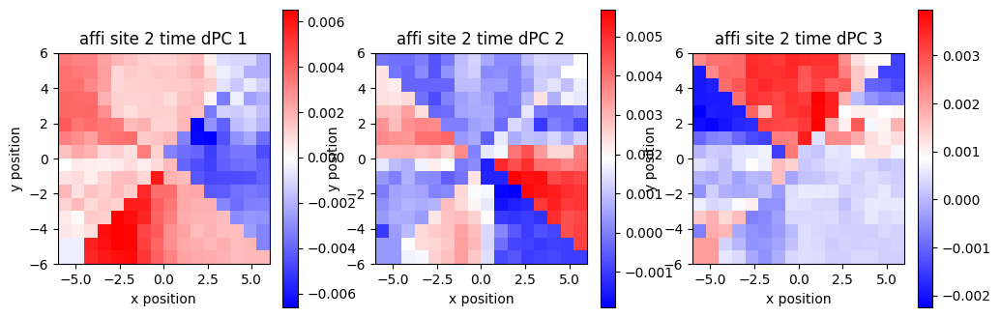

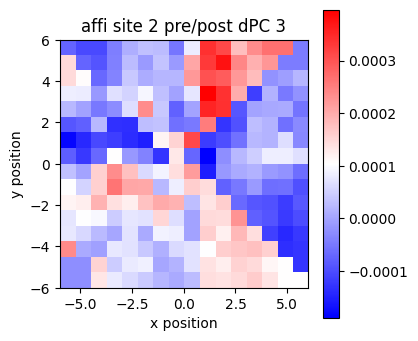

(240, 10)
(240, 1)


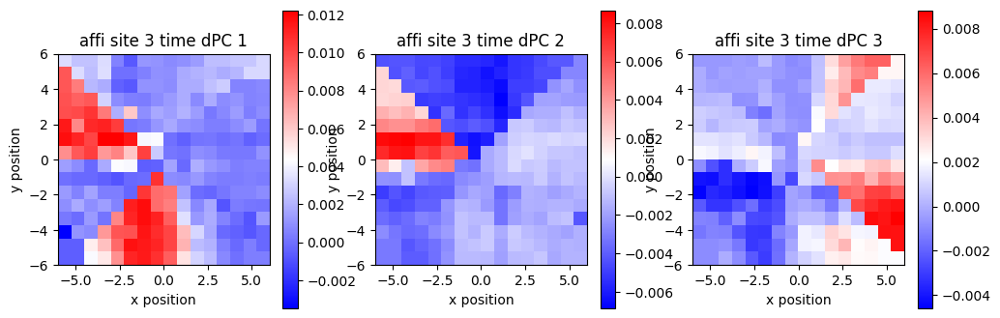

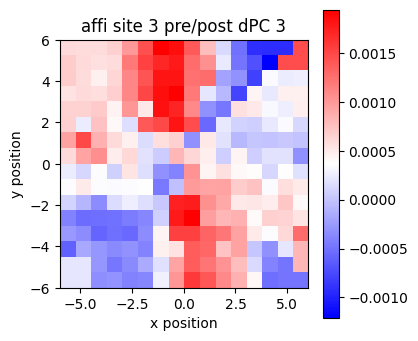

(240, 10)
(240, 1)


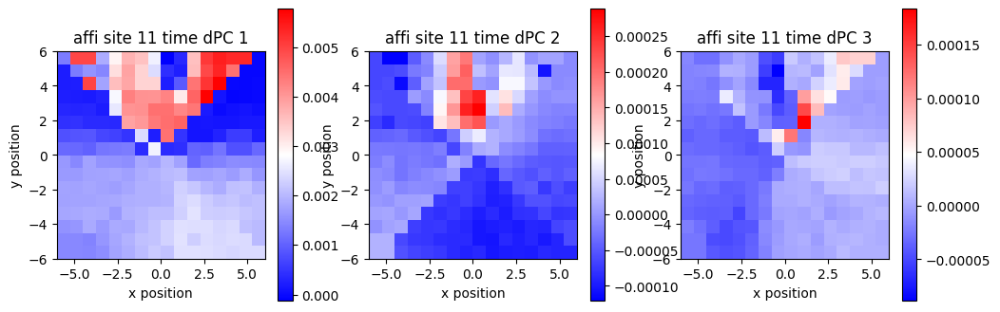

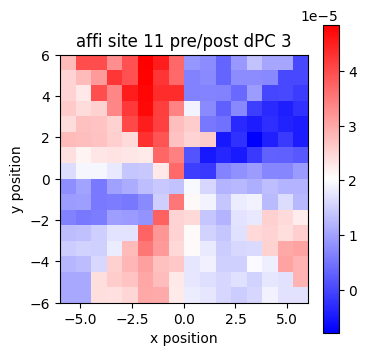

(240, 10)
(240, 1)


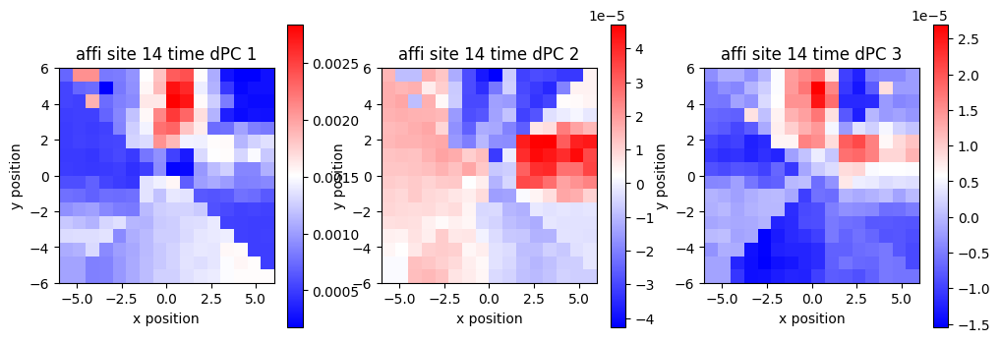

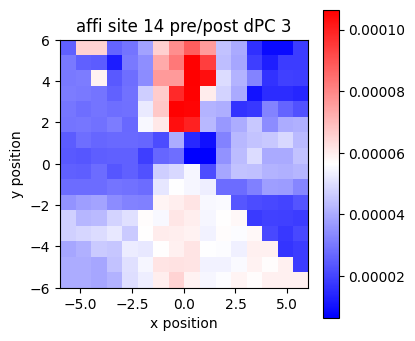

(240, 10)
(240, 1)


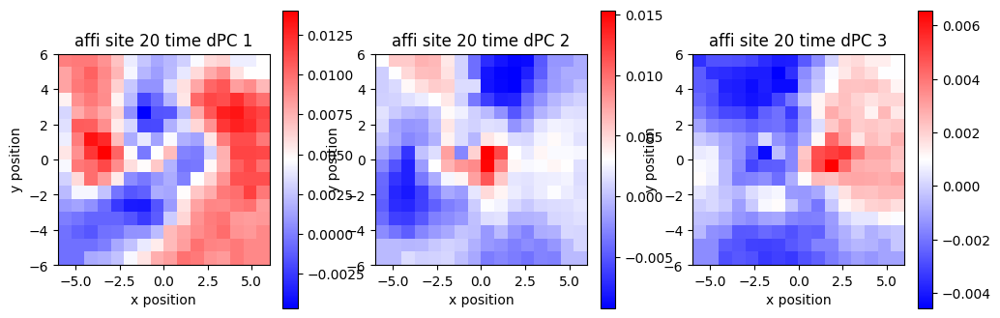

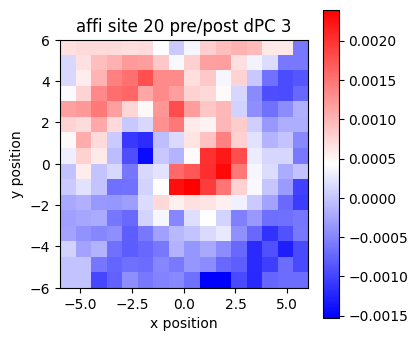

(240, 10)
(240, 1)


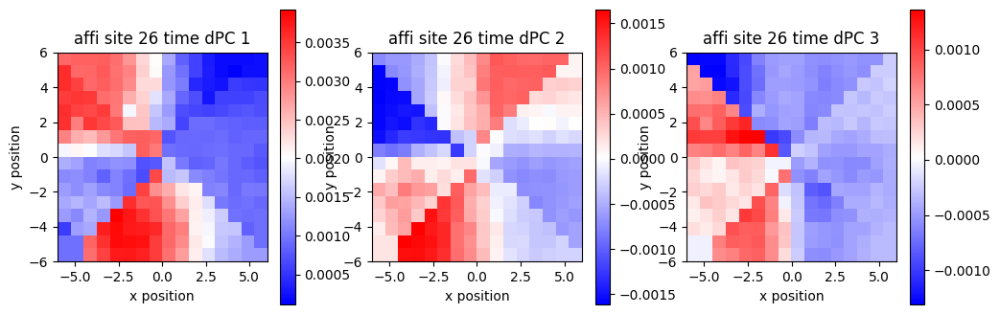

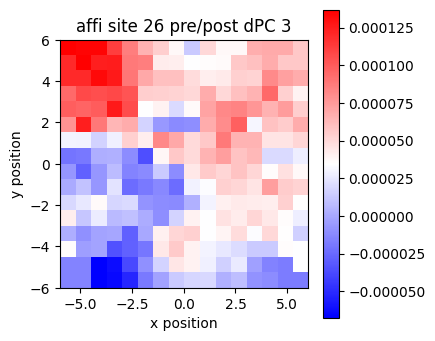

(240, 10)
(240, 1)


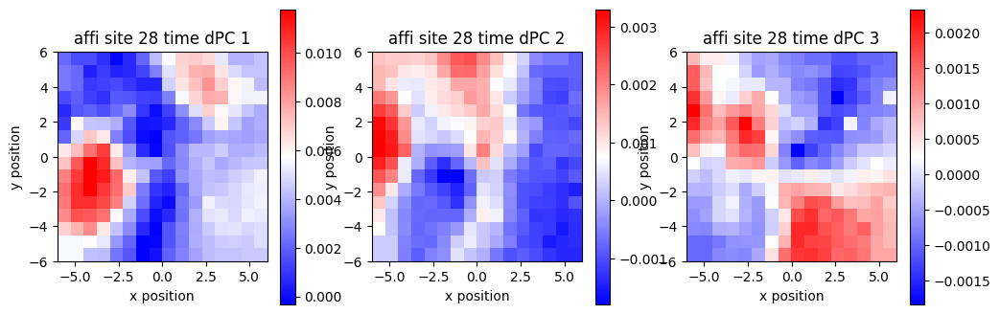

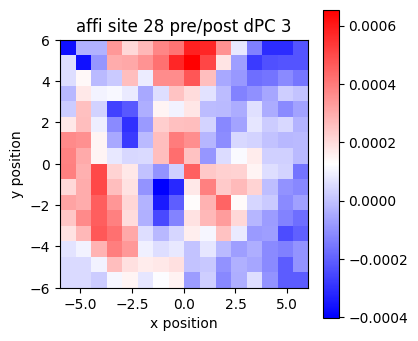

(240, 10)
(240, 1)


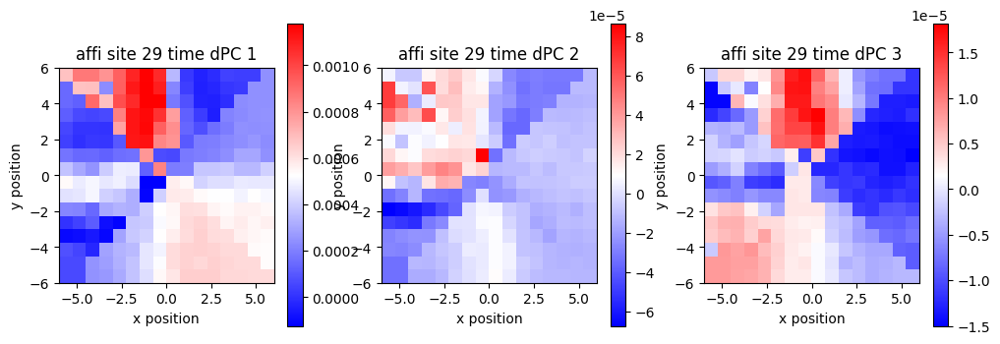

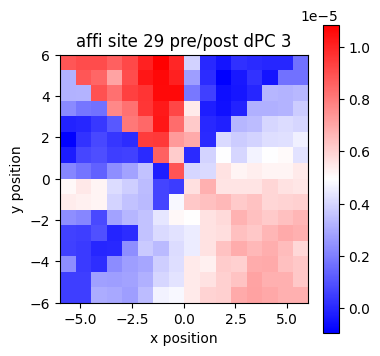

(240, 10)
(240, 1)


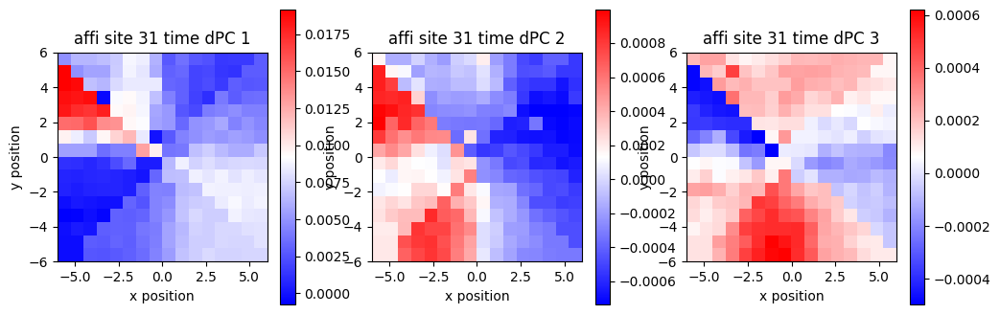

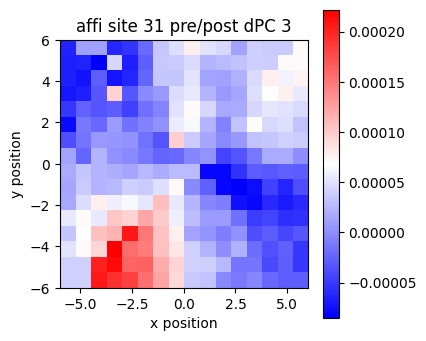

(240, 10)
(240, 1)


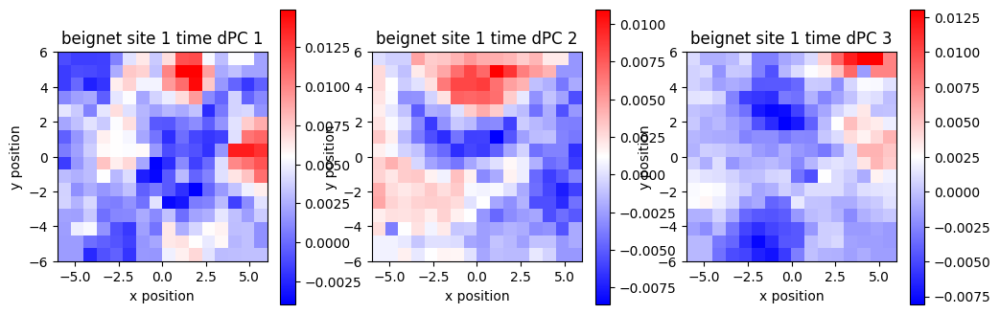

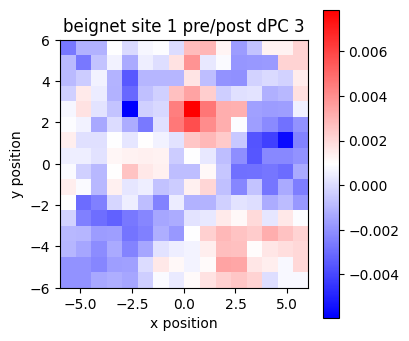

(240, 10)
(240, 1)


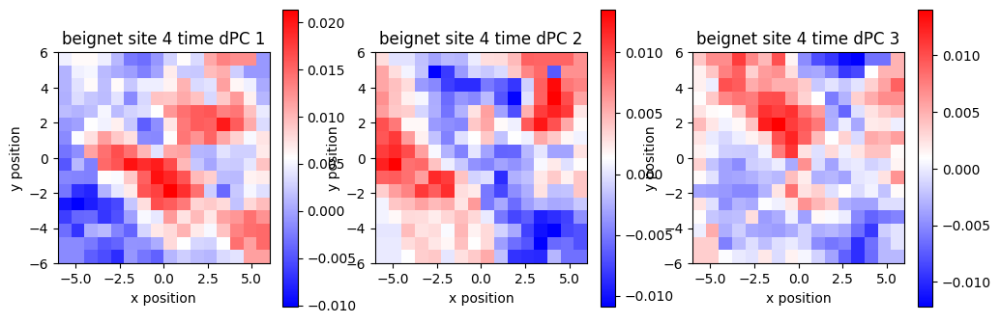

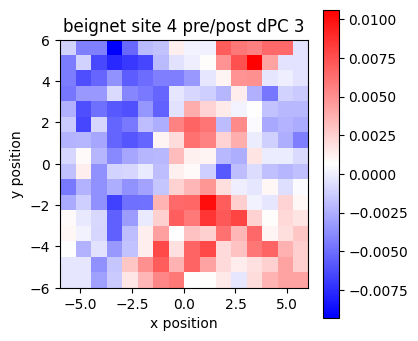

(240, 10)
(240, 1)


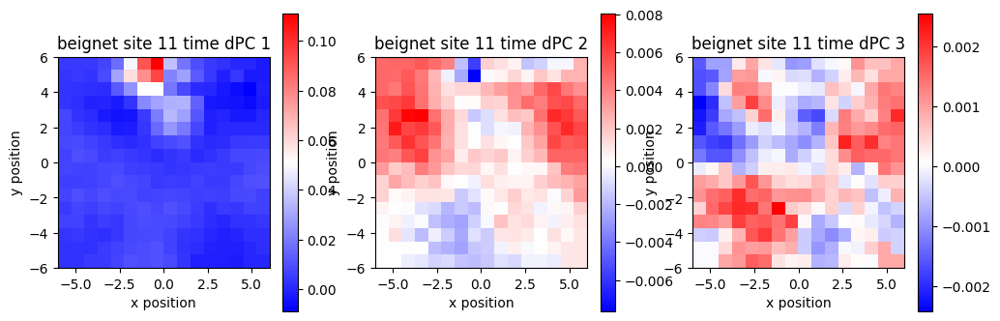

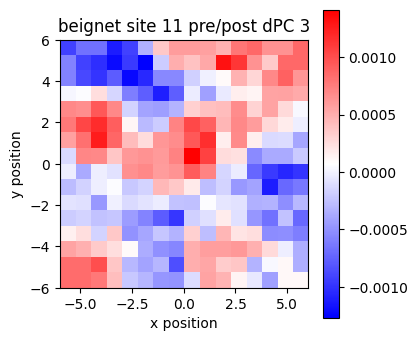

(240, 10)
(240, 1)


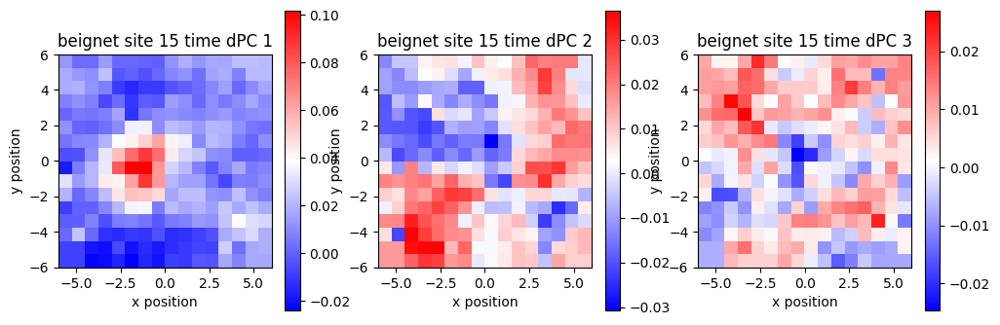

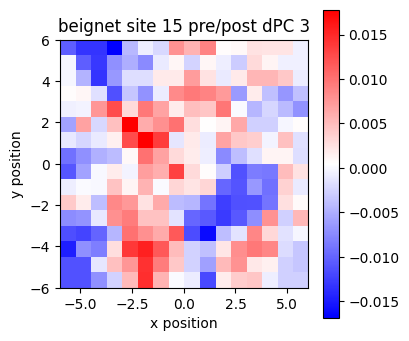

In [23]:
# Use dPCA

subjects = np.unique(all_subject)
for subject in subjects:
    row_idx = np.array(all_subject) == subject
    stim_sites = np.unique(np.array(all_stim_site)[row_idx])
    for stim_site in stim_sites:
        all_row_idx = (np.array(all_subject) == subject) & (np.array(all_stim_site) == stim_site)
        
        # Just take the first division of trials (sometimes there are more than 1 because there are more trials)
        dist1_this_site = np.array([all_dist1[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
        dist2_this_site = np.array([all_dist2[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
        dates_this_site = [all_date[idx] for idx in range(len(all_row_idx)) if all_row_idx[idx]]
                
        tc, cc, td, cd = decompose_modes_dpca(dist1_this_site, dist2_this_site)
        print(td.shape)
        print(cd.shape)
        
        maps = td[:,:3].T
        fig, axes = plt.subplots(1, len(maps), figsize=(12, 4))
        for i, ax in enumerate(axes):
            im = aopy.visualization.plot_spatial_drive_map(maps[i], elec_data=True, theta=0, ax=ax)
            ax.set_title(f'{subject} site {stim_site} time dPC {i+1}')
            plt.colorbar(im, ax=ax)
        plt.show()
        
        maps = cd.T
        fig, ax = plt.subplots(1, 1, figsize=(4, 4))
        im = aopy.visualization.plot_spatial_drive_map(maps[0], elec_data=True, theta=0, ax=ax)
        ax.set_title(f'{subject} site {stim_site} pre/post dPC {i+1}')
        plt.colorbar(im, ax=ax)
        plt.show()




In [77]:
# Again dPCA but targeted to specific dates where BCI experiments were happening
# subject = 'affi'
# date_range = ['04-07-2024', '05-04-2024']
# subject = 'affi'
# date_range = ['07-28-2023', '08-13-2023']
subject = 'beignet'
date_range = ['06-07-2022', '06-18-2022']
# subject = 'beignet'
# date_range = ['03-22-2022', '04-01-2022']
start_date = datetime_obj = datetime.strptime((date_range[0]), '%m-%d-%Y').date()
end_date = datetime_obj = datetime.strptime((date_range[1]), '%m-%d-%Y').date()
print(start_date, end_date)
date_idx = [(date >= start_date) & (date < end_date) for date in all_date]
print(np.sum(date_idx), 'days in range')
print(np.array(all_date)[date_idx])

2022-06-07 2022-06-18
17 days in range
[datetime.date(2022, 6, 10) datetime.date(2022, 6, 10)
 datetime.date(2022, 6, 11) datetime.date(2022, 6, 11)
 datetime.date(2022, 6, 11) datetime.date(2022, 6, 12)
 datetime.date(2022, 6, 12) datetime.date(2022, 6, 12)
 datetime.date(2022, 6, 14) datetime.date(2022, 6, 14)
 datetime.date(2022, 6, 14) datetime.date(2022, 6, 15)
 datetime.date(2022, 6, 15) datetime.date(2022, 6, 15)
 datetime.date(2022, 6, 16) datetime.date(2022, 6, 16)
 datetime.date(2022, 6, 16)]


In [85]:
# Now just plot individual electrodes
# readout_acq_ch = np.array([ 55,  58,  60,  64,  91,  97, 104, 113, 211, 217, 223, 227, 247, 250, 252, 256])
# readout_acq_ch = np.array([ 211, 217, 223, 227, 247, 250, 252, 256])
if subject == 'beignet':
    readout_acq_ch = np.array([ 50,  85,  93, 100, 105, 118])
else:
    readout_acq_ch = np.array([ 211, 217, 223, 227, 247, 250, 252, 256])

elec_pos, acq_ch, elecs = aopy.data.load_chmap()
readout_idx = np.isin(acq_ch, readout_acq_ch)
print(np.sum(readout_idx))

6


[ 1  4 11]
(5, 40, 240)
[0 0 0 0 0]
[7680    0    0    0    0]
5 4
(240, 10)
(240, 1)


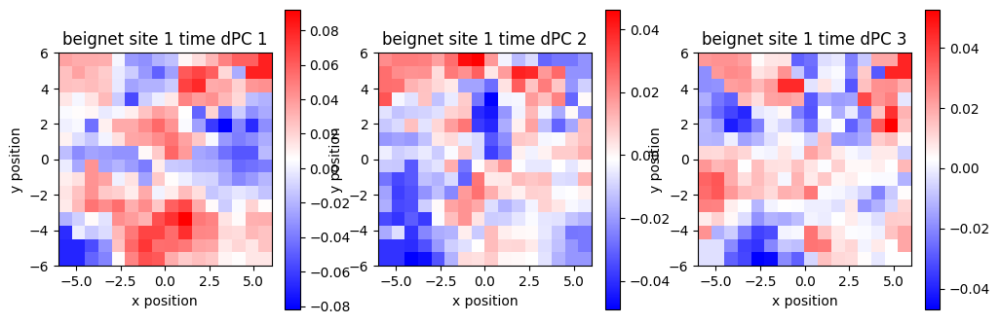

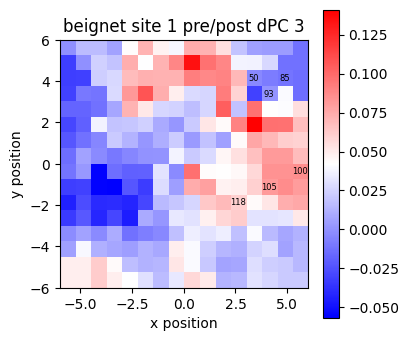

(2, 4) 4


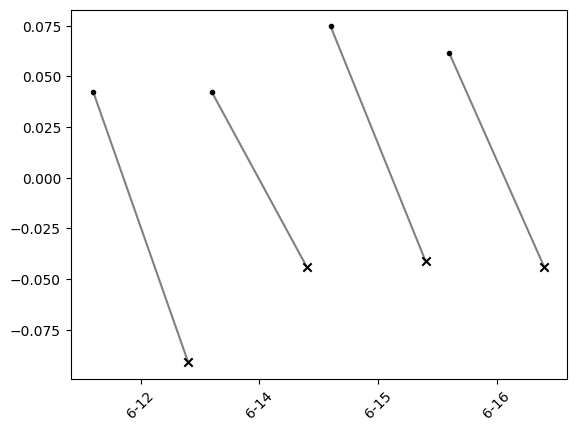

(6, 40, 240)
[0 0 0 0 0 0]
[0 0 0 0 0 0]
6 6
(240, 10)
(240, 1)


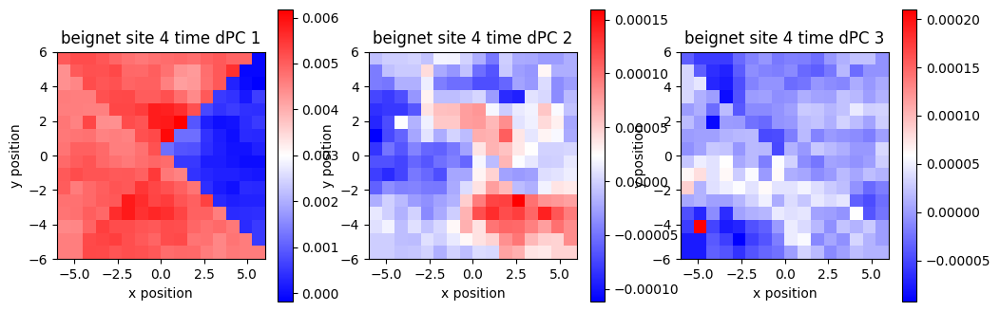

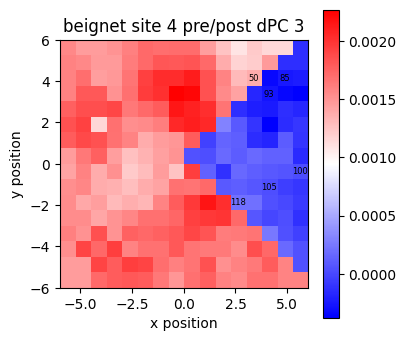

(2, 6) 6


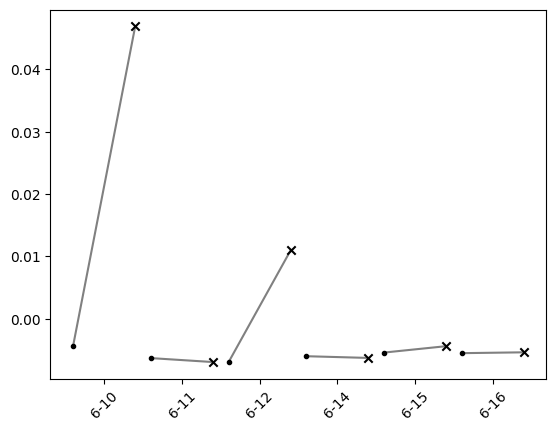

(6, 40, 240)
[0 0 0 0 0 0]
[0 0 0 0 0 0]
6 6
(240, 10)
(240, 1)


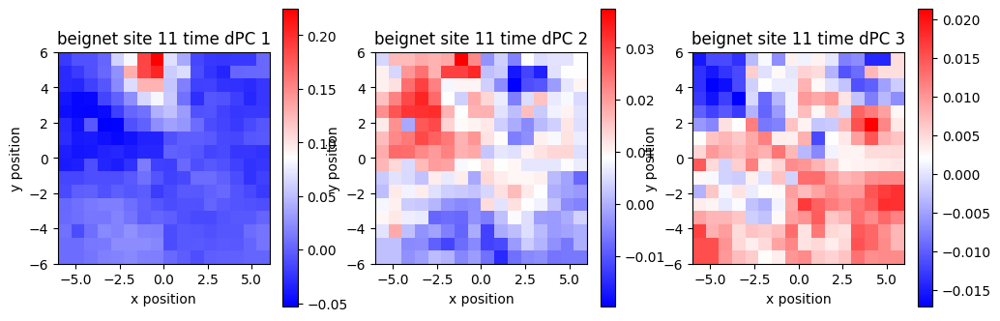

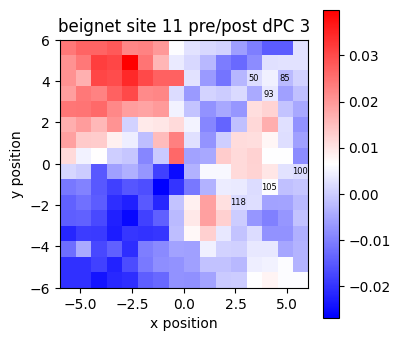

(2, 6) 6


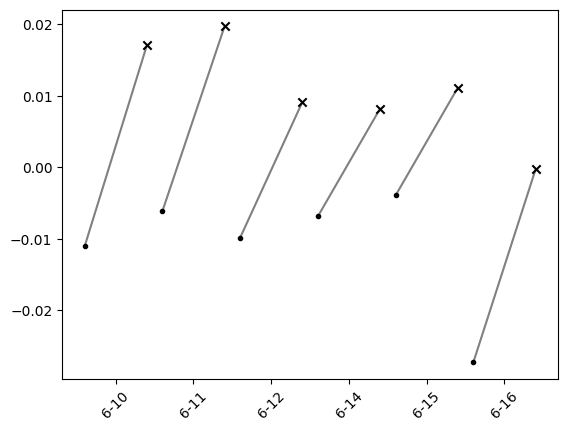

In [83]:
row_idx = (np.array(all_subject) == subject) & date_idx
stim_sites = np.unique(np.array(all_stim_site)[row_idx])
print(stim_sites)
for stim_site in stim_sites:
    all_row_idx = (np.array(all_subject) == subject) & (np.array(all_stim_site) == stim_site) & row_idx

    # Just take the first division of trials (sometimes there are more than 1 because there are more trials)
    dist1_this_site = np.array([all_dist1[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
    dist2_this_site = np.array([all_dist2[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
    dates_this_site = np.array([all_date[idx] for idx in range(len(all_row_idx)) if all_row_idx[idx]])

    print(dist1_this_site.shape)
    print(np.count_nonzero(np.isnan(dist1_this_site), axis=(1,2)))
    print(np.count_nonzero(np.isnan(dist2_this_site), axis=(1,2)))
    date_filter1 = np.count_nonzero(np.isnan(dist1_this_site), axis=(1,2)) == 0
    date_filter2 = np.count_nonzero(np.isnan(dist2_this_site), axis=(1,2)) == 0
    date_filter = date_filter1 & date_filter2
    print(len(date_filter), np.sum(date_filter))
    dist1_this_site = dist1_this_site[date_filter]
    dist2_this_site = dist2_this_site[date_filter]
    dates_this_site = dates_this_site[date_filter]
                                    
    tc, cc, td, cd = decompose_modes_dpca(dist1_this_site, dist2_this_site)
    print(td.shape)
    print(cd.shape)

    maps = td[:,:3].T
    fig, axes = plt.subplots(1, len(maps), figsize=(12, 4))
    for i, ax in enumerate(axes):
        im = aopy.visualization.plot_spatial_drive_map(maps[i], elec_data=True, theta=0, ax=ax)
        ax.set_title(f'{subject} site {stim_site} time dPC {i+1}')
        plt.colorbar(im, ax=ax)
    plt.show()

    maps = cd.T
    fig, ax = plt.subplots(1, 1, figsize=(4, 4))
    im = aopy.visualization.plot_spatial_drive_map(maps[0], elec_data=True, theta=0, ax=ax)
    ax.set_title(f'{subject} site {stim_site} pre/post dPC {i+1}')
    aopy.visualization.annotate_spatial_map_channels(acq_ch=readout_acq_ch, ax=ax)
    plt.colorbar(im, ax=ax)
    plt.show()

    # Now project the day dPC through each individual recording
    # day_dpc_weights = cc.reshape(-1, order='F')
    day_dpc_weights = cc[0]
    plt.figure()
    for day_idx in range(day_dpc_weights.shape[1]):
        plt.plot([day_idx-0.4, day_idx+0.4], day_dpc_weights[:,day_idx], '-', color='gray')
        plt.scatter(day_idx-0.4, day_dpc_weights[0,day_idx], marker='.', color='k', zorder=2)
        plt.scatter(day_idx+0.4, day_dpc_weights[1,day_idx], marker='x', color='k', zorder=2)

    print(day_dpc_weights.shape, len(dates_this_site))
    date_labels = [f'{d.month}-{d.day}' for d in dates_this_site]
    plt.xticks(range(len(date_labels)), date_labels, rotation=45)
    plt.show()


[ 1  4 11]
(5, 40, 240)
[0 0 0 0 0]
[7680    0    0    0    0]
5 4
tc (10, 2, 4)
cc (1, 2, 4)
td (240, 10)
cd (240, 1)
m1 (5, 6)
m2 (5, 6)


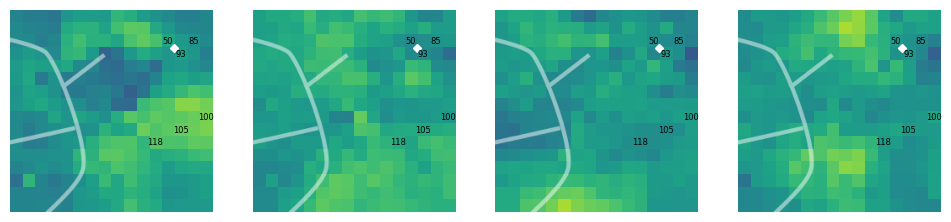

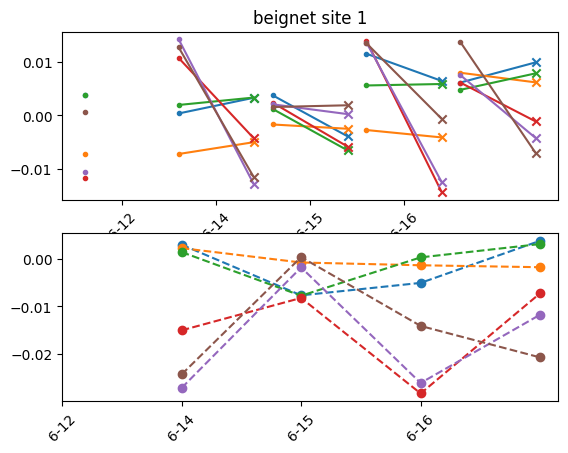

(6, 40, 240)
[0 0 0 0 0 0]
[0 0 0 0 0 0]
6 6
tc (10, 2, 6)
cc (1, 2, 6)
td (240, 10)
cd (240, 1)
m1 (6, 6)
m2 (6, 6)


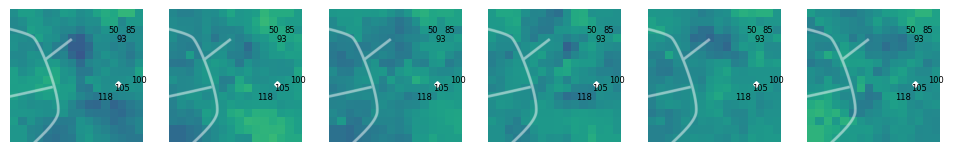

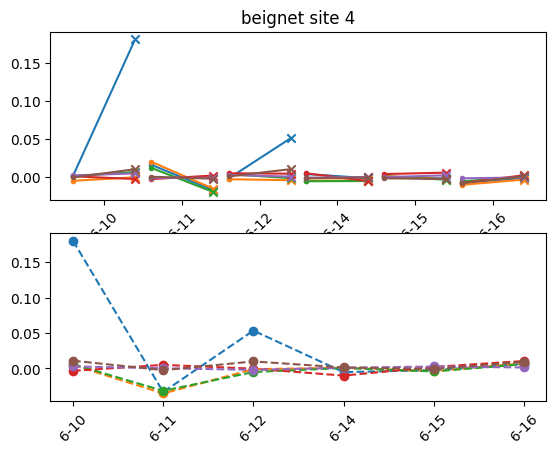

(6, 40, 240)
[0 0 0 0 0 0]
[0 0 0 0 0 0]
6 6
tc (10, 2, 6)
cc (1, 2, 6)
td (240, 10)
cd (240, 1)
m1 (6, 6)
m2 (6, 6)


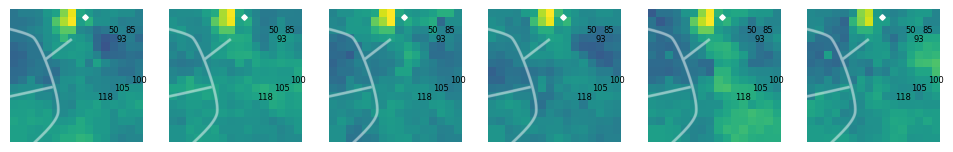

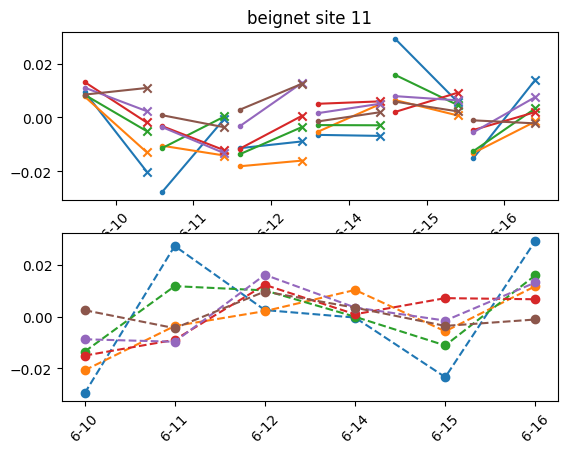

In [84]:
row_idx = (np.array(all_subject) == subject) & date_idx
stim_sites = np.unique(np.array(all_stim_site)[row_idx])
print(stim_sites)
for stim_site in stim_sites:
    all_row_idx = (np.array(all_subject) == subject) & (np.array(all_stim_site) == stim_site) & row_idx

    # Just take the first division of trials (sometimes there are more than 1 because there are more trials)
    dist1_this_site = np.array([all_dist1[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
    dist2_this_site = np.array([all_dist2[idx][:,0,:] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
    dates_this_site = np.array([all_date[idx] for idx in range(len(all_row_idx)) if all_row_idx[idx]])
    m1 = np.mean(dist1_this_site[:,:,readout_idx], axis=1)
    m2 = np.mean(dist2_this_site[:,:,readout_idx], axis=1)
    
    print(dist1_this_site.shape)
    print(np.count_nonzero(np.isnan(dist1_this_site), axis=(1,2)))
    print(np.count_nonzero(np.isnan(dist2_this_site), axis=(1,2)))
    date_filter1 = np.count_nonzero(np.isnan(dist1_this_site), axis=(1,2)) == 0
    date_filter2 = np.count_nonzero(np.isnan(dist2_this_site), axis=(1,2)) == 0
    date_filter = date_filter1 & date_filter2
    print(len(date_filter), np.sum(date_filter))
    dist1_this_site = dist1_this_site[date_filter]
    dist2_this_site = dist2_this_site[date_filter]
    dates_this_site = dates_this_site[date_filter]
                                    
    tc, cc, td, cd = decompose_modes_dpca(dist1_this_site, dist2_this_site)
    print('tc', tc.shape)
    print('cc', cc.shape)
    print('td', td.shape)
    print('cd', cd.shape)
    print('m1', m1.shape)
    print('m2', m2.shape)
    
    fig, axes = plt.subplots(1, len(dates_this_site), figsize=(12, 4))
    for i, ax in enumerate(axes):
        m = np.mean(dist1_this_site[:,i,:], axis=0)
        im, pcm = aopy.visualization.plot_annotated_spatial_drive_map_stim(
            m, stim_site, subject, 'lm1', 0, colorbar=False, ax=ax)
        im.set_clim(-0.05, 0.05)
        aopy.visualization.annotate_spatial_map_channels(acq_ch=readout_acq_ch, ax=ax)
    
    plt.figure()
    plt.subplot(2,1,1)
    plt.title(f'{subject} site {stim_site}')
    colors = sns.color_palette(n_colors=m1.shape[1])
    for elec_idx in range(m1.shape[1]):
        for day_idx in range(len(m1)):
            plt.plot([day_idx-0.4, day_idx+0.4], 
                     [m1[day_idx,elec_idx], m2[day_idx,elec_idx]], 
                     '-', color=colors[elec_idx])
            plt.scatter(day_idx-0.4, m1[day_idx,elec_idx], marker='.', color=colors[elec_idx], zorder=2)
            plt.scatter(day_idx+0.4, m2[day_idx,elec_idx], marker='x', color=colors[elec_idx], zorder=2)
    date_labels = [f'{d.month}-{d.day}' for d in dates_this_site]
    plt.xticks(range(len(date_labels)), date_labels, rotation=45)
    
    plt.subplot(2,1,2)
    plt.plot(m2-m1, 'o--')
    date_labels = [f'{d.month}-{d.day}' for d in dates_this_site]
    plt.xticks(range(len(date_labels)), date_labels, rotation=45)
    plt.show()


## Within-day vs across-day drift

Does the SLIC map drift systematically **within** a day (pre-session → post-session), and is that
drift larger or smaller than drift **across** days?

Everything below is a spatial correlation between two 240-channel maps, each built from
`n_trials=100` trials, so measurement noise is matched across all comparisons:

| | pairing | measures |
|---|---|---|
| `r_same` | same site-day, same condition, same bootstrap, div0 vs div1 (disjoint trials) | noise floor |
| `r_within` | same site-day, same bootstrap, pre div0 vs post div0 | within-day drift |
| `r_across` | same subject+site, same condition, different dates | across-day drift |

`r_within` is compared against the saved label shuffles (`all_shuff_dists1/2`), which is the
exact null for "pre and post trials are exchangeable".

**Note on condition order:** `compare_conditions_bootstrap_spatial_corr` sets
`conditions = np.unique(labels)`, and `np.unique(['pre','post']) -> ['post','pre']`. So
**`dist1`/`mean1` is post and `dist2`/`mean2` is pre** — the opposite of what cells above assume
(the red trace labelled "pre" in the per-electrode plots, and `m2-m1` labelled post-pre, are
both inverted).

In [29]:
# Requires all_* from the load cell above.
from scipy import stats

def corr_rows(A, B):
    '''NaN-aware Pearson between matched rows. A, B: (n, nch) -> (n,).
    Verified to match aopy.analysis.calc_spatial_data_correlation(interp=False,
    align_maps=False) to 7e-16.'''
    A = np.asarray(A, dtype=float); B = np.asarray(B, dtype=float)
    ok = np.isfinite(A) & np.isfinite(B)
    An = np.where(ok, A, np.nan); Bn = np.where(ok, B, np.nan)
    Am = An - np.nanmean(An, axis=1, keepdims=True)
    Bm = Bn - np.nanmean(Bn, axis=1, keepdims=True)
    num = np.nansum(Am*Bm, axis=1)
    den = np.sqrt(np.nansum(Am**2, axis=1) * np.nansum(Bm**2, axis=1))
    with np.errstate(invalid='ignore', divide='ignore'):
        return num / den

_subject = np.array(all_subject)
_site = np.array(all_stim_site)
_date = np.array(all_date)

rows = []
for i in tqdm(range(len(_subject))):
    post = np.asarray(all_dist1[i])   # conditions[0] == 'post'
    pre  = np.asarray(all_dist2[i])   # conditions[1] == 'pre'
    nboot, ndiv, nch = post.shape

    r_within = corr_rows(pre[:,0,:], post[:,0,:])

    # noise floor: disjoint trial groups within one bootstrap, same condition
    if ndiv >= 2:
        r_same = np.concatenate([corr_rows(pre[:,0,:],  pre[:,1,:]),
                                 corr_rows(post[:,0,:], post[:,1,:])])
    else:
        r_same = np.array([])   # 52/519 site-days only had one division

    null_means = np.array([
        np.nanmean(corr_rows(np.asarray(all_shuff_dists2[i][s])[:,0,:],
                             np.asarray(all_shuff_dists1[i][s])[:,0,:]))
        for s in range(len(all_shuff_dists1[i]))
    ])

    obs = np.nanmean(r_within)
    nm, ns = np.nanmean(null_means), np.nanstd(null_means)
    rows.append(dict(
        subject=_subject[i], site=int(_site[i]), date=_date[i], ndiv=ndiv,
        r_within=obs, r_within_sd=np.nanstd(r_within),
        r_same=np.nanmean(r_same) if r_same.size else np.nan,
        null_mean=nm, null_sd=ns, delta=obs-nm,
        z=(obs-nm)/ns if ns > 0 else np.nan,
        p_emp=(1 + np.sum(null_means <= obs)) / (1 + len(null_means)),
    ))

df_siteday = pd.DataFrame(rows)
df_siteday['combo'] = df_siteday['subject'] + '_s' + df_siteday['site'].astype(str)
print(len(df_siteday), 'site-days;', df_siteday.r_same.notna().sum(), 'with ndiv>=2')
display(df_siteday[['r_same','r_within','null_mean','delta','z']].describe().round(3))

  0%|          | 0/519 [00:00<?, ?it/s]

/tmp/ipykernel_426328/2146432403.py:11: RuntimeWarning: Mean of empty slice
  Am = An - np.nanmean(An, axis=1, keepdims=True)
/tmp/ipykernel_426328/2146432403.py:12: RuntimeWarning: Mean of empty slice
  Bm = Bn - np.nanmean(Bn, axis=1, keepdims=True)


519 site-days; 467 with ndiv>=2


,r_same,r_within,null_mean,delta,z
count,467.000,519.000,519.000,519.000,519.000
mean,0.166,0.150,0.157,-0.007,-0.236
std,0.283,0.278,0.274,0.082,1.552
min,-0.193,-0.359,-0.120,-0.321,-15.971
25%,-0.010,-0.017,-0.010,-0.045,-0.928
50%,0.066,0.056,0.045,-0.001,-0.012
75%,0.233,0.183,0.175,0.044,0.751
max,0.980,0.977,0.975,0.261,3.678


In [30]:
# Across-day pairs: same subject+site, same condition, different dates
B_ACROSS = 10   # bootstraps per day-pair

_acr = []
for combo, g in df_siteday.groupby('combo'):
    idx = g.index.to_numpy()
    dates = _date[idx]
    order = np.argsort(dates)
    idx, dates = idx[order], dates[order]
    if len(idx) < 2:
        continue
    X = np.stack([np.stack([np.asarray(all_dist2[j])[:B_ACROSS,0,:],    # pre
                            np.asarray(all_dist1[j])[:B_ACROSS,0,:]])   # post
                  for j in idx])                                        # (ndays, 2, B, nch)
    ii, jj = np.triu_indices(len(idx), k=1)
    gaps = np.array([(dates[b]-dates[a]).days for a, b in zip(ii, jj)])
    for ci, cname in enumerate(['pre', 'post']):
        r = corr_rows(X[ii,ci].reshape(-1, X.shape[-1]),
                      X[jj,ci].reshape(-1, X.shape[-1])).reshape(len(ii), -1)
        _acr.append(pd.DataFrame(dict(
            combo=combo, subject=g['subject'].iloc[0], site=g['site'].iloc[0],
            condition=cname, gap=gaps, r_across=np.nanmean(r, axis=1))))
    print(f'  {combo}: {len(idx)} days -> {len(ii)} day-pairs')

df_across = pd.concat(_acr, ignore_index=True)
display(df_across.groupby('condition')['r_across'].describe().round(3))

  affi_s11: 18 days -> 153 day-pairs
  affi_s14: 16 days -> 120 day-pairs
  affi_s2: 55 days -> 1485 day-pairs
  affi_s20: 34 days -> 561 day-pairs
  affi_s26: 111 days -> 6105 day-pairs
  affi_s28: 43 days -> 903 day-pairs
  affi_s29: 101 days -> 5050 day-pairs
  affi_s3: 22 days -> 231 day-pairs
  affi_s31: 26 days -> 325 day-pairs
  beignet_s1: 26 days -> 325 day-pairs
  beignet_s11: 29 days -> 406 day-pairs
  beignet_s15: 9 days -> 36 day-pairs
  beignet_s4: 24 days -> 276 day-pairs
  beignet_s7: 5 days -> 10 day-pairs


/tmp/ipykernel_426328/2146432403.py:11: RuntimeWarning: Mean of empty slice
  Am = An - np.nanmean(An, axis=1, keepdims=True)
/tmp/ipykernel_426328/2146432403.py:12: RuntimeWarning: Mean of empty slice
  Bm = Bn - np.nanmean(Bn, axis=1, keepdims=True)
/tmp/ipykernel_426328/1812968712.py:22: RuntimeWarning: Mean of empty slice
  condition=cname, gap=gaps, r_across=np.nanmean(r, axis=1))))


,count,mean,std,min,25%,50%,75%,max
condition,,,,,,,,
post,15986.0,0.070,0.192,-0.474,-0.044,0.034,0.133,0.969
pre,15961.0,0.079,0.212,-0.577,-0.046,0.037,0.144,0.964


In [31]:
# Per subject-site summary. Only keep combos whose map is reproducible at all:
# many sites have r_same ~ 0, i.e. at 100 trials the map is indistinguishable from noise,
# and they carry no information about drift either way.
df_combo = pd.DataFrame({
    'n_days':   df_siteday.groupby('combo').size(),
    'r_same':   df_siteday.groupby('combo')['r_same'].median(),
    'r_within': df_siteday.groupby('combo')['r_within'].median(),
    'delta':    df_siteday.groupby('combo')['delta'].median(),
    'r_across': df_across.groupby('combo')['r_across'].median(),
})
df_combo['p_same_gt0'] = pd.Series({
    c: (stats.wilcoxon(g['r_same'].dropna(), alternative='greater').pvalue
        if g['r_same'].notna().sum() >= 6 else np.nan)
    for c, g in df_siteday.groupby('combo')})
df_combo['measurable'] = df_combo['p_same_gt0'] < 0.05
df_combo = df_combo.sort_values('r_same', ascending=False)
display(df_combo.round(4))

measurable = df_combo.index[df_combo.measurable]
print(f'{len(measurable)}/{len(df_combo)} subject-sites have a reproducible map:',
      list(measurable))

aopy.data.pkl_write(f'connectivity_drift_within_across_{version}.pkl',
                    {'siteday': df_siteday, 'across': df_across, 'combo': df_combo},
                    postproc_dir)

,n_days,r_same,r_within,delta,r_across,p_same_gt0,measurable
combo,,,,,,,
affi_s11,18,0.8499,0.8193,-0.0066,0.6508,0.0000,True
affi_s14,16,0.7061,0.6469,-0.0425,0.4303,0.0000,True
affi_s29,101,0.2778,0.2117,0.0061,0.1075,0.0000,True
beignet_s11,29,0.2651,0.4952,0.0073,0.1204,0.0020,True
beignet_s15,9,0.2187,0.0959,0.0053,0.0565,NaN,False
affi_s2,55,0.0920,0.0495,-0.0051,0.0364,0.0000,True
affi_s31,26,0.0896,0.0766,-0.0029,0.0413,0.0000,True
affi_s20,34,0.0856,0.0341,-0.0379,0.0487,0.0000,True
affi_s26,111,0.0294,0.0322,0.0103,0.0088,0.0009,True


8/14 subject-sites have a reproducible map: ['affi_s11', 'affi_s14', 'affi_s29', 'beignet_s11', 'affi_s2', 'affi_s31', 'affi_s20', 'affi_s26']


In [32]:
# ---- statistics ----
sub = df_combo.loc[measurable]

print('[1] within-day drift vs label-shuffle null')
print(f'    all site-days:  median delta = {df_siteday.delta.median():+.4f}, '
      f'p = {stats.wilcoxon(df_siteday.delta.dropna(), alternative="less").pvalue:.3f}')
_m = df_siteday[df_siteday.combo.isin(measurable)].delta.dropna()
print(f'    reproducible:   median delta = {_m.median():+.4f}, '
      f'p = {stats.wilcoxon(_m, alternative="less").pvalue:.3f}  (n={len(_m)})')
print(f'    per-combo:      p = {stats.wilcoxon(sub.delta, alternative="less").pvalue:.3f} (n={len(sub)})')
print('    -> no systematic pre/post change beyond trial-level noise\n')

print('[2] within-day vs across-day (reproducible combos)')
print(f'    median r_same={sub.r_same.median():.3f}  r_within={sub.r_within.median():.3f}  '
      f'r_across={sub.r_across.median():.3f}')
print(f'    same vs within:   p = {stats.wilcoxon(sub.r_same, sub.r_within).pvalue:.3f}')
print(f'    within vs across: p = {stats.wilcoxon(sub.r_within, sub.r_across).pvalue:.4f}  '
      f'({int((sub.r_within > sub.r_across).sum())}/{len(sub)} combos)')
print('    threshold sensitivity:')
for thr in [-1, 0.0, 0.05, 0.1]:
    cc = df_combo[df_combo.r_same > thr][['r_within','r_across']].dropna()
    if len(cc) >= 5:
        print(f'      r_same>{thr:<5} n={len(cc):2d}  within={cc.r_within.median():.3f} '
              f'across={cc.r_across.median():.3f}  p={stats.wilcoxon(cc.r_within, cc.r_across).pvalue:.4f}')

print('\n[3] decay of r_across with elapsed days')
rhos = {}
for c, g in df_across[df_across.combo.isin(measurable)].groupby('combo'):
    g = g.dropna(subset=['r_across'])
    rho, p = stats.spearmanr(g.gap, g.r_across)
    rhos[c] = rho
    print(f'    {c:14s} n={len(g):5d}  rho={rho:+.3f}  p={p:.3g}')
_r = np.array(list(rhos.values()))
print(f'    median rho={np.median(_r):+.3f}, negative in {int(np.sum(_r<0))}/{len(_r)}, '
      f'p={stats.wilcoxon(_r, alternative="less").pvalue:.4f}')

[1] within-day drift vs label-shuffle null
    all site-days:  median delta = -0.0006, p = 0.240
    reproducible:   median delta = -0.0038, p = 0.161  (n=390)
    per-combo:      p = 0.320 (n=8)
    -> no systematic pre/post change beyond trial-level noise

[2] within-day vs across-day (reproducible combos)
    median r_same=0.179  r_within=0.144  r_across=0.078
    same vs within:   p = 0.250
    within vs across: p = 0.0234  (7/8 combos)
    threshold sensitivity:
      r_same>-1    n=14  within=0.042 across=0.039  p=0.0494
      r_same>0.0   n= 9  within=0.096 across=0.057  p=0.0117
      r_same>0.05  n= 8  within=0.154 across=0.082  p=0.0234
      r_same>0.1   n= 5  within=0.495 across=0.120  p=0.0625

[3] decay of r_across with elapsed days
    affi_s11       n=  306  rho=-0.492  p=4.31e-20
    affi_s14       n=  240  rho=-0.342  p=5.34e-08
    affi_s2        n= 2970  rho=-0.326  p=1.81e-74
    affi_s20       n= 1122  rho=-0.170  p=1.07e-08
    affi_s26       n=12210  rho=-0.068 

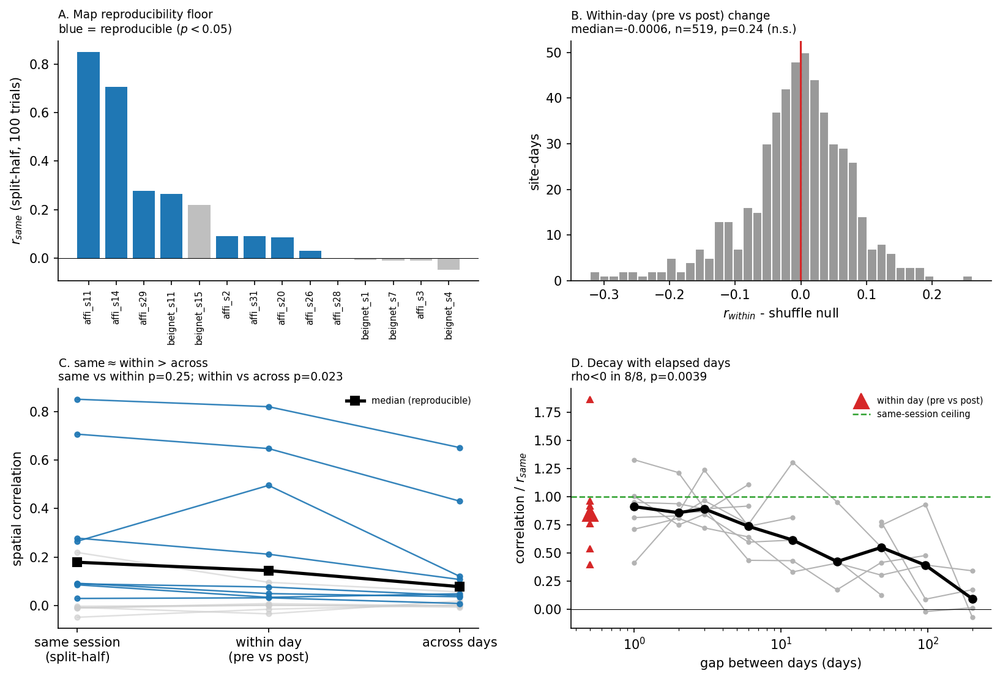

In [33]:
# ---- summary figure ----
fig = plt.figure(figsize=(11, 7.5), dpi=150)

ax = plt.subplot(2,2,1)
_c = df_combo
ax.bar(range(len(_c)), _c.r_same,
       color=['tab:blue' if m else '0.75' for m in _c.measurable])
ax.axhline(0, color='k', lw=0.5)
ax.set_xticks(range(len(_c)))
ax.set_xticklabels(_c.index, rotation=90, fontsize=7)
ax.set_ylabel('$r_{same}$ (split-half, 100 trials)')
ax.set_title('A. Map reproducibility floor\nblue = reproducible ($p<0.05$)', fontsize=9, loc='left')
sns.despine(ax=ax)

ax = plt.subplot(2,2,2)
ax.hist(df_siteday.delta.dropna(), bins=40, color='0.6', edgecolor='w')
ax.axvline(0, color='k', ls='--', lw=1)
ax.axvline(df_siteday.delta.median(), color='tab:red', lw=1.5)
ax.set_xlabel(r'$r_{within}$ - shuffle null')
ax.set_ylabel('site-days')
_p = stats.wilcoxon(df_siteday.delta.dropna(), alternative='less').pvalue
ax.set_title(f'B. Within-day (pre vs post) change\nmedian={df_siteday.delta.median():.4f}, '
             f'n={df_siteday.delta.notna().sum()}, p={_p:.2f} (n.s.)', fontsize=9, loc='left')
sns.despine(ax=ax)

ax = plt.subplot(2,2,3)
for name, row in df_combo[['r_same','r_within','r_across']].iterrows():
    m = df_combo.loc[name,'measurable']
    ax.plot([0,1,2], row.values, 'o-', color='tab:blue' if m else '0.8',
            alpha=0.9 if m else 0.6, ms=4, lw=1.2, zorder=3 if m else 1)
_s = df_combo.loc[measurable, ['r_same','r_within','r_across']]
ax.plot([0,1,2], _s.median().values, 'ks-', lw=2.5, ms=7, zorder=5, label='median (reproducible)')
ax.set_xticks([0,1,2])
ax.set_xticklabels(['same session\n(split-half)','within day\n(pre vs post)','across days'])
ax.set_ylabel('spatial correlation')
ax.set_title(f'C. same$\\approx$within > across\n'
             f'same vs within p={stats.wilcoxon(_s.r_same,_s.r_within).pvalue:.2f}; '
             f'within vs across p={stats.wilcoxon(_s.r_within,_s.r_across).pvalue:.3f}',
             fontsize=9, loc='left')
ax.legend(fontsize=7, frameon=False)
sns.despine(ax=ax)

ax = plt.subplot(2,2,4)
_bins = [0,1,2,4,8,16,32,64,128,1e5]
_ctr  = [1,2,3,6,12,24,48,96,200]
_keep = df_combo.index[df_combo.measurable & (df_combo.r_same > 0.05)]
_a = df_across[df_across.combo.isin(_keep)].copy()
_a['bin'] = pd.cut(_a.gap, bins=_bins, right=True)
_tab = _a.groupby(['combo','bin'], observed=False)['r_across'].median().unstack()
for name, row in _tab.iterrows():
    ax.plot(_ctr, row.values/df_combo.loc[name,'r_same'], 'o-', color='0.7', ms=3, lw=1)
    ax.plot([0.5], [df_combo.loc[name,'r_within']/df_combo.loc[name,'r_same']],
            '^', color='tab:red', ms=5)
ax.plot(_ctr, _tab.div(df_combo.loc[_tab.index,'r_same'], axis=0).median(axis=0).values,
        'ko-', lw=2.5, ms=6, zorder=5)
ax.plot([0.5], [(df_combo.loc[_keep,'r_within']/df_combo.loc[_keep,'r_same']).median()],
        '^', color='tab:red', ms=12, zorder=6, label='within day (pre vs post)')
ax.axhline(1, color='tab:green', ls='--', lw=1.2, label='same-session ceiling')
ax.axhline(0, color='k', lw=0.5)
ax.set_xscale('log')
ax.set_xlabel('gap between days (days)')
ax.set_ylabel('correlation / $r_{same}$')
_r = np.array([stats.spearmanr(g.gap, g.r_across)[0]
               for _, g in df_across[df_across.combo.isin(measurable)].groupby('combo')])
ax.set_title(f'D. Decay with elapsed days\nrho<0 in {int(np.sum(_r<0))}/{len(_r)}, '
             f'p={stats.wilcoxon(_r, alternative="less").pvalue:.4f}', fontsize=9, loc='left')
ax.legend(fontsize=7, frameon=False, loc='upper right')
sns.despine(ax=ax)

plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'within_vs_across_day_drift.svg'), bbox_inches='tight')
plt.show()

### Result

1. **No within-day drift.** The pre→post change in the SLIC map is indistinguishable from the
   label-shuffle null (median `delta` ≈ 0, n.s. at site-day, reproducible-only, and per-combo
   levels), and `r_within` is statistically indistinguishable from the same-session floor
   `r_same` (p=0.25). Whatever separates the pre and post maps is trial-level noise, not a
   session effect. The low raw pre-vs-post correlation is *not* evidence of change — the null
   is equally low.
2. **Across-day drift is real.** `r_within > r_across` in 7/8 reproducible subject-sites
   (p=0.023), and similarity decays monotonically with elapsed days — negative Spearman rho in
   8/8, p=0.0039. Normalised to each site's own noise floor, similarity falls from ~0.91 at a
   1-day gap to ~0.09 beyond 128 days.
3. **Only 8/14 subject-sites have a measurable map** at 100 trials; the other 6 sit at
   `r_same` ≈ 0. Pooling all 14 dilutes the within-vs-across test to p=0.049; restricted to
   reproducible sites it is p=0.023. This connects to the trial-count sweep earlier in the
   notebook — those sites need far more trials before any drift question can be asked of them.

**Caveats.** The shuffle null tests exchangeability of trials, so a session-level recording
artifact would also register as "within-day drift" — but since nothing registers, that
cuts in favour of the null result rather than against it. `beignet_s11` is the one combo where
`r_within` (0.495) exceeds `r_same` (0.265), which shouldn't happen if the floor is a true
ceiling on similarity; it has only 29 days and is worth a look before being leaned on.

## Square wave stimulation

Sessions where the BMI3D generator was `single_laser_square_wave`. Both subjects delivered real
trains: BMI3D commanded `edges = [0, .0125, .025, .0375, .05]` in every session and the laser
sensor confirms 12.5 ms pulses at 0, 25 and 50 ms.

| subject | te_id | date | site | freq | pulses | power |
|---|---|---|---|---|---|---|
| affi | 8949 | 2023-03-28 | 12 | 20 Hz | 2 | 5.2 mW |
| affi | 8950 | 2023-03-28 | 12 | 40 Hz | 3 | 3.9 mW |
| affi | 9375, 9376 | 2023-05-19 | 13 | 40 Hz | 3 | 5.4, 6.0 mW |
| affi | 9392 | 2023-05-19 | 26 | 40 Hz | 3-4 | 18.1 mW |
| beignet | 4098, 4099 | 2022-02-19 | 7 | 40 Hz | 3 | 0.8, 0.4 mW |

`get_laser_trial_times` takes one of two code paths depending on whether `qwalor_sensor` is a
key in the preprocessed file. If it is absent (affi) the raw files are re-parsed, the parse
contains `qwalor_trigger`, and every pulse is returned. If it is present (beignet) the cached
data is used, there is no trigger, and `_get_laser_trial_times_old_data` returns
`event_times[events == 'TRIAL_START']` — one time per trial, the burst onset only. Calling affi
te8950 with `laser_sensor='laser_sensor'` reproduces beignet's behaviour, which confirms it.
Pulse times are therefore taken from the laser sensor below, which works for both.

Also note `edges` has an odd number of entries, so the final rising edge has no matching fall
and the laser stays on past it. That long last pulse is real, not a measurement artifact.

In [62]:
import datetime, h5py
from aopy.analysis import calc_tfr_mean, get_max_erp
from aopy.analysis.latency import prepare_erp
from aopy.preproc.bmi3d import get_laser_trial_times
from joblib import Parallel, delayed

sq_fs = 25000
time_before = 0.25
time_after = 0.25
taper_len = 0.06
band = (12, 150)
window = (0, 1)
n_boot = 20
min_quiet = 0.30
_, acq_ch, _ = aopy.data.load_chmap()

# subject, te_id, date, site, kind, freq (0 for single pulse), laser gain
sq_sessions = [
    ('affi', 8949, '2023-03-28', 12, 'sq20',  20, 0.55),
    ('affi', 8950, '2023-03-28', 12, 'sq40',  40, 0.50),
    ('affi', 8945, '2023-03-28', 12, 'pulse',  0, 0.50),
    ('affi', 8946, '2023-03-28', 12, 'pulse',  0, 0.50),
    ('affi', 8947, '2023-03-28', 12, 'pulse',  0, 0.60),
    ('affi', 8948, '2023-03-28', 12, 'pulse',  0, 0.55),
    ('affi', 8952, '2023-03-28', 12, 'pulse',  0, 0.55),
    ('affi', 8953, '2023-03-28', 12, 'pulse',  0, 0.55),
    ('affi', 9375, '2023-05-19', 13, 'sq40',  40, 0.47),
    ('affi', 9376, '2023-05-19', 13, 'sq40',  40, 0.50),
    ('affi', 9374, '2023-05-19', 13, 'pulse',  0, 0.50),
    ('affi', 9392, '2023-05-19', 26, 'sq40',  40, 0.80),
    ('affi', 9391, '2023-05-19', 26, 'pulse',  0, 0.80),
    ('affi', 9387, '2023-05-19', 26, 'pulse',  0, 0.70),
    ('affi', 9383, '2023-05-19', 26, 'pulse',  0, 0.50),
    ('beignet', 4098, '2022-02-19', 7, 'sq40', 40, 0.500),
    ('beignet', 4099, '2022-02-19', 7, 'sq40', 40, 0.475),
    ('beignet', 4096, '2022-02-19', 7, 'pulse', 0, 0.500),
]

def load_laser_sensor(subject, te_id, date):
    '''Normalized laser sensor trace, smoothed with a 1 ms boxcar.'''
    filename = f'preproc_{date}_{subject}_{te_id}_exp.hdf'
    exp = h5py.File(os.path.join(preproc_dir, subject, filename), 'r')['exp_data']
    key = 'qwalor_sensor' if 'qwalor_sensor' in exp else 'laser_sensor'
    sensor = exp[key][:].astype(float)
    sensor = sensor - np.median(sensor)
    sensor = sensor/np.percentile(np.abs(sensor), 99.9)
    return np.convolve(sensor, np.ones(25)/25, mode='same')

def find_pulses_in_burst(sensor, onset, freq, look=0.12, pre=0.006):
    '''Onset times of every pulse in one burst, relative to the first pulse.

    Pulses have to land on the stimulation grid (multiples of 1/freq) with one pulse per
    cycle. te9375 has a noisy sensor that otherwise gives up to 19 crossings in a burst.

    Args:
        sensor (nt,): normalized laser sensor
        onset (float): burst onset time (s)
        freq (float): stimulation frequency, 0 for a single pulse

    Returns:
        (npulse,) offsets in seconds, empty if the burst runs off the end
    '''
    i = int(onset*sq_fs)
    n, m = int(look*sq_fs), int(pre*sq_fs)
    if i - m < 0 or i + n > len(sensor):
        return np.array([])
    # start before the onset, otherwise the first rising edge sits on the window edge
    crossings = np.diff((sensor[i-m:i+n] > 0.5).astype(int))
    rise = np.flatnonzero(crossings == 1) + 1
    fall = np.flatnonzero(crossings == -1) + 1
    if len(fall) and len(rise) and fall[0] < rise[0]:
        fall = fall[1:]
    npulse = min(len(rise), len(fall))
    if npulse == 0:
        return np.array([])
    offsets = (rise[:npulse] - rise[0])/sq_fs
    if freq == 0:
        return offsets[:1]
    cycle = np.round(offsets*freq)
    on_grid = np.abs(offsets*freq - cycle) < 0.25
    offsets, cycle = offsets[on_grid], cycle[on_grid]
    _, first = np.unique(cycle, return_index=True)
    return offsets[np.sort(first)]

def tabulate_laser_pulses(subject, te_id, date, site, kind, freq, gain):
    '''One row per laser pulse. Bursts need `min_quiet` of silence beforehand so the
    baseline is clean; within a kept burst every pulse is included.'''
    times, widths, gains, powers = get_laser_trial_times(preproc_dir, subject, te_id, date)
    is_onset = np.concatenate([[True], np.diff(times) > 1.5/freq]) if freq > 0 else \
               np.ones(len(times), dtype='bool')
    onset_idx = np.flatnonzero(is_onset)
    onsets = times[onset_idx]

    sensor = load_laser_sensor(subject, te_id, date)
    offsets = [find_pulses_in_burst(sensor, t, freq) for t in onsets]
    burst_dur = np.median([o[-1] for o in offsets if len(o)])

    # quiet time measured to the last pulse of the previous burst
    prev_end = np.concatenate([[-np.inf], onsets[:-1] + burst_dur])
    keep = (onsets - prev_end) > min_quiet
    laser_gain = gains if len(gains) == len(onset_idx) else np.full(len(onset_idx), gain)

    df = []
    for idx in np.flatnonzero(keep):
        for n, offset in enumerate(offsets[idx]):
            df.append(dict(subject=subject, te_id=te_id,
                           date=datetime.date.fromisoformat(date),
                           trial_time=onsets[idx] + offset,
                           trial_width=widths[onset_idx[idx]],
                           trial_gain=laser_gain[idx],
                           trial_power=powers[onset_idx[idx]],
                           stimulation_site=site, kind=kind, freq=freq, gain_set=gain,
                           pulse=n, burst=idx))
    return pd.DataFrame(df)

sq_df = pd.concat([tabulate_laser_pulses(*s) for s in tqdm(sq_sessions)], ignore_index=True)
sq_df['site_day'] = (sq_df['subject'] + '_s' + sq_df['stimulation_site'].astype(str)
                     + '_' + sq_df['date'].astype(str))
sq_df['cond'] = sq_df['site_day'] + '|' + sq_df['kind'] + '|g' + sq_df['gain_set'].astype(str)

display(sq_df.groupby(['site_day', 'kind', 'gain_set']).agg(
    pulses=('trial_time', 'size'), bursts=('burst', 'nunique'),
    per_burst=('pulse', lambda x: x.max() + 1),
    width=('trial_width', lambda x: 1000*x.median()),
    power=('trial_power', 'median')).round(2))

  0%|          | 0/18 [00:00<?, ?it/s]

Sync latency estimate: 0.0122 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/preproc/bmi3d.py:629: UserWarning: No task data found! Reconstructing from sync data
  warnings.warn("No task data found! Reconstructing from sync data")


Sync latency estimate: 0.0100 s
Sync latency estimate: 0.0107 s
Sync latency estimate: 0.0101 s
Sync latency estimate: 0.0101 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/preproc/bmi3d.py:467: UserWarning: Warning: sync failed. Using latency estimate 0.01
  warnings.warn("Warning: sync failed. Using latency estimate 0.01")


Sync latency estimate: 0.0098 s
Sync latency estimate: 0.0099 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/data/base.py:165: UserWarning: Preprocessing errors found in preproc_2023-05-19_affi_9375_exp.hdf:
[b'No hdf task data found! Attempted to reconstruct from sync data']
  warnings.warn(f"Preprocessing errors found in {filename}:\n{metadata['preproc_errors']}")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/data/base.py:165: UserWarning: Preprocessing errors found in preproc_2023-05-19_affi_9376_exp.hdf:
[b'No hdf task data found! Attempted to reconstruct from sync data']
  warnings.warn(f"Preprocessing errors found in {filename}:\n{metadata['preproc_errors']}")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/data/base.py:165: UserWarning: Preprocessing errors found in preproc_2023-05-19_affi_9374_exp.hdf:
[b'No hdf task data found! Attempted to reconstruct from sync data']
  warnings.warn(f"Preprocessing errors found in {filename

pulses  bursts  per_burst  width  power
site_day              kind  gain_set                                         
affi_s12_2023-03-28   pulse 0.500         69      46          1   5.00   3.90
                            0.550        534     319          1   2.00   5.35
                            0.600        228     228          1   5.00   7.40
                      sq20  0.550        130      65          2  24.96   5.18
                      sq40  0.500        195      65          3  12.44   3.85
affi_s13_2023-05-19   pulse 0.500        265     265          1   7.96   6.07
                      sq40  0.470        182      55          4  12.44   5.35
                            0.500        204      68          3  12.44   6.01
affi_s26_2023-05-19   pulse 0.500        220     220          1   3.00   6.07
                            0.700        202     202          1   3.00  13.85
                            0.800        446     446          1   9.92  18.24
                      sq40  0.800        663     190          4  12.44  18.07
beignet_s7_2022-02-19 pulse 0.500        150     150          1   7.20   0.82
                      sq40  0.475        328     117          3  12.50   0.41
                            0.500        125      48          3  12.00   0.82

/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/data/base.py:165: UserWarning: Preprocessing errors found in preproc_2022-02-19_beignet_4098_exp.hdf:
[b"Number of sync events (202) doesn't match number of bmi3d events (201)."
 b'No hdf task data found! Attempted to reconstruct from sync data']
  warnings.warn(f"Preprocessing errors found in {filename}:\n{metadata['preproc_errors']}")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/preproc/bmi3d.py:785: UserWarning: 36 laser trials have widths above the given threshold
  warnings.warn(f"{np.sum(widths_above_thr)} laser trials have widths above the given threshold")
/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/preproc/bmi3d.py:788: UserWarning: 100 laser trials have powers above the given threshold
  warnings.warn(f"{np.sum(powers_above_thr)} laser trials have powers above the given threshold")
/home/aolab/miniconda3/envs/eco

Sync latency estimate: 0.0100 s


/home/aolab/miniconda3/envs/ecog_opto_connectivity/lib/python3.12/site-packages/aopy/preproc/bmi3d.py:629: UserWarning: No task data found! Reconstructing from sync data
  warnings.warn("No task data found! Reconstructing from sync data")


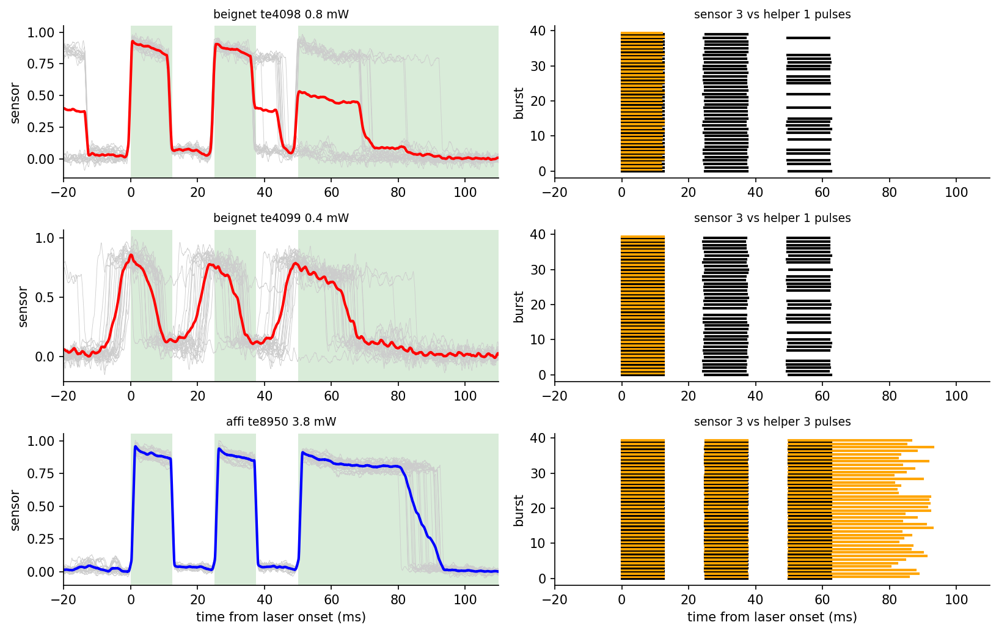

In [63]:
# Check the sensor against what BMI3D commanded and what the helper detects
check = [('beignet', 4098, '2022-02-19', '0.8 mW'),
         ('beignet', 4099, '2022-02-19', '0.4 mW'),
         ('affi', 8950, '2023-03-28', '3.8 mW')]

plt.figure(figsize=(11, 7), dpi=150)
for i, (subject, te_id, date, power) in enumerate(check):
    sensor = load_laser_sensor(subject, te_id, date)
    times, widths, _, _ = get_laser_trial_times(preproc_dir, subject, te_id, date)
    onsets = times[np.concatenate([[True], np.diff(times) > 0.15])][:40]

    filename = f'preproc_{date}_{subject}_{te_id}_exp.hdf'
    exp = h5py.File(os.path.join(preproc_dir, subject, filename), 'r')['exp_data']
    edges = np.array([t['edges'] for t in exp['bmi3d_trials'][:]])[0]
    edges = edges[np.isfinite(edges)]

    n_pre, n_post = int(0.02*sq_fs), int(0.12*sq_fs)
    t = np.arange(-n_pre, n_post)/sq_fs*1000
    erp = np.array([sensor[int(o*sq_fs)-n_pre:int(o*sq_fs)+n_post] for o in onsets
                    if int(o*sq_fs)-n_pre >= 0 and int(o*sq_fs)+n_post <= len(sensor)])

    plt.subplot(3, 2, 2*i + 1)
    for n in range(0, len(edges) - 1, 2):
        plt.axvspan(1000*edges[n], 1000*edges[n+1], color='g', alpha=0.15, lw=0)
    if len(edges) % 2 == 1:
        plt.axvspan(1000*edges[-1], 110, color='g', alpha=0.15, lw=0)
    plt.plot(t, erp[:25].T, color='0.8', lw=0.4)
    plt.plot(t, erp.mean(axis=0), color='r' if subject == 'beignet' else 'b', lw=2)
    plt.xlim(-20, 110)
    plt.ylabel('sensor')
    plt.title(f'{subject} te{te_id} {power}', fontsize=9)
    if i == 2:
        plt.xlabel('time from laser onset (ms)')
    sns.despine()

    plt.subplot(3, 2, 2*i + 2)
    npulse = []
    for n, o in enumerate(onsets[:len(erp)]):
        offsets = find_pulses_in_burst(sensor, o, 40)
        npulse.append(len(offsets))
        for offset in offsets:
            plt.plot([1000*offset, 1000*(offset + 0.0125)], [n, n], 'k', lw=2)
        near = (times >= o - 0.02) & (times <= o + 0.12)
        for tp, wp in zip(times[near], widths[near]):
            plt.plot([1000*(tp - o), 1000*(tp - o + wp)], [n + 0.4, n + 0.4],
                     color='orange', lw=2)
    plt.xlim(-20, 110)
    plt.ylabel('burst')
    plt.title(f'sensor {np.median(npulse):.0f} vs helper '
              f'{np.median([np.sum((times >= o-0.02) & (times <= o+0.12)) for o in onsets]):.0f}'
              ' pulses', fontsize=9)
    if i == 2:
        plt.xlabel('time from laser onset (ms)')
    sns.despine()

plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'square_wave_sensor_check.svg'), bbox_inches='tight')
plt.show()

In [64]:
# Load one erp per condition, all maps come from trial subsets of these. Keep the pulse index
# so the same erp can be realigned to burst onsets (pulse 0) without reloading, and load a set
# of clean baseline epochs from the quiet period before each burst.
n_baseline = 4    # non-overlapping taper_len windows that fit in min_quiet

def calc_map_correlation(map1, map2):
    valid = np.isfinite(map1) & np.isfinite(map2)
    if np.sum(valid) < 4:
        return np.nan
    return np.corrcoef(map1[valid], map2[valid])[0,1]

def calc_coh_window(erp, samplerate, stim_site, idx):
    '''coherence in the pre (idx 0) or post (idx 1) taper window'''
    ch_near_stim = get_acq_ch_near_stimulation_site(stim_site)
    stim_ch = np.where(np.isin(acq_ch, ch_near_stim))[0]
    freqs, time, coh_all, _ = calc_connectivity_map_coh(
        erp, samplerate, time_before, time_after, stim_ch,
        window=(-taper_len, taper_len), n=taper_len, step=taper_len,
        parallel=False, verbose=False)
    return freqs, time, coh_all[:,[idx],:]

def calc_sq_slic_map(erp, samplerate, stim_site, erp_baseline=None):
    '''Post minus pre coherence. With erp_baseline the pre window is taken from separate
    stimulation free epochs instead of the 60 ms before the pulse, which is contaminated by
    the previous pulse of a train. The baseline epochs have to be independent rather than one
    epoch repeated per pulse, since coherence is biased by the number of trials.'''
    ch_near_stim = get_acq_ch_near_stimulation_site(stim_site)
    stim_ch = np.where(np.isin(acq_ch, ch_near_stim))[0]
    freqs, time, coh_all, _ = calc_connectivity_map_coh(
        erp, samplerate, time_before, time_after, stim_ch,
        window=(-taper_len, taper_len), n=taper_len, step=taper_len,
        parallel=False, verbose=False)
    post = coh_all[:,[1],:]
    if erp_baseline is None:
        pre = coh_all[:,[0],:]
    else:
        _, _, pre = calc_coh_window(erp_baseline, samplerate, stim_site, 1)
    return calc_tfr_mean(freqs, time[1:], post - pre, band=band, window=window)

def calc_sq_erp_map(erp, samplerate):
    '''z-scored max evoked response, same statistic as calc_opto_resp'''
    altcond, nullcond = prepare_erp(erp, erp, samplerate, time_before, time_after,
                                    (-time_before, 0), (0, time_after))[:2]
    sd_erp = (altcond - np.mean(nullcond, axis=0))/np.std(nullcond, axis=0)
    return get_max_erp(sd_erp, 0, time_after, samplerate, trial_average=True)

sq_erp = {}
for cond, df in tqdm(list(sq_df.groupby('cond'))):
    df = df.reset_index(drop=True)
    bad_trials = get_bad_stim_trials(df, channels=acq_ch-1)
    df = df[~bad_trials].reset_index(drop=True)
    erp, samplerate = load_stim_erp(df, time_before, time_after, channels=acq_ch-1)

    # clean baselines, taper_len windows stepping back from each burst onset
    onsets = df[df['pulse'] == 0].reset_index(drop=True)
    baseline_df = pd.concat([onsets.assign(trial_time=onsets['trial_time'] - taper_len*j)
                             for j in range(1, n_baseline + 1)], ignore_index=True)
    erp_baseline, _ = load_stim_erp(baseline_df, time_before, time_after, channels=acq_ch-1)

    sq_erp[cond] = (erp, samplerate, df['pulse'].to_numpy(), erp_baseline)
    print(f'{cond} {erp.shape[2]} pulses, {len(onsets)} bursts, '
          f'{erp_baseline.shape[2]} baselines ({np.sum(bad_trials)} bad)')

  0%|          | 0/15 [00:00<?, ?it/s]

affi_s12_2023-03-28|pulse|g0.5 69 pulses, 69 bursts, 276 baselines (0 bad)
affi_s12_2023-03-28|pulse|g0.55 534 pulses, 534 bursts, 2136 baselines (0 bad)
affi_s12_2023-03-28|pulse|g0.6 228 pulses, 228 bursts, 912 baselines (0 bad)
affi_s12_2023-03-28|sq20|g0.55 130 pulses, 65 bursts, 260 baselines (0 bad)
affi_s12_2023-03-28|sq40|g0.5 195 pulses, 65 bursts, 260 baselines (0 bad)
affi_s13_2023-05-19|pulse|g0.5 260 pulses, 260 bursts, 1040 baselines (5 bad)
affi_s13_2023-05-19|sq40|g0.47 182 pulses, 55 bursts, 220 baselines (0 bad)
affi_s13_2023-05-19|sq40|g0.5 204 pulses, 68 bursts, 272 baselines (0 bad)
affi_s26_2023-05-19|pulse|g0.5 220 pulses, 220 bursts, 880 baselines (0 bad)
affi_s26_2023-05-19|pulse|g0.7 200 pulses, 200 bursts, 800 baselines (2 bad)
affi_s26_2023-05-19|pulse|g0.8 444 pulses, 444 bursts, 1776 baselines (2 bad)
affi_s26_2023-05-19|sq40|g0.8 662 pulses, 190 bursts, 760 baselines (1 bad)
beignet_s7_2022-02-19|pulse|g0.5 150 pulses, 150 bursts, 600 baselines (0 bad)
be

In [65]:
# Two alignments. 'burst' uses only the first pulse of each burst, which has a stimulation free
# baseline. 'pulse' uses every pulse in the train; at 40 Hz the next pulse arrives 25 ms later,
# inside the 60 ms slic pre-window, so slic there is computed against separate clean baseline
# epochs instead. Without that correction the burst conditions invert (see the results below).
# The evoked map is left alone, it is a per trial z-score and reusing the burst baseline changes
# it by less than 0.01.
sq_comparisons = [
    ('affi_s12_2023-03-28', 12, 'sq40|g0.5',  'pulse|g0.5',  '40Hz vs pulse 3.9mW'),
    ('affi_s12_2023-03-28', 12, 'sq20|g0.55', 'pulse|g0.55', '20Hz vs pulse 5.3mW'),
    ('affi_s12_2023-03-28', 12, 'sq20|g0.55', 'sq40|g0.5',   '20Hz vs 40Hz'),
    ('affi_s13_2023-05-19', 13, 'sq40|g0.5',  'pulse|g0.5',  '40Hz vs pulse 6.0mW'),
    ('affi_s26_2023-05-19', 26, 'sq40|g0.8',  'pulse|g0.8',  '40Hz vs pulse 18mW'),
    ('beignet_s7_2022-02-19', 7, 'sq40|g0.5',   'pulse|g0.5', 'beignet 40Hz vs pulse 0.8mW'),
    ('beignet_s7_2022-02-19', 7, 'sq40|g0.475', 'pulse|g0.5', 'beignet 40Hz 0.4 vs pulse 0.8mW'),
    # power only controls, single pulse against single pulse
    ('affi_s12_2023-03-28', 12, 'pulse|g0.5', 'pulse|g0.55', 'pulse 3.9 vs 5.4mW'),
    ('affi_s12_2023-03-28', 12, 'pulse|g0.5', 'pulse|g0.6',  'pulse 3.9 vs 7.4mW'),
    ('affi_s26_2023-05-19', 26, 'pulse|g0.7', 'pulse|g0.8',  'pulse 14 vs 18mW'),
    ('affi_s26_2023-05-19', 26, 'pulse|g0.5', 'pulse|g0.8',  'pulse 6 vs 18mW'),
    ('beignet_s7_2022-02-19', 7, 'sq40|g0.475', 'sq40|g0.5', 'beignet 40Hz 0.4 vs 0.8mW'),
]

def compare_maps(cond1, cond2, samplerate, stim_site, n_trials, shared_baseline, seed):
    '''Split each condition in half and correlate within and across conditions.'''
    rng = np.random.default_rng(seed)
    half = n_trials//2
    maps = {}
    for name, (erp, erp_baseline) in [('1', cond1), ('2', cond2)]:
        idx = rng.permutation(erp.shape[2])[:n_trials]
        base = rng.permutation(erp_baseline.shape[2])[:n_trials]
        for method in ['slic', 'erp']:
            for h, trials, base_trials in [(0, idx[:half], base[:half]),
                                           (1, idx[half:2*half], base[half:2*half])]:
                if method == 'erp':
                    maps[(name, method, h)] = calc_sq_erp_map(erp[:,:,trials], samplerate)
                else:
                    maps[(name, method, h)] = calc_sq_slic_map(
                        erp[:,:,trials], samplerate, stim_site,
                        erp_baseline[:,:,base_trials] if shared_baseline else None)
    result = {}
    for method in ['slic', 'erp']:
        a = [maps[('1', method, h)] for h in (0, 1)]
        b = [maps[('2', method, h)] for h in (0, 1)]
        result[method] = dict(
            within1=calc_map_correlation(a[0], a[1]),
            within2=calc_map_correlation(b[0], b[1]),
            across=np.mean([calc_map_correlation(a[i], b[j])
                            for i in (0, 1) for j in (0, 1)]))
    return result

all_label = []
all_align = []
all_method = []
all_n_trials = []
all_within1 = []
all_within2 = []
all_across = []
all_across_ci = []
for site_day, stim_site, cond1, cond2, label in tqdm(sq_comparisons):
    erp1, samplerate, pulse1, base1 = sq_erp[f'{site_day}|{cond1}']
    erp2, _, pulse2, base2 = sq_erp[f'{site_day}|{cond2}']

    for align in ['pulse', 'burst']:
        if align == 'burst':
            sub1, sub2 = erp1[:,:,pulse1 == 0], erp2[:,:,pulse2 == 0]
        else:
            sub1, sub2 = erp1, erp2
        n_trials = min(sub1.shape[2], sub2.shape[2])
        boot = Parallel(n_jobs=20)(
            delayed(compare_maps)((sub1, base1), (sub2, base2), samplerate, stim_site,
                                  n_trials, align == 'pulse', seed)
            for seed in range(n_boot))

        for method in ['erp', 'slic']:
            across = np.array([b[method]['across'] for b in boot])
            all_label.append(label)
            all_align.append(align)
            all_method.append(method)
            all_n_trials.append(n_trials//2)
            all_within1.append(np.nanmedian([b[method]['within1'] for b in boot]))
            all_within2.append(np.nanmedian([b[method]['within2'] for b in boot]))
            all_across.append(np.nanmedian(across))
            all_across_ci.append(np.nanpercentile(across, [2.5, 97.5]))

  0%|          | 0/12 [00:00<?, ?it/s]

In [66]:
# Save data
square_wave_data = {
    'all_label': all_label,
    'all_align': all_align,
    'all_method': all_method,
    'all_n_trials': all_n_trials,
    'all_within1': all_within1,
    'all_within2': all_within2,
    'all_across': all_across,
    'all_across_ci': all_across_ci,
    'sq_df': sq_df,
}

aopy.data.pkl_write(f'connectivity_square_wave_{version}.pkl',
                    square_wave_data,
                    postproc_dir)

In [67]:
# The ceiling is the geometric mean of the two split half correlations. A ratio near 1 means
# the two conditions give the same map, well below 1 means they differ, and a ceiling near 0
# means the map is too noisy at this trial count to say anything.
sq_result = pd.DataFrame({'label': all_label, 'align': all_align, 'method': all_method,
                          'n_trials': all_n_trials, 'within1': all_within1,
                          'within2': all_within2, 'across': all_across})
sq_result['ceiling'] = np.sqrt(np.clip(sq_result['within1'], 0, None)
                               * np.clip(sq_result['within2'], 0, None))
sq_result['ratio'] = sq_result['across']/sq_result['ceiling'].replace(0, np.nan)
sq_result['lower'] = [ci[0] for ci in all_across_ci]
sq_result['upper'] = [ci[1] for ci in all_across_ci]

for method, name in [('erp', 'EVOKED RESPONSE'), ('slic', 'SLIC')]:
    for align in ['pulse', 'burst']:
        display(Markdown(f'### {name}, aligned to every {align}'))
        display(sq_result[(sq_result['method'] == method) & (sq_result['align'] == align)]
                .drop(columns=['method', 'align']).round(3).set_index('label'))

### EVOKED RESPONSE, aligned to every pulse

,n_trials,within1,within2,across,ceiling,ratio,lower,upper
label,,,,,,,,
40Hz vs pulse 3.9mW,34,0.814,0.953,0.832,0.881,0.944,0.725,0.871
20Hz vs pulse 5.3mW,65,0.953,0.851,0.873,0.901,0.969,0.697,0.931
20Hz vs 40Hz,65,0.953,0.862,0.879,0.906,0.970,0.790,0.923
40Hz vs pulse 6.0mW,102,0.765,0.981,0.651,0.866,0.752,0.521,0.734
40Hz vs pulse 18mW,222,0.910,0.944,0.918,0.927,0.991,0.856,0.948
beignet 40Hz vs pulse 0.8mW,62,0.901,0.922,0.899,0.911,0.986,0.872,0.917
beignet 40Hz 0.4 vs pulse 0.8mW,75,0.936,0.937,0.914,0.936,0.976,0.877,0.946
pulse 3.9 vs 5.4mW,34,0.938,0.811,0.848,0.872,0.972,0.796,0.915
pulse 3.9 vs 7.4mW,34,0.938,0.981,0.926,0.959,0.965,0.864,0.967


### EVOKED RESPONSE, aligned to every burst

,n_trials,within1,within2,across,ceiling,ratio,lower,upper
label,,,,,,,,
40Hz vs pulse 3.9mW,32,0.768,0.959,0.824,0.858,0.961,0.784,0.926
20Hz vs pulse 5.3mW,32,0.945,0.751,0.766,0.842,0.909,0.607,0.870
20Hz vs 40Hz,32,0.945,0.811,0.856,0.875,0.977,0.795,0.930
40Hz vs pulse 6.0mW,34,0.828,0.894,0.845,0.861,0.982,0.722,0.910
40Hz vs pulse 18mW,95,0.913,0.915,0.907,0.914,0.992,0.846,0.945
beignet 40Hz vs pulse 0.8mW,24,0.864,0.854,0.855,0.859,0.995,0.814,0.910
beignet 40Hz 0.4 vs pulse 0.8mW,58,0.946,0.922,0.933,0.934,0.999,0.913,0.957
pulse 3.9 vs 5.4mW,34,0.938,0.811,0.848,0.872,0.972,0.796,0.915
pulse 3.9 vs 7.4mW,34,0.938,0.981,0.926,0.959,0.965,0.864,0.967


### SLIC, aligned to every pulse

,n_trials,within1,within2,across,ceiling,ratio,lower,upper
label,,,,,,,,
40Hz vs pulse 3.9mW,34,0.400,0.301,0.294,0.347,0.848,0.049,0.464
20Hz vs pulse 5.3mW,65,0.674,0.809,0.629,0.739,0.851,0.316,0.727
20Hz vs 40Hz,65,0.674,0.528,0.363,0.597,0.609,0.294,0.559
40Hz vs pulse 6.0mW,102,0.539,0.829,0.343,0.669,0.512,0.247,0.485
40Hz vs pulse 18mW,222,0.826,0.632,0.735,0.722,1.018,0.634,0.817
beignet 40Hz vs pulse 0.8mW,62,0.503,0.321,0.346,0.402,0.862,0.272,0.441
beignet 40Hz 0.4 vs pulse 0.8mW,75,0.268,0.332,0.244,0.298,0.817,0.127,0.369
pulse 3.9 vs 5.4mW,34,0.215,0.753,0.405,0.402,1.007,0.149,0.562
pulse 3.9 vs 7.4mW,34,0.215,0.931,0.255,0.448,0.570,-0.002,0.445


### SLIC, aligned to every burst

,n_trials,within1,within2,across,ceiling,ratio,lower,upper
label,,,,,,,,
40Hz vs pulse 3.9mW,32,0.368,0.173,0.174,0.252,0.690,0.028,0.323
20Hz vs pulse 5.3mW,32,0.675,0.707,0.548,0.691,0.792,0.381,0.700
20Hz vs 40Hz,32,0.675,0.183,0.147,0.352,0.418,-0.015,0.291
40Hz vs pulse 6.0mW,34,0.731,0.595,0.576,0.660,0.873,0.432,0.684
40Hz vs pulse 18mW,95,0.755,0.499,0.620,0.614,1.010,0.448,0.730
beignet 40Hz vs pulse 0.8mW,24,0.109,0.096,0.115,0.102,1.129,-0.040,0.219
beignet 40Hz 0.4 vs pulse 0.8mW,58,0.176,0.346,0.302,0.247,1.223,0.227,0.410
pulse 3.9 vs 5.4mW,34,0.281,0.731,0.468,0.453,1.034,0.257,0.630
pulse 3.9 vs 7.4mW,34,0.281,0.930,0.299,0.511,0.586,0.093,0.453


In [68]:
# Does the response follow the drive frequency? Evoked spectrum after the burst over the
# spectrum before it, averaged over the channels that responded. This one has to be aligned to
# the burst, since aligning to every pulse makes the pulse rate the alignment period.
all_cond = []
all_freqs = []
all_snr = []
for cond, (erp, samplerate, pulse, _) in sq_erp.items():
    evoked = np.nanmean(erp[:,:,pulse == 0], axis=2)
    n_pre = int(time_before*samplerate)
    post, pre = evoked[n_pre:,:], evoked[:n_pre,:]
    freqs = np.fft.rfftfreq(post.shape[0], 1/samplerate)
    freqs_pre = np.fft.rfftfreq(pre.shape[0], 1/samplerate)
    amp_post = np.abs(np.fft.rfft(post*np.hanning(post.shape[0])[:,None], axis=0))
    amp_pre = np.abs(np.fft.rfft(pre*np.hanning(pre.shape[0])[:,None], axis=0))
    amp_pre = np.stack([np.interp(freqs, freqs_pre, amp_pre[:,ch])
                        for ch in range(amp_pre.shape[1])], axis=1)

    erp_map = calc_sq_erp_map(erp[:,:,pulse == 0], samplerate)
    responded = np.abs(erp_map) >= np.nanpercentile(np.abs(erp_map), 75)
    all_cond.append(cond)
    all_freqs.append(freqs)
    all_snr.append(np.nanmean((amp_post/np.maximum(amp_pre, 1e-12))[:,responded], axis=1))

for cond, freqs, snr in zip(all_cond, all_freqs, all_snr):
    at = lambda f: snr[np.argmin(np.abs(freqs - f))]
    print(f'{cond} 20Hz {at(20):.2f} 40Hz {at(40):.2f} 80Hz {at(80):.2f}')

affi_s12_2023-03-28|pulse|g0.5 20Hz 0.56 40Hz 1.09 80Hz 0.37
affi_s12_2023-03-28|pulse|g0.55 20Hz 4.53 40Hz 3.55 80Hz 2.22
affi_s12_2023-03-28|pulse|g0.6 20Hz 1.82 40Hz 0.90 80Hz 0.53
affi_s12_2023-03-28|sq20|g0.55 20Hz 7.84 40Hz 8.18 80Hz 4.97
affi_s12_2023-03-28|sq40|g0.5 20Hz 3.52 40Hz 12.91 80Hz 6.77
affi_s13_2023-05-19|pulse|g0.5 20Hz 0.96 40Hz 0.71 80Hz 0.88
affi_s13_2023-05-19|sq40|g0.47 20Hz 0.45 40Hz 2.28 80Hz 1.04
affi_s13_2023-05-19|sq40|g0.5 20Hz 0.85 40Hz 0.70 80Hz 0.89
affi_s26_2023-05-19|pulse|g0.5 20Hz 5.64 40Hz 1.00 80Hz 3.74
affi_s26_2023-05-19|pulse|g0.7 20Hz 1.52 40Hz 0.91 80Hz 0.52
affi_s26_2023-05-19|pulse|g0.8 20Hz 0.57 40Hz 2.69 80Hz 0.87
affi_s26_2023-05-19|sq40|g0.8 20Hz 2.40 40Hz 8.71 80Hz 1.71
beignet_s7_2022-02-19|pulse|g0.5 20Hz 6.22 40Hz 3.14 80Hz 0.91
beignet_s7_2022-02-19|sq40|g0.475 20Hz 5.23 40Hz 4.70 80Hz 1.64
beignet_s7_2022-02-19|sq40|g0.5 20Hz 2.22 40Hz 5.70 80Hz 2.99


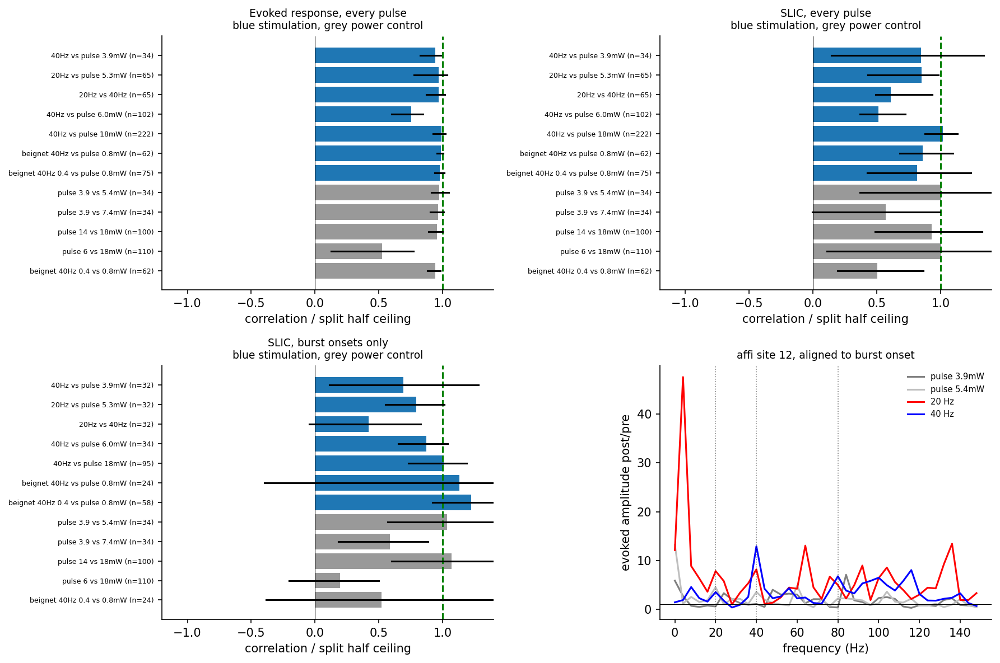

In [69]:
plt.figure(figsize=(12, 8), dpi=150)

for i, (method, align, name) in enumerate([
        ('erp', 'pulse', 'Evoked response, every pulse'),
        ('slic', 'pulse', 'SLIC, every pulse'),
        ('slic', 'burst', 'SLIC, burst onsets only')]):
    plt.subplot(2, 2, i+1)
    df = sq_result[(sq_result['method'] == method)
                   & (sq_result['align'] == align)].iloc[::-1]
    is_ctrl = df['label'].str.startswith('pulse ') | df['label'].str.endswith('0.4 vs 0.8mW')
    plt.barh(range(len(df)), df['ratio'].fillna(0),
             color=['0.6' if c else 'tab:blue' for c in is_ctrl])
    plt.axvline(1, color='g', ls='--')
    plt.axvline(0, color='k', lw=0.5)
    for n, (lower, upper, ceiling) in enumerate(zip(df['lower'], df['upper'], df['ceiling'])):
        if ceiling > 0:
            plt.plot([lower/ceiling, upper/ceiling], [n, n], 'k')
    plt.yticks(range(len(df)), [f'{l} (n={n})' for l, n in zip(df['label'], df['n_trials'])],
               fontsize=6)
    plt.xlim(-1.2, 1.4)
    plt.xlabel('correlation / split half ceiling')
    plt.title(f'{name}\nblue stimulation, grey power control', fontsize=9)
    sns.despine()

plt.subplot(2, 2, 4)
labels = {'sq20|g0.55': ('r', '20 Hz'), 'sq40|g0.5': ('b', '40 Hz'),
          'pulse|g0.5': ('0.5', 'pulse 3.9mW'), 'pulse|g0.55': ('0.75', 'pulse 5.4mW')}
for cond, freqs, snr in zip(all_cond, all_freqs, all_snr):
    key = cond.split('|', 1)[1]
    if cond.startswith('affi_s12') and key in labels:
        color, label = labels[key]
        plt.plot(freqs[freqs <= 150], snr[freqs <= 150], color=color, label=label)
for f in [20, 40, 80]:
    plt.axvline(f, color='k', ls=':', lw=0.8, alpha=0.5)
plt.axhline(1, color='k', lw=0.5)
plt.xlabel('frequency (Hz)')
plt.ylabel('evoked amplitude post/pre')
plt.title('affi site 12, aligned to burst onset', fontsize=9)
plt.legend(fontsize=7, frameon=False)
sns.despine()

plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'square_wave_stim.svg'), bbox_inches='tight')
plt.show()

  0%|          | 0/4 [00:00<?, ?it/s]

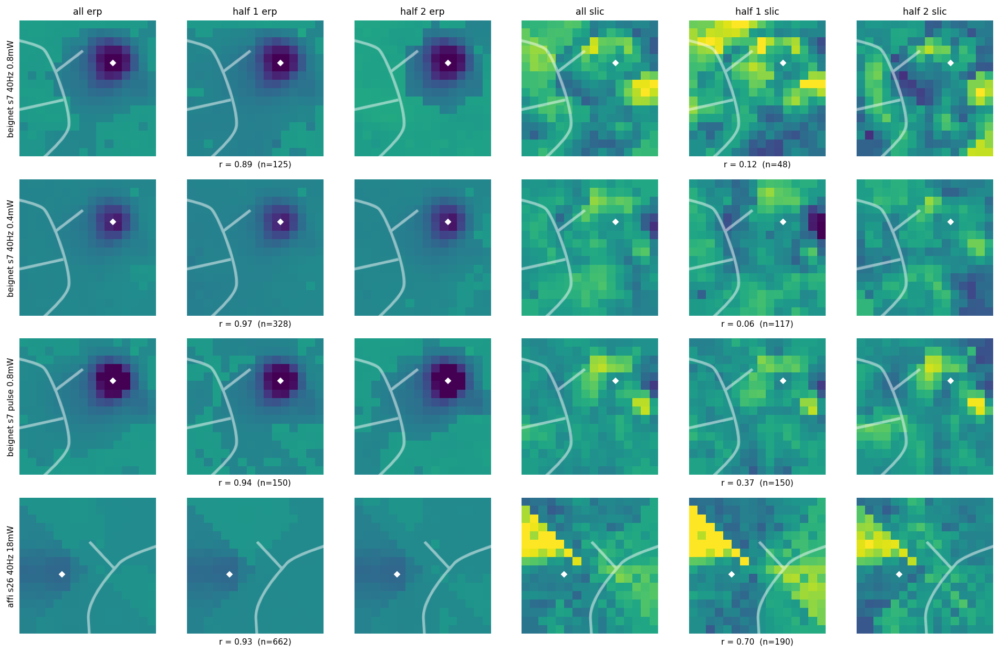

In [70]:
# Each map next to its own split halves, to show which ones are measurable. Evoked maps use
# every pulse, slic maps use burst onsets only.
reliability = [('beignet s7 40Hz 0.8mW', 'beignet', 7, [4098]),
               ('beignet s7 40Hz 0.4mW', 'beignet', 7, [4099]),
               ('beignet s7 pulse 0.8mW', 'beignet', 7, [4096]),
               ('affi s26 40Hz 18mW', 'affi', 26, [9392])]

maps = {}
for label, subject, stim_site, te_ids in tqdm(reliability):
    df = sq_df[np.isin(sq_df['te_id'], te_ids)].reset_index(drop=True)
    bad_trials = get_bad_stim_trials(df, channels=acq_ch-1)
    df = df[~bad_trials].reset_index(drop=True)
    erp, samplerate = load_stim_erp(df, time_before, time_after, channels=acq_ch-1)
    pulse = df['pulse'].to_numpy()

    for method, align, calc_map in [
            ('erp', 'pulse', lambda e: calc_sq_erp_map(e, samplerate)),
            ('slic', 'burst', lambda e: calc_sq_slic_map(e, samplerate, stim_site))]:
        sub = erp if align == 'pulse' else erp[:,:,pulse == 0]
        n_trials = sub.shape[2]
        half = n_trials//2
        splits = [np.random.default_rng(seed).permutation(n_trials) for seed in range(6)]
        halves = [(calc_map(sub[:,:,s[:half]]), calc_map(sub[:,:,s[half:2*half]]))
                  for s in splits]
        within = np.median([calc_map_correlation(a, b) for a, b in halves])
        maps[(label, method)] = (calc_map(sub), halves[0], within, n_trials)

plt.figure(figsize=(14, 9), dpi=140)
clim = {m: np.nanpercentile(np.abs(np.concatenate(
            [maps[(l[0], m)][0] for l in reliability])), 99) for m in ['erp', 'slic']}
for i, (label, subject, stim_site, _) in enumerate(reliability):
    for j, method in enumerate(['erp', 'slic']):
        full, halves, within, n_trials = maps[(label, method)]
        for k, m in enumerate([full, halves[0], halves[1]]):
            plt.subplot(len(reliability), 6, 6*i + 3*j + k + 1)
            im, _ = aopy.visualization.plot_annotated_spatial_drive_map_stim(
                m, stim_site, subject, 'lm1', 0, colorbar=False)
            im.set_clim(-clim[method], clim[method])
            if i == 0:
                plt.title(['all', 'half 1', 'half 2'][k] + f' {method}', fontsize=9)
            if k == 1:
                plt.xlabel(f'r = {within:.2f}  (n={n_trials})', fontsize=8)
            if j == 0 and k == 0:
                plt.ylabel(label, fontsize=8)

plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'square_wave_reliability_maps.svg'), bbox_inches='tight')
plt.show()

  0%|          | 0/5 [00:00<?, ?it/s]

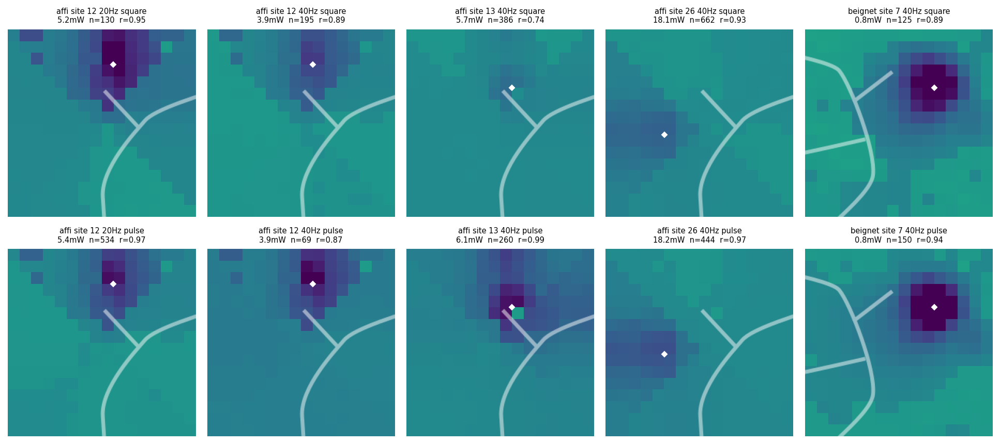

In [72]:
# Evoked map at each site tested with square wave, next to its power matched single pulse. The
# only meaningful reference for a train is the single pulse at the same site on the same day;
# maps from different stimulation sites are not compared, since each site drives its own patch
# of cortex and the correlation between two of them just reports whether the responses happen
# to overlap.
sites = [('affi site 12 20Hz', 'affi', 12, [8949], [8948, 8952, 8953], (5.2, 5.4)),
         ('affi site 12 40Hz', 'affi', 12, [8950], [8945, 8946], (3.9, 3.9)),
         ('affi site 13 40Hz', 'affi', 13, [9375, 9376], [9374], (5.7, 6.1)),
         ('affi site 26 40Hz', 'affi', 26, [9392], [9391], (18.1, 18.2)),
         ('beignet site 7 40Hz', 'beignet', 7, [4098], [4096], (0.8, 0.8))]

site_maps = {}
for label, subject, stim_site, sq_te, pulse_te, power in tqdm(sites):
    for kind, te_ids in [('sq', sq_te), ('pulse', pulse_te)]:
        df = sq_df[np.isin(sq_df['te_id'], te_ids)].reset_index(drop=True)
        bad_trials = get_bad_stim_trials(df, channels=acq_ch-1)
        erp, samplerate = load_stim_erp(df[~bad_trials].reset_index(drop=True),
                                        time_before, time_after, channels=acq_ch-1)
        n_trials = erp.shape[2]
        half = n_trials//2
        splits = [np.random.default_rng(seed).permutation(n_trials) for seed in range(6)]
        within = np.median([calc_map_correlation(calc_sq_erp_map(erp[:,:,s[:half]], samplerate),
                                                 calc_sq_erp_map(erp[:,:,s[half:2*half]], samplerate))
                            for s in splits])
        site_maps[(label, kind)] = (calc_sq_erp_map(erp, samplerate), within, n_trials)

plt.figure(figsize=(13, 6), dpi=150)
clim = np.nanpercentile(np.abs(np.concatenate(
    [site_maps[(l[0], k)][0] for l in sites for k in ['sq', 'pulse']])), 99)
for i, (label, subject, stim_site, _, _, power) in enumerate(sites):
    for j, kind in enumerate(['sq', 'pulse']):
        erp_map, within, n_trials = site_maps[(label, kind)]
        plt.subplot(2, len(sites), len(sites)*j + i + 1)
        im, _ = aopy.visualization.plot_annotated_spatial_drive_map_stim(
            erp_map, stim_site, subject, 'lm1', 0, colorbar=False)
        im.set_clim(-clim, clim)
        plt.title(f'{label} {"square" if kind == "sq" else "pulse"}\n'
                  f'{power[j]}mW  n={n_trials}  r={within:.2f}', fontsize=7)

plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'square_wave_site_maps.svg'), bbox_inches='tight')
plt.show()

  0%|          | 0/5 [00:00<?, ?it/s]

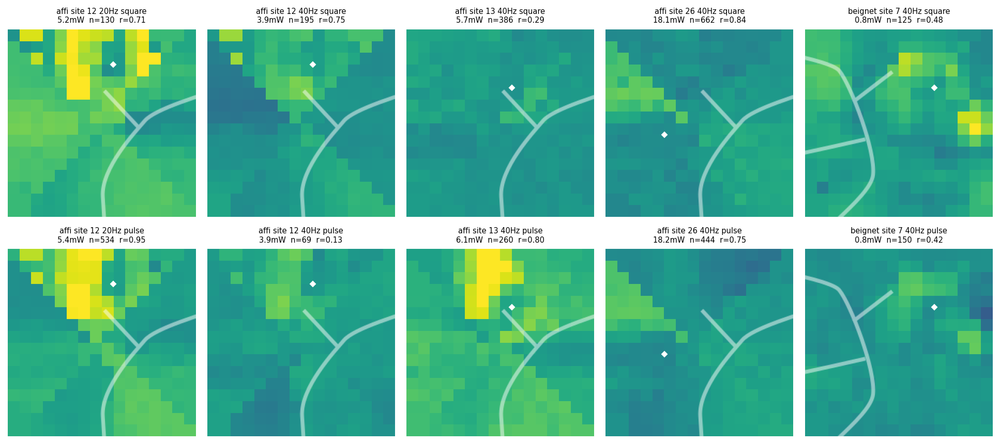

In [73]:
# Same comparison for the slic maps. Uses every pulse with the clean pre-burst baseline, the
# same recipe as the 'pulse' rows of the comparison above.
def calc_site_slic(erp, erp_baseline, samplerate, stim_site, seed):
    n_trials = erp.shape[2]
    half = n_trials//2
    trials = np.random.default_rng(seed).permutation(n_trials)
    baselines = np.random.default_rng(100 + seed).permutation(erp_baseline.shape[2])
    return [calc_sq_slic_map(erp[:,:,trials[a:b]], samplerate, stim_site,
                             erp_baseline[:,:,baselines[a:b]])
            for a, b in [(0, half), (half, 2*half)]]

site_slic = {}
for label, subject, stim_site, sq_te, pulse_te, power in tqdm(sites):
    for kind, te_ids in [('sq', sq_te), ('pulse', pulse_te)]:
        df = sq_df[np.isin(sq_df['te_id'], te_ids)].reset_index(drop=True)
        bad_trials = get_bad_stim_trials(df, channels=acq_ch-1)
        df = df[~bad_trials].reset_index(drop=True)
        erp, samplerate = load_stim_erp(df, time_before, time_after, channels=acq_ch-1)

        onsets = df[df['pulse'] == 0].reset_index(drop=True)
        baseline_df = pd.concat([onsets.assign(trial_time=onsets['trial_time'] - taper_len*j)
                                 for j in range(1, n_baseline + 1)], ignore_index=True)
        erp_baseline, _ = load_stim_erp(baseline_df, time_before, time_after, channels=acq_ch-1)

        halves = Parallel(n_jobs=6)(
            delayed(calc_site_slic)(erp, erp_baseline, samplerate, stim_site, seed)
            for seed in range(6))
        within = np.median([calc_map_correlation(a, b) for a, b in halves])
        n_base = min(erp.shape[2], erp_baseline.shape[2])
        site_slic[(label, kind)] = (
            calc_sq_slic_map(erp[:,:,:n_base], samplerate, stim_site,
                             erp_baseline[:,:,:n_base]),
            within, erp.shape[2])

plt.figure(figsize=(13, 6), dpi=150)
clim = np.nanpercentile(np.abs(np.concatenate(
    [site_slic[(l[0], k)][0] for l in sites for k in ['sq', 'pulse']])), 99)
for i, (label, subject, stim_site, _, _, power) in enumerate(sites):
    for j, kind in enumerate(['sq', 'pulse']):
        slic_map, within, n_trials = site_slic[(label, kind)]
        plt.subplot(2, len(sites), len(sites)*j + i + 1)
        im, _ = aopy.visualization.plot_annotated_spatial_drive_map_stim(
            slic_map, stim_site, subject, 'lm1', 0, colorbar=False)
        im.set_clim(-clim, clim)
        plt.title(f'{label} {"square" if kind == "sq" else "pulse"}\n'
                  f'{power[j]}mW  n={n_trials}  r={within:.2f}', fontsize=7)

plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'square_wave_site_slic.svg'), bbox_inches='tight')
plt.show()

,,n_trials,within1,within2,ceiling,across,ratio
method,site,,,,,,
erp,40Hz vs 3.9mW,34,0.814,0.953,0.881,0.832,0.944
slic,40Hz vs 3.9mW,34,0.400,0.301,0.347,0.294,0.848
erp,20Hz vs 5.3mW,65,0.953,0.851,0.901,0.873,0.969
slic,20Hz vs 5.3mW,65,0.674,0.809,0.739,0.629,0.851
erp,40Hz vs 6.0mW,102,0.765,0.981,0.866,0.651,0.752
slic,40Hz vs 6.0mW,102,0.539,0.829,0.669,0.343,0.512
erp,40Hz vs 18mW,222,0.910,0.944,0.927,0.918,0.991
slic,40Hz vs 18mW,222,0.826,0.632,0.722,0.735,1.018
erp,bei 40Hz vs 0.8mW,62,0.901,0.922,0.911,0.899,0.986


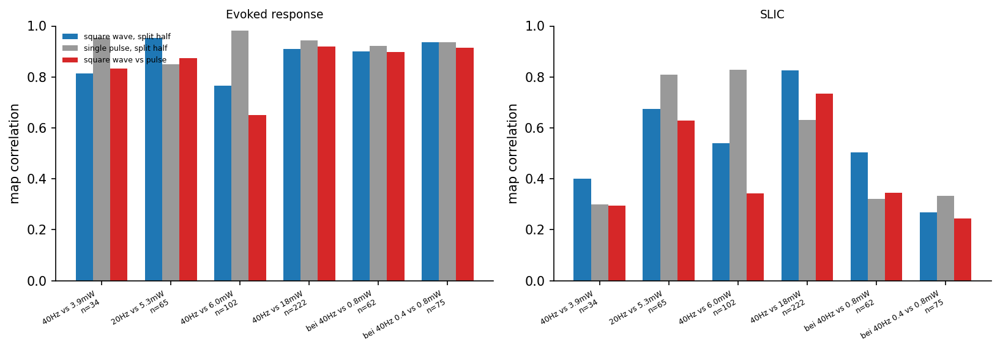

In [74]:
# Square wave against single pulse at each site, next to the two split half reliabilities that
# bound it. The square wave and pulse bars are how well each condition agrees with itself, the
# across bar is how well they agree with each other. Across sitting at the lower of the two
# means the two conditions give the same map to within the noise.
summary = sq_result[sq_result['label'].str.contains('vs pulse')
                    & (sq_result['align'] == 'pulse')].copy()
summary['site'] = (summary['label'].str.replace('beignet ', 'bei ', regex=False)
                                   .str.replace(' vs pulse', ' vs', regex=False))

display(summary[['site', 'method', 'n_trials', 'within1', 'within2', 'ceiling',
                 'across', 'ratio']].round(3).set_index(['method', 'site']))

plt.figure(figsize=(11, 4), dpi=150)
for i, (method, name) in enumerate([('erp', 'Evoked response'), ('slic', 'SLIC')]):
    plt.subplot(1, 2, i+1)
    df = summary[summary['method'] == method]
    x = np.arange(len(df))
    plt.bar(x - 0.25, df['within1'], 0.25, color='tab:blue', label='square wave, split half')
    plt.bar(x, df['within2'], 0.25, color='0.6', label='single pulse, split half')
    plt.bar(x + 0.25, df['across'], 0.25, color='tab:red', label='square wave vs pulse')
    plt.axhline(0, color='k', lw=0.5)
    plt.xticks(x, [f'{s}\nn={n}' for s, n in zip(df['site'], df['n_trials'])],
               fontsize=6, rotation=30, ha='right')
    plt.ylabel('map correlation')
    plt.ylim(0, 1)
    plt.title(name, fontsize=9)
    if i == 0:
        plt.legend(fontsize=6, frameon=False)
    sns.despine()

plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'square_wave_vs_pulse_summary.svg'), bbox_inches='tight')
plt.show()

In [ ]:
# SLIC read in different frequency bands. The frequency axis is 4 Hz apart but the multitaper
# bandwidth is 25 Hz on a 60 ms window (bw=25, n=taper_len), so neighbouring bins are not
# independent and each band below is roughly one resolution element. A band narrower than that
# would not isolate the drive frequency, so 30-55 Hz is the one that carries 40 Hz.
slic_bands = [(4, 30), (30, 55), (55, 80), (80, 120), (120, 150), (12, 150)]

def calc_slic_band_maps(erp, erp_baseline, samplerate, stim_site, bands):
    '''slic map in each band, computing the coherence once and reducing it per band'''
    freqs, time, post = calc_coh_window(erp, samplerate, stim_site, 1)
    _, _, pre = calc_coh_window(erp_baseline, samplerate, stim_site, 1)
    return {b: calc_tfr_mean(freqs, time[1:], post - pre, band=b, window=window) for b in bands}

def compare_bands(cond1, cond2, samplerate, stim_site, n_trials, bands, seed):
    rng = np.random.default_rng(seed)
    half = n_trials//2
    maps = {}
    for name, (erp, erp_baseline) in [('1', cond1), ('2', cond2)]:
        trials = rng.permutation(erp.shape[2])[:n_trials]
        baselines = rng.permutation(erp_baseline.shape[2])[:n_trials]
        for h, (a, b) in enumerate([(0, half), (half, 2*half)]):
            maps[(name, h)] = calc_slic_band_maps(
                erp[:,:,trials[a:b]], erp_baseline[:,:,baselines[a:b]],
                samplerate, stim_site, bands)
    result = {}
    for band in bands:
        a = [maps[('1', h)][band] for h in (0, 1)]
        b = [maps[('2', h)][band] for h in (0, 1)]
        result[band] = dict(
            within1=calc_map_correlation(a[0], a[1]),
            within2=calc_map_correlation(b[0], b[1]),
            across=np.mean([calc_map_correlation(a[i], b[j]) for i in (0, 1) for j in (0, 1)]))
    return result

all_band_label = []
all_band = []
all_band_within1 = []
all_band_within2 = []
all_band_across = []
for site_day, stim_site, cond1, cond2, label in tqdm(
        [c for c in sq_comparisons if 'vs pulse' in c[4]]):
    erp1, samplerate, _, base1 = sq_erp[f'{site_day}|{cond1}']
    erp2, _, _, base2 = sq_erp[f'{site_day}|{cond2}']
    n_trials = min(erp1.shape[2], erp2.shape[2])
    boot = Parallel(n_jobs=20)(
        delayed(compare_bands)((erp1, base1), (erp2, base2), samplerate, stim_site,
                               n_trials, slic_bands, seed)
        for seed in range(n_boot))
    for band in slic_bands:
        all_band_label.append(label.replace('beignet ', 'bei ').replace(' vs pulse', ' vs'))
        all_band.append(f'{band[0]}-{band[1]}')
        all_band_within1.append(np.nanmedian([b[band]['within1'] for b in boot]))
        all_band_within2.append(np.nanmedian([b[band]['within2'] for b in boot]))
        all_band_across.append(np.nanmedian([b[band]['across'] for b in boot]))

band_result = pd.DataFrame({'label': all_band_label, 'band': all_band,
                            'within1': all_band_within1, 'within2': all_band_within2,
                            'across': all_band_across})
band_result['ceiling'] = np.sqrt(np.clip(band_result['within1'], 0, None)
                                 * np.clip(band_result['within2'], 0, None))
band_result['ratio'] = band_result['across']/band_result['ceiling'].replace(0, np.nan)

aopy.data.pkl_write(f'connectivity_square_wave_bands_{version}.pkl',
                    band_result, postproc_dir)
display(band_result.round(3).set_index(['label', 'band']))

  0%|          | 0/6 [00:00<?, ?it/s]

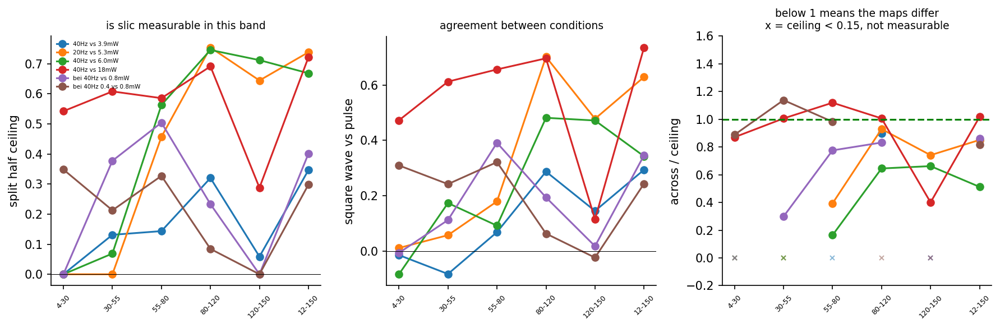

In [77]:
plt.figure(figsize=(12, 4), dpi=150)
bands = [f'{b[0]}-{b[1]}' for b in slic_bands]
labels = band_result['label'].unique()
colors = sns.color_palette(n_colors=len(labels))

plt.subplot(1, 3, 1)
for color, label in zip(colors, labels):
    df = band_result[band_result['label'] == label].set_index('band').loc[bands]
    plt.plot(range(len(bands)), df['ceiling'], 'o-', color=color, label=label)
plt.xticks(range(len(bands)), bands, rotation=45, fontsize=6)
plt.axhline(0, color='k', lw=0.5)
plt.ylabel('split half ceiling')
plt.title('is slic measurable in this band', fontsize=9)
plt.legend(fontsize=5, frameon=False)
sns.despine()

plt.subplot(1, 3, 2)
for color, label in zip(colors, labels):
    df = band_result[band_result['label'] == label].set_index('band').loc[bands]
    plt.plot(range(len(bands)), df['across'], 'o-', color=color)
plt.xticks(range(len(bands)), bands, rotation=45, fontsize=6)
plt.axhline(0, color='k', lw=0.5)
plt.ylabel('square wave vs pulse')
plt.title('agreement between conditions', fontsize=9)
sns.despine()

# the ratio is only meaningful where the map is measurable at all, so drop the points whose
# ceiling is near zero rather than plotting a ratio of noise to noise
min_ceiling = 0.15
plt.subplot(1, 3, 3)
for color, label in zip(colors, labels):
    df = band_result[band_result['label'] == label].set_index('band').loc[bands]
    ratio = df['ratio'].where(df['ceiling'] >= min_ceiling)
    plt.plot(range(len(bands)), ratio, 'o-', color=color)
    plt.plot(np.flatnonzero(df['ceiling'] < min_ceiling),
             np.zeros(np.sum(df['ceiling'] < min_ceiling)), 'x', color=color, ms=4, alpha=0.5)
plt.axhline(1, color='g', ls='--')
plt.xticks(range(len(bands)), bands, rotation=45, fontsize=6)
plt.ylim(-0.2, 1.6)
plt.ylabel('across / ceiling')
plt.title(f'below 1 means the maps differ\nx = ceiling < {min_ceiling}, not measurable', fontsize=9)
sns.despine()

plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'square_wave_slic_bands.svg'), bbox_inches='tight')
plt.show()

### Result

1. **The evoked map does not depend on waveform or frequency, in either subject.** Using every
   pulse, 40 Hz against a power matched single pulse gives 0.94 at site 12, 0.99 at site 26 and
   0.99 in beignet; 20 Hz against a pulse gives 0.97, and 20 vs 40 Hz gives 0.97. Beignet
   reaching 0.99 on a ceiling of 0.91 makes this a two subject result. A large power step is
   what moves the map (6 vs 18 mW, 0.53); a 2x step at low power does not (0.94).

2. **Site 13 is the exception, and only when later pulses are included.** Its evoked ratio is
   0.98 on burst onsets but 0.75 on every pulse, with both split halves healthy (0.77, 0.98).
   Splicing the burst's clean baseline into each pulse leaves it at 0.77, so this is not a
   baseline artifact: the response to later pulses of a train genuinely differs there. Site 13
   is also the only site that does not entrain, which may be the same thing seen two ways.

3. **Per pulse SLIC needs a separate baseline, and with one it works.** Measured against the
   60 ms before each pulse the burst conditions invert, because at 40 Hz the previous pulse sits
   inside that window (site 13 gave -0.93, site 26 -0.88, while the single pulse controls were
   untouched). Taking the pre-window from stimulation free epochs before the burst removes the
   inversion: site 13 goes to 0.51 and every ratio is positive. The baseline epochs have to be
   independent rather than one epoch repeated per pulse, since coherence is biased by trial
   count, and the 300 ms quiet window holds four non-overlapping 60 ms baselines.

4. **The extra trials make beignet's SLIC measurable.** Its split half rises from 0.11 on burst
   onsets to 0.50 on every pulse, and the ceiling from 0.10 to 0.40, so beignet now supports a
   real comparison rather than noise over noise: 40 Hz vs power matched pulse gives 0.86.

5. **SLIC is largely preserved between burst and pulse but differs between 20 and 40 Hz.**
   Per pulse: 0.85, 0.85, 0.51, 1.02 for burst vs pulse across sites, against 0.61 for 20 vs
   40 Hz. The matched power only control sits at 1.01, so the frequency difference is not a
   power effect. Larger power steps do degrade the map (0.57 at 1.9 fold).

6. **Reading slic at the drive frequency does not settle anything, because that is where it
   is least measurable.** Sweeping the band shows slic is essentially unmeasurable below 30 Hz
   (the 60 ms window cannot resolve it) and best measured at 80-120 Hz, where ceilings reach
   0.32-0.75 and every ratio is near 1. In the 30-55 Hz band that carries the 40 Hz drive, four
   of six comparisons have a ceiling under 0.15, and the two that are measurable disagree: site
   26 gives 1.01, exactly at ceiling, while beignet at 0.8 mW gives 0.30. So there is no
   evidence that a 40 Hz train changes connectivity specifically at 40 Hz, but the data cannot
   rule it out either.

7. **Site 13's divergence is band specific.** At 55-80 Hz its ceiling is 0.56 with an across
   correlation of 0.09, a ratio of 0.16 and the sharpest measurable difference in the sweep,
   while at 80-120 Hz it recovers to 0.65. Together with its evoked ratio of 0.75 per pulse and
   its flat entrainment, three measures now separate site 13 from the other sites.

8. **Bursts follow the drive frequency, single pulses do not.** At affi site 12 the 40 Hz burst
   reaches an evoked spectrum ratio of 12.9 at exactly 40 Hz against 0.9-3.6 for same day
   pulses, and the 20 Hz burst peaks at both 20 Hz (7.8) and its 40 Hz harmonic (8.2). Site 26
   replicates (8.7 vs 2.7), beignet is intermediate (5.7 vs 3.1), site 13 is flat (0.70 vs
   0.71). This is measured on burst onsets, since aligning to every pulse makes the pulse rate
   the alignment period and aliases the measurement.

**Caveats.** Frequency is still confounded with pulse width, 25 ms at 20 Hz against 12.5 ms at
40 Hz, so the controls rule out power but not width. The small comparisons are unstable: at 32
trials per half the bootstrap moves ratios by around 0.05 between runs, so 20 vs 40 Hz on burst
onsets (0.42) and per pulse (0.61) should be read as the same weak effect rather than two
numbers. The 300 ms quiet filter cuts hard, beignet te4098 keeps 48 of 100 bursts.

## Across-day drift of visual flash maps on the same days

The opto SLIC map decays with elapsed days (section above). Is that specific to the stimulation
evoked connectivity, or does anything measured on this array drift the same way? The same days
have `manual control` / `flash` sessions (a full field visual flash every ~3.75 s, 233 ms long,
~100 trials a day in affi, ~40 in beignet). Two maps are built from those flashes for every opto
site-day, and put through the same `r_same` / `r_across` pipeline:

| map | statistic | trials per map |
|---|---|---|
| `flash_erp` | rms of the trial averaged evoked potential 30-250 ms after the flash, in units of the baseline sd | 40 affi / 20 beignet |
| `flash_slic` | coherence seeded at the **same channel as the opto site**, mean of the 60-240 ms windows minus the -60-0 ms window, 12-150 Hz | 40 affi / 20 beignet |
| `opto` | the pre/post-session SLIC maps already saved in `connectivity_site_days_pre_post`, restricted to the same days | 100 |
| `opto_erp` | the opto evoked map (signed max z, the `calc_opto_resp` statistic) recomputed on the same site-days from the pooled pre and post laser trials | 100 |

The opto evoked map separates two readings of the SLIC decay: if the stimulation evoked
response itself decays while the flash response does not, the change is in how cortex responds to
the laser; if only the SLIC decays, it is specific to the connectivity estimate.

Two things differ from the flash recipe against opto on purpose. The evoked statistic is unsigned because the
flash response is biphasic and the signed max-z used for opto flips sign between split halves
(split half r 0.12 vs 0.83 for the rms, 40 trials). The post window is later than the 0-60 ms
used for opto because the visual response peaks 80-200 ms after the flash. `r_across` is always
compared to that measure's own `r_same`, so the differing trial counts only change the floor,
not the normalised decay. `aopy.data.bmi3d.tabulate_behavior_data_flash` crashes on sessions with
an unrewarded trial (`reset_index()` is not in place), so the trials are tabulated directly.

In [ ]:
from aopy.data.bmi3d import tabulate_behavior_data
from joblib import Parallel, delayed
import pickle

def tabulate_flash(preproc_dir, subjects, ids, dates):
    '''Rewarded flash trials, one row per flash, aligned to TARGET_ON.'''
    df = tabulate_behavior_data(preproc_dir, list(subjects), list(ids), list(dates),
                                [b'TARGET_ON'], [b'TRIAL_END'], [b'REWARD'], [],
                                [], df=None, event_code_type='event')
    df = df[df['reward']].reset_index(drop=True)
    df['flash_start_time'] = [t[0] for t in df['event_times']]
    df['flash_end_time'] = [t[2] if len(t) > 2 else np.nan for t in df['event_times']]
    df['trial_time'] = df['flash_start_time']
    df['date'] = pd.to_datetime(df['date']).dt.date
    return df.drop(columns=['reward', 'penalty'])

# flash sessions on the opto site-days
drift_opto = aopy.data.pkl_read(f'connectivity_drift_within_across_{version}.pkl', postproc_dir)
opto_siteday = drift_opto['siteday'].copy()
opto_siteday['date'] = pd.to_datetime(opto_siteday['date']).dt.date

flash_sessions = []
for subject, g in opto_siteday.groupby('subject'):
    dates = sorted(g['date'].unique())
    for e in db.lookup_sessions(subject=subject, task_name='manual control', task_desc='flash',
                                date=(str(dates[0]), str(dates[-1]))):
        if e.date in dates and os.path.exists(os.path.join(
                preproc_dir, subject, f'preproc_{e.date}_{subject}_{e.id}_lfp.hdf')):
            flash_sessions.append((subject, e.id, str(e.date)))
print(len(flash_sessions), 'flash sessions on opto site-days')
flash_df = tabulate_flash(preproc_dir, *zip(*flash_sessions))
display(flash_df.groupby('subject').agg(trials=('trial_time', 'size'), days=('date', 'nunique'),
                                        flash_dur=('flash_end_time', lambda x: np.median(x - flash_df.loc[x.index, 'flash_start_time']))))

In [ ]:
# One set of bootstrapped maps per subject-day, split into two disjoint divisions like the opto
# pipeline, seeded at every opto site tested that day. About 25 minutes on 24 cores.
flash_tb = flash_ta = 0.25
flash_taper = 0.06
flash_band = (12, 150)
flash_n_trials = {'affi': 40, 'beignet': 20}   # beignet has ~40 flashes a day
flash_B = 10
_, acq_ch, _ = aopy.data.load_chmap()

def calc_flash_erp_map(erp, samplerate):
    '''rms of the trial averaged evoked potential 30-250 ms, over the baseline sd'''
    t = np.arange(erp.shape[0])/samplerate - flash_tb
    m = np.nanmean(erp, axis=2)
    return np.sqrt(np.nanmean(m[(t >= 0.03) & (t < flash_ta)]**2, axis=0))/np.nanstd(m[t < 0], axis=0)

def calc_flash_slic_map(erp, samplerate, stim_site):
    '''coherence seeded at the opto site channel, 60-240 ms windows minus the -60-0 ms window'''
    stim_ch = np.where(np.isin(acq_ch, get_acq_ch_near_stimulation_site(stim_site)))[0]
    freqs, time, coh, _ = calc_connectivity_map_coh(
        erp, samplerate, flash_tb, flash_ta, stim_ch, window=(-flash_taper, 4*flash_taper),
        n=flash_taper, step=flash_taper, parallel=False, verbose=False)
    post = np.nanmean(coh[:, 2:5, :], axis=1, keepdims=True)
    return calc_tfr_mean(freqs, time[[1]], post - coh[:, [0], :], band=flash_band, window=(0, 1))

def calc_flash_day_maps(subject, day, df_day, sites):
    n_trials = flash_n_trials[subject]
    bad_trials = get_bad_stim_trials(df_day, channels=acq_ch-1)
    df_day = df_day[~bad_trials].reset_index(drop=True)
    n = len(df_day)
    if n < 2*n_trials:
        return (subject, day), dict(n=n, skipped=True)
    erp, samplerate = load_stim_erp(df_day, flash_tb, flash_ta, channels=acq_ch-1)
    out = dict(n=n, skipped=False, erp=np.full((flash_B, 2, len(acq_ch)), np.nan),
               slic={s: np.full((flash_B, 2, len(acq_ch)), np.nan) for s in sites})
    for b in range(flash_B):
        perm = np.random.default_rng(1000*b + hash(str(day)) % 1000).permutation(n)
        for d in range(2):
            idx = perm[d*n_trials:(d + 1)*n_trials]
            out['erp'][b, d] = calc_flash_erp_map(erp[:, :, idx], samplerate)
            for s in sites:
                out['slic'][s][b, d] = calc_flash_slic_map(erp[:, :, idx], samplerate, s)
    return (subject, day), out

jobs = []
for (subject, day), g in opto_siteday.groupby(['subject', 'date']):
    df_day = flash_df[(flash_df['subject'] == subject) & (flash_df['date'] == day)].reset_index(drop=True)
    if len(df_day):
        jobs.append((subject, day, df_day, sorted(g['site'].astype(int).unique())))
flash_maps = dict(Parallel(n_jobs=24, verbose=5)(delayed(calc_flash_day_maps)(*j) for j in jobs))
print(sum(1 for v in flash_maps.values() if v['skipped']), 'of', len(flash_maps), 'days skipped (too few trials)')

aopy.data.pkl_write(f'connectivity_flash_maps_{version}.pkl',
                    dict(maps=flash_maps, n_trials=flash_n_trials, B=flash_B, tb=flash_tb,
                         ta=flash_ta, taper=flash_taper, band=flash_band),
                    postproc_dir)

In [ ]:
# Opto evoked maps on the same site-days, 100 trials per map like the opto SLIC, B bootstraps x 2
# disjoint divisions, pooling that day's pre and post sessions (no within-day drift, see above).
# The trial tables are the v260218 postproc files. About 30 minutes on 24 cores.
opto_erp_n_trials = 100

def calc_opto_erp_map(erp, samplerate):
    '''signed max z, the calc_opto_resp statistic'''
    altcond, nullcond = prepare_erp(erp, erp, samplerate, 0.25, 0.25, (-0.25, 0), (0, 0.25))[:2]
    sd_erp = (altcond - np.mean(nullcond, axis=0))/np.std(nullcond, axis=0)
    return get_max_erp(sd_erp, 0, 0.25, samplerate, trial_average=True)

def calc_opto_erp_day_maps(key, df_day):
    bad_trials = get_bad_stim_trials(df_day, channels=acq_ch-1)
    df_day = df_day[~bad_trials].reset_index(drop=True)
    n = len(df_day)
    if n < 2*opto_erp_n_trials:
        return key, dict(n=n, skipped=True)
    erp, samplerate = load_stim_erp(df_day, 0.25, 0.25, channels=acq_ch-1)
    out = np.full((flash_B, 2, len(acq_ch)), np.nan)
    for b in range(flash_B):
        perm = np.random.default_rng(1000*b + hash(str(key)) % 1000).permutation(n)
        for d in range(2):
            out[b, d] = calc_opto_erp_map(erp[:, :, perm[d*opto_erp_n_trials:(d + 1)*opto_erp_n_trials]], samplerate)
    return key, dict(n=n, skipped=False, erp=out)

long_dfs = {}
for subject, min_isi in [('beignet', 0.01), ('affi', 0.1)]:
    d = load_df(postproc_dir, subject, 'rest_long', 'v260218')
    d = d[filter_stim_trials(d, min_isi=min_isi, debug=False)].reset_index(drop=True)
    d['stimulation_site'] = d['stimulation_site'].astype(int)
    d['date'] = pd.to_datetime(d['date']).dt.date
    long_dfs[subject] = d
session_names = {}
jobs = []
for r in opto_siteday.itertuples():
    d = long_dfs[r.subject]
    d = d[(d['date'] == r.date) & (d['stimulation_site'] == int(r.site))]
    for te_id in d['te_id'].unique():
        if te_id not in session_names:
            session_names[te_id] = db.lookup_sessions(id=int(te_id))[0].session
    keep = [te for te in d['te_id'].unique() if 'pre' in session_names[te] or 'post' in session_names[te]]
    jobs.append(((r.subject, int(r.site), r.date), d[d['te_id'].isin(keep)].reset_index(drop=True)))
opto_erp_maps = dict(Parallel(n_jobs=24, verbose=5)(delayed(calc_opto_erp_day_maps)(*j) for j in jobs))
print(sum(1 for v in opto_erp_maps.values() if v['skipped']), 'of', len(opto_erp_maps), 'site-days skipped')

aopy.data.pkl_write(f'connectivity_opto_erp_maps_{version}.pkl',
                    dict(maps=opto_erp_maps, n_trials=opto_erp_n_trials, B=flash_B, tb=0.25, ta=0.25),
                    postproc_dir)

In [ ]:
# Load
flash_maps = aopy.data.pkl_read(f'connectivity_flash_maps_{version}.pkl', postproc_dir)['maps']
opto_erp_maps = aopy.data.pkl_read(f'connectivity_opto_erp_maps_{version}.pkl', postproc_dir)['maps']
site_day_data = aopy.data.pkl_read(f'connectivity_site_days_pre_post_{version}.pkl', postproc_dir)
drift_opto = aopy.data.pkl_read(f'connectivity_drift_within_across_{version}.pkl', postproc_dir)
opto_siteday = drift_opto['siteday'].copy()
opto_siteday['date'] = pd.to_datetime(opto_siteday['date']).dt.date

In [ ]:
# Same three quantities as the opto drift analysis, on the same site-days, for three maps.
from scipy import stats
flash_B = 10
measures = ['opto', 'opto_erp', 'flash_slic', 'flash_erp']

def corr_rows(A, B):
    '''NaN-aware Pearson between matched rows. A, B: (n, nch) -> (n,).'''
    A = np.asarray(A, dtype=float); B = np.asarray(B, dtype=float)
    ok = np.isfinite(A) & np.isfinite(B)
    An = np.where(ok, A, np.nan); Bn = np.where(ok, B, np.nan)
    Am = An - np.nanmean(An, axis=1, keepdims=True)
    Bm = Bn - np.nanmean(Bn, axis=1, keepdims=True)
    with np.errstate(invalid='ignore', divide='ignore'):
        return np.nansum(Am*Bm, axis=1)/np.sqrt(np.nansum(Am**2, axis=1)*np.nansum(Bm**2, axis=1))

opto_index = {(s, int(st), pd.Timestamp(d).date()): i for i, (s, st, d) in enumerate(
    zip(site_day_data['all_subject'], site_day_data['all_stim_site'], site_day_data['all_date']))}

# maps[measure][(subject, site, date)] -> (nboot, ndiv, nch). opto uses pre (dist2) and post (dist1)
maps = {m: {} for m in measures}
rows = []
for r in opto_siteday.itertuples():
    key = (r.subject, int(r.site), r.date)
    fm = flash_maps.get((r.subject, r.date))
    om = opto_erp_maps.get(key)
    if fm is None or fm['skipped'] or om is None or om['skipped']:
        continue
    i = opto_index[key]
    maps['opto'][key] = np.concatenate([np.asarray(site_day_data['all_dist2'][i])[:flash_B],
                                        np.asarray(site_day_data['all_dist1'][i])[:flash_B]])
    maps['opto_erp'][key] = om['erp']
    maps['flash_slic'][key] = fm['slic'][int(r.site)]
    maps['flash_erp'][key] = fm['erp']
    rows.append(dict(subject=r.subject, site=int(r.site), date=r.date, combo=r.combo, n_flash=fm['n'],
                     r_same_opto=r.r_same,
                     r_same_opto_erp=np.nanmean(corr_rows(om['erp'][:, 0], om['erp'][:, 1])),
                     r_same_flash_slic=np.nanmean(corr_rows(fm['slic'][int(r.site)][:, 0], fm['slic'][int(r.site)][:, 1])),
                     r_same_flash_erp=np.nanmean(corr_rows(fm['erp'][:, 0], fm['erp'][:, 1]))))
df_flash_siteday = pd.DataFrame(rows)
print(len(df_flash_siteday), 'site-days with both opto and flash maps')

# across-day pairs: the same day pairs for every measure, division 0 of matched bootstraps
_acr = []
for combo, g in df_flash_siteday.groupby('combo'):
    g = g.sort_values('date')
    keys = [(r.subject, r.site, r.date) for r in g.itertuples()]
    if len(keys) < 2:
        continue
    ii, jj = np.triu_indices(len(keys), k=1)
    out = dict(combo=combo, subject=g['subject'].iloc[0], site=g['site'].iloc[0],
               gap=[(keys[b][2] - keys[a][2]).days for a, b in zip(ii, jj)])
    for m in measures:
        A = np.stack([maps[m][k][:, 0, :] for k in keys])
        r = corr_rows(A[ii].reshape(-1, A.shape[-1]), A[jj].reshape(-1, A.shape[-1])).reshape(len(ii), -1)
        out[f'r_across_{m}'] = np.nanmean(r, axis=1)
    _acr.append(pd.DataFrame(out))
df_flash_across = pd.concat(_acr, ignore_index=True)

df_flash_combo = pd.DataFrame({'n_days': df_flash_siteday.groupby('combo').size()})
for m in measures:
    df_flash_combo[f'r_same_{m}'] = df_flash_siteday.groupby('combo')[f'r_same_{m}'].median()
    df_flash_combo[f'measurable_{m}'] = pd.Series({
        c: (stats.wilcoxon(g[f'r_same_{m}'].dropna(), alternative='greater').pvalue < 0.05
            if g[f'r_same_{m}'].notna().sum() >= 6 else False)
        for c, g in df_flash_siteday.groupby('combo')})
    df_flash_combo[f'r_across_{m}'] = df_flash_across.groupby('combo')[f'r_across_{m}'].median()
    df_flash_combo[f'rho_{m}'] = pd.Series({
        c: stats.spearmanr(g['gap'], g[f'r_across_{m}'], nan_policy='omit')[0]
        for c, g in df_flash_across.groupby('combo') if len(g) >= 10})
df_flash_combo = df_flash_combo.sort_values('r_same_opto', ascending=False)
display(df_flash_combo[['n_days'] + [f'r_same_{m}' for m in measures]
                       + [f'r_across_{m}' for m in measures] + [f'rho_{m}' for m in measures]].round(3))

# normalised to each combo's own floor
gap_bins = [0, 1, 2, 4, 8, 16, 32, 64, 128, 1e5]
gap_labels = ['1', '2', '3-4', '5-8', '9-16', '17-32', '33-64', '65-128', '>128']
df_flash_across['bin'] = pd.cut(df_flash_across['gap'], bins=gap_bins, labels=gap_labels)
norm_tab = {}
for m in measures:
    keep = df_flash_combo.index[df_flash_combo[f'measurable_{m}'] & (df_flash_combo[f'r_same_{m}'] > 0.05)]
    tab = (df_flash_across[df_flash_across['combo'].isin(keep)]
           .groupby(['combo', 'bin'], observed=False)[f'r_across_{m}'].median().unstack())
    norm_tab[m] = tab.div(df_flash_combo.loc[tab.index, f'r_same_{m}'], axis=0)

aopy.data.pkl_write(f'connectivity_flash_drift_{version}.pkl',
                    dict(siteday=df_flash_siteday, across=df_flash_across, combo=df_flash_combo),
                    postproc_dir)

In [ ]:
# ---- statistics ----
print('[1] reproducibility on the shared days (median over subject-sites)')
for m in measures:
    print(f'    {m:11s} r_same={df_flash_combo[f"r_same_{m}"].median():.3f}  '
          f'measurable in {int(df_flash_combo[f"measurable_{m}"].sum())}/{len(df_flash_combo)}')

print('\n[2] decay with elapsed days, Spearman rho(gap, r_across) per measurable subject-site')
for m in measures:
    r = df_flash_combo.loc[df_flash_combo[f'measurable_{m}'], f'rho_{m}'].dropna()
    print(f'    {m:11s} n={len(r):2d}  median rho={r.median():+.3f}  negative in {int((r < 0).sum())}/{len(r)}  '
          f'p={stats.wilcoxon(r, alternative="less").pvalue:.4f}')
for a, b in [('opto', 'flash_erp'), ('opto', 'opto_erp'), ('opto_erp', 'flash_erp')]:
    both = df_flash_combo.index[df_flash_combo[f'measurable_{a}'] & df_flash_combo[f'measurable_{b}']]
    print(f'    {a} vs {b} paired on {len(both)} subject-sites: '
          f'p={stats.wilcoxon(df_flash_combo.loc[both, f"rho_{a}"], df_flash_combo.loc[both, f"rho_{b}"]).pvalue:.4f}')

print('\n[3] r_across / r_same by gap (median over measurable subject-sites)')
display(pd.DataFrame({m: norm_tab[m].median(axis=0) for m in measures}).round(2).T)

print('\n[3b] paired per subject-site: r_across / r_same at gaps > 32 days')
long_gap = df_flash_across[df_flash_across['gap'] > 32]
df_long = pd.DataFrame([
    dict(combo=c, **{m: (long_gap[long_gap.combo == c][f'r_across_{m}'].median()/df_flash_combo.loc[c, f'r_same_{m}']
                         if df_flash_combo.loc[c, f'measurable_{m}'] else np.nan) for m in measures})
    for c in df_flash_combo.index if (long_gap.combo == c).sum() >= 5]).set_index('combo')
display(df_long.round(2))
for a, b in [('opto', 'flash_erp'), ('opto', 'opto_erp'), ('opto_erp', 'flash_erp')]:
    d = df_long[[a, b]].dropna()
    print(f'    {a} vs {b}: n={len(d)}  medians {d[a].median():.2f} vs {d[b].median():.2f}, '
          f'{b} higher in {int((d[b] > d[a]).sum())}/{len(d)}, p={stats.wilcoxon(d[a], d[b]).pvalue:.4f}')
both = df_flash_combo.index[df_flash_combo['measurable_opto'] & df_flash_combo['measurable_flash_erp']]
df_long = df_long[['opto', 'flash_erp']].dropna()

print('\n[4] do the same day pairs drift together? partial Spearman(opto, flash) given log gap')
def partial_spearman(x, y, z):
    x, y, z = [stats.rankdata(v) for v in (x, y, z)]
    rx = x - np.polyval(np.polyfit(z, x, 1), z)
    ry = y - np.polyval(np.polyfit(z, y, 1), z)
    return stats.spearmanr(rx, ry)
for m in ['flash_erp', 'flash_slic']:
    for c, g in df_flash_across.groupby('combo'):
        if df_flash_combo.loc[c, 'measurable_opto'] and df_flash_combo.loc[c, f'measurable_{m}'] and len(g) >= 20:
            g = g.dropna(subset=['r_across_opto', f'r_across_{m}'])
            rho, p = partial_spearman(g['r_across_opto'], g[f'r_across_{m}'], np.log(g['gap']))
            print(f'    {c:12s} vs {m:10s} n_pairs={len(g):5d}  partial rho={rho:+.3f}  p={p:.3g}')

In [ ]:
# ---- summary figure ----
colors = {'opto': 'tab:blue', 'opto_erp': 'tab:purple', 'flash_slic': 'tab:orange', 'flash_erp': 'tab:green'}
names = {'opto': 'opto SLIC', 'opto_erp': 'opto evoked map', 'flash_slic': 'flash SLIC (seeded at site)', 'flash_erp': 'flash evoked map'}
gap_ctr = [1, 2, 3, 6, 12, 24, 48, 96, 200]
fig = plt.figure(figsize=(12, 8), dpi=150)

ax = plt.subplot(2, 2, 1)
x = np.arange(len(df_flash_combo))
for k, m in enumerate(measures):
    ax.bar(x + (k - 1.5)*0.2, df_flash_combo[f'r_same_{m}'], 0.2, color=colors[m], label=names[m])
    for xi, (v, ok) in enumerate(zip(df_flash_combo[f'r_same_{m}'], df_flash_combo[f'measurable_{m}'])):
        if not ok:
            ax.plot(xi + (k - 1.5)*0.2, v, 'kx', ms=4)
ax.axhline(0, color='k', lw=0.5)
ax.set_xticks(x); ax.set_xticklabels(df_flash_combo.index, rotation=90, fontsize=7)
ax.set_ylabel('$r_{same}$ (split half)')
ax.legend(fontsize=7, frameon=False)
ax.set_title('A. Map reproducibility on the shared days (x = not reproducible)', fontsize=9, loc='left')
sns.despine(ax=ax)

ax = plt.subplot(2, 2, 2)
for m in measures:
    if len(norm_tab[m]) == 0:   # nothing measurable, e.g. flash_slic
        continue
    for _, row in norm_tab[m].iterrows():
        ax.plot(gap_ctr, row.values, '-', color=colors[m], alpha=0.25, lw=0.8)
    ax.plot(gap_ctr, norm_tab[m].median(axis=0).values, 'o-', color=colors[m], lw=2.5, ms=6,
            label=f'{names[m]} (n={len(norm_tab[m])})')
ax.axhline(1, color='k', ls='--', lw=1); ax.axhline(0, color='k', lw=0.5)
ax.set_xscale('log'); ax.set_xticks(gap_ctr); ax.set_xticklabels(gap_labels, fontsize=7)
ax.set_xlabel('elapsed days'); ax.set_ylabel('$r_{across}$ / $r_{same}$')
ax.legend(fontsize=7, frameon=False)
ax.set_title("B. Similarity across days, normalised to each site's own floor", fontsize=9, loc='left')
sns.despine(ax=ax)

ax = plt.subplot(2, 2, 3)
for c in df_flash_combo.index:
    vals = [df_flash_combo.loc[c, f'rho_{m}'] if df_flash_combo.loc[c, f'measurable_{m}'] else np.nan for m in measures]
    ax.plot(range(len(measures)), vals, 'o-', color='0.6', ms=4, lw=1)
for k, m in enumerate(measures):
    if df_flash_combo[f'measurable_{m}'].any():
        ax.plot(k, df_flash_combo.loc[df_flash_combo[f'measurable_{m}'], f'rho_{m}'].median(), 's', color=colors[m], ms=10, zorder=5)
ax.axhline(0, color='k', ls='--', lw=1)
ax.set_xticks(range(len(measures))); ax.set_xticklabels([names[m] for m in measures], fontsize=7)
ax.set_ylabel(r'Spearman $\rho$ (gap vs $r_{across}$)')
both = df_flash_combo.index[df_flash_combo['measurable_opto'] & df_flash_combo['measurable_flash_erp']]
ax.set_title('C. Decay per subject-site (squares = median)\n'
             f'rho paired p={stats.wilcoxon(df_flash_combo.loc[both, "rho_opto"], df_flash_combo.loc[both, "rho_flash_erp"]).pvalue:.3f}; '
             f'normalised similarity >32 d paired p={stats.wilcoxon(df_long.opto, df_long.flash_erp).pvalue:.3f}',
             fontsize=9, loc='left')
sns.despine(ax=ax)

ax = plt.subplot(2, 2, 4)
for c, mk in zip(both[:2], ['o', 's']):
    g = df_flash_across[df_flash_across['combo'] == c]
    for m in ['opto', 'opto_erp', 'flash_erp']:
        ax.scatter(g['gap']*np.exp(np.random.default_rng(0).uniform(-0.05, 0.05, len(g))), g[f'r_across_{m}'],
                   s=6, marker=mk, color=colors[m], alpha=0.25)
        ax.plot(gap_ctr, g.groupby('bin', observed=False)[f'r_across_{m}'].median().values, '-', marker=mk,
                color=colors[m], lw=2, ms=6, label=f'{c} {names[m]}')
        ax.axhline(df_flash_combo.loc[c, f'r_same_{m}'], color=colors[m], ls=':', lw=1)
ax.axhline(0, color='k', lw=0.5); ax.set_xscale('log')
ax.set_xlabel('elapsed days'); ax.set_ylabel('$r_{across}$ (raw)')
ax.legend(fontsize=6, frameon=False)
ax.set_title('D. Two best sites, every day pair with binned medians\ndotted = split-half floor', fontsize=9, loc='left')
sns.despine(ax=ax)

plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'flash_vs_opto_drift.svg'), bbox_inches='tight')
plt.show()

### Result

1. **The across-day decay is specific to the stimulation response, not the array.** The flash
   evoked map is reproducible on every subject-site (median `r_same` 0.67, 13/14 measurable at
   40/20 trials) and stays close to its own floor for months: normalised similarity 0.93 at a
   1 day gap, 0.77 beyond 128 days. Opto SLIC on the same days goes 0.74 → 0.11. Beyond 32
   days the flash map sits at 0.87 of its floor against 0.30 for opto, higher in 8/8 subject-sites
   that are measurable in both (p = 0.008). Whatever the ECoG array picks up from a full field
   flash is largely the same on day 1 and day 200, so electrode impedance, array position or
   reference drift cannot be what erodes the stimulation map.

2. **The opto evoked map sits in between.** Recomputed on the same site-days at 100 trials it is
   reproducible almost everywhere (`r_same` 0.49, 13/14), and it decays: rho negative in 13/13
   (median -0.21, p = 0.0001), normalised similarity 0.97 at 1 day to 0.59 beyond 128 days. That
   is less than the SLIC decay (beyond 32 days 0.64 against 0.30, higher in 8/8, p = 0.008) but
   more than the flash decay (0.64 against 0.87, flash higher in 10/12, p = 0.04). So part of what
   erodes the SLIC map is a change in how cortex (or the fibre) responds to the laser at all, and
   part is specific to the connectivity estimate. The per-site rho for the evoked map is if
   anything steeper than for SLIC (paired p = 0.04): it declines more monotonically but from a
   much higher floor and to a much smaller total drop.

3. **The flash map does drift, slowly.** Spearman rho of `r_across` against gap is negative in
   12/13 subject-sites (median -0.17, p = 0.0004), so there is a slow array-level component.
   It accounts for roughly a quarter of the similarity at the longest gaps, against ~90% for the
   opto map. The per-site rho values are not distinguishable from the opto ones (paired p = 0.20)
   because rho only measures monotonicity, not how far the curve falls. The flash map is not
   perfectly static either: `affi_s11` falls to 0.25 of its floor in the >128 day bin (17 pairs,
   where opto is at -0.08), and the three beignet sites dip to 0.05-0.2 in the 9-32 day bins,
   which hold only 5-31 pairs and are dominated by a few specific days.

4. **Flash-driven connectivity cannot be measured.** Coherence seeded at the opto site channel
   and aligned to the flash has `r_same` ≈ 0.01 (0/14 measurable), and using all 100 flashes
   as 50 per half leaves it at -0.28 to +0.36 on individual days, i.e. noise. The flash drives
   the whole array from the retina, not one patch of cortex from a seed, so a seeded
   post-minus-pre coherence has nothing to lock onto. Only the evoked map supports a drift
   comparison; a like-for-like "does flash connectivity drift" question is not answerable here.

5. **Day pairs drift together, weakly.** Controlling for elapsed days, the opto and flash
   similarity of the same day pair are positively correlated in 5/8 subject-sites (partial rho
   0.06-0.41, beignet s11 the strongest at 0.41). Days on which the recording is different are
   different for both maps, but this shared component is small next to the opto decay.

**Caveats.** The flash sessions are awake behaving (`manual control`), the opto sessions are
rest, so state differs as well as stimulus. Trials per map differ (40 affi / 20 beignet against
100 for opto); normalising to each measure's own `r_same` handles the floor but not any
non-linearity in how noise enters the correlation. The evoked statistic is unsigned, so a
polarity change in the flash response would not register as drift here. `beignet_s11` has
`r_same` 0.45 on the 20 matched days against 0.27 on all 29, so the subset used here is its
better half. The opto evoked map pools each day's pre and post sessions, which the drift section
showed are exchangeable, and `beignet_s4` is the one site where it collapses beyond 32 days (0.14
of its floor) while its flash map does not (0.93).

## Does the response waveform itself change across days?

The map analyses above reduce each channel to one number, so they only ask whether the *same
electrodes* respond. This section keeps the trial-averaged, baseline z-scored waveform at every
channel and asks whether the response at each electrode *looks* the same across days. Same
site-days, same bootstrap x disjoint-division structure (5 bootstraps here), 100 trials per map
for opto (pooled pre and post sessions) and 40/20 for flash.

Per day pair, on channels responsive on both days (peak |z| > 4, at least 5 channels):

| metric | what it measures |
|---|---|
| `shape_r` | median over channels of the correlation between the two waveforms in the response window (0-100 ms opto, 30-300 ms flash). Scale invariant, so a pure gain change drops out. |
| `st_r` | correlation of the full time x channel matrix |
| `spatial_abs_r` | correlation of the unsigned peak map, the spatial-pattern measure for reference (`spatial_r` is the signed version) |
| `lat_shift` | median peak-latency difference (ms) |
| `log_amp_ratio` | log ratio of the top-10 channel peak amplitude, the response-derived proxy for effective drive |

Laser power is handled as a covariate rather than by filtering: per pair the log ratio of the
measured (sensor) power, of the pulse width, and of the response amplitude are carried along, and
the elapsed-days effect is reported with those partialled out. Five affi site-days also swept the
gain within one session; pooling the lower and upper halves of each sweep at 100 trials per map
gives a within-day reference for what a power step alone does to the waveform.

In [ ]:
# Waveform extraction. About 35 minutes on 24 cores for opto, 5 for flash. Saves float32 (B, 2, nt, nch)
# per site-day: opto -20..100 ms at 1 kHz, flash -50..300 ms at 500 Hz.
wave_B = 5
wave_cfg = {'opto': dict(tb=0.25, ta=0.25, n_trials={'affi': 100, 'beignet': 100}, win=(-0.02, 0.10), ds=1),
            'flash': dict(tb=0.3, ta=0.3, n_trials={'affi': 40, 'beignet': 20}, win=(-0.05, 0.30), ds=2)}

def calc_zwave(erp, samplerate, tb, win, ds):
    '''trial average, z-scored per channel against its own pre-stimulus baseline'''
    t = np.arange(erp.shape[0])/samplerate - tb
    m = np.nanmean(erp, axis=2)
    base = m[(t < -0.01)]
    z = (m - base.mean(axis=0))/base.std(axis=0)
    keep = (t >= win[0]) & (t < win[1])
    return z[keep][::ds].astype(np.float32), t[keep][::ds]

def calc_day_waveforms(key, df_day, n_trials, cfg):
    bad_trials = get_bad_stim_trials(df_day, channels=acq_ch-1)
    df_day = df_day[~bad_trials].reset_index(drop=True)
    n = len(df_day)
    if n < 2*n_trials:
        return key, dict(n=n, skipped=True)
    erp, samplerate = load_stim_erp(df_day, cfg['tb'], cfg['ta'], channels=acq_ch-1)
    out = None
    for b in range(wave_B):
        perm = np.random.default_rng(1000*b + hash(str(key)) % 1000).permutation(n)
        for d in range(2):
            z, t = calc_zwave(erp[:, :, perm[d*n_trials:(d + 1)*n_trials]], samplerate, cfg['tb'], cfg['win'], cfg['ds'])
            if out is None:
                out = np.full((wave_B, 2, len(t), len(acq_ch)), np.nan, dtype=np.float32)
            out[b, d] = z
    res = dict(n=n, skipped=False, wave=out, time=t)
    if 'trial_power' in df_day:
        res.update(power=np.nanmedian(df_day['trial_power']), width=np.nanmedian(df_day['trial_width']))
    return key, res

for mode, cfg in wave_cfg.items():
    jobs = []
    if mode == 'opto':
        for r in opto_siteday.itertuples():   # long_dfs and session_names from the opto evoked map cell
            d = long_dfs[r.subject]
            d = d[(d['date'] == r.date) & (d['stimulation_site'] == int(r.site))]
            keep = [te for te in d['te_id'].unique() if 'pre' in session_names[te] or 'post' in session_names[te]]
            jobs.append(((r.subject, int(r.site), r.date), d[d['te_id'].isin(keep)].reset_index(drop=True), cfg['n_trials'][r.subject], cfg))
    else:
        for (subject, day), g in opto_siteday.groupby(['subject', 'date']):
            d = flash_df[(flash_df['subject'] == subject) & (flash_df['date'] == day)].reset_index(drop=True)
            if len(d):
                jobs.append(((subject, day), d, cfg['n_trials'][subject], cfg))
    waves = dict(Parallel(n_jobs=24, verbose=5)(delayed(calc_day_waveforms)(*j) for j in jobs))
    with open(os.path.join(postproc_dir, f'connectivity_waveforms_{mode}_{version}.pkl'), 'wb') as f:
        pickle.dump(dict(maps=waves, B=wave_B, **cfg), f, protocol=4)
    print(mode, len(waves), 'site-days,', sum(1 for v in waves.values() if v['skipped']), 'skipped')

In [ ]:
# Within-day power reference. On the sweep days pool the lower and upper halves of the gain range,
# draw 100-trial maps from each, and compare the waveforms between pools against the split-half floor.
power_sweeps = [('affi', 26, '2023-05-19', [9383, 9384, 9385, 9386, 9387, 9391]),
                ('affi', 14, '2023-11-06', [12057]), ('affi', 28, '2024-01-19', [13689]),
                ('affi', 31, '2024-01-19', [13688]), ('affi', 20, '2024-04-24', [16978])]

def calc_wave_metrics(za, zb, t, resp, resp_win):
    '''similarity between two z waveforms (nt, nch) on a fixed responsive set'''
    w = (t >= resp_win[0]) & (t < resp_win[1]); tt = t[w]
    A, B = za[w], zb[w]
    pa, pb = np.nanmax(np.abs(A), axis=0), np.nanmax(np.abs(B), axis=0)
    sa, sb = A[:, resp], B[:, resp]
    sa = (sa - sa.mean(0))/sa.std(0); sb = (sb - sb.mean(0))/sb.std(0)
    return dict(shape_r=np.nanmedian((sa*sb).mean(0)), st_r=np.corrcoef(sa.ravel(), sb.ravel())[0, 1],
                spatial_abs_r=np.corrcoef(pa, pb)[0, 1],
                log_amp_ratio=np.log(np.mean(np.sort(pb)[-10:])/np.mean(np.sort(pa)[-10:])),
                lat_shift=np.median(tt[np.nanargmax(np.abs(B[:, resp]), axis=0)] - tt[np.nanargmax(np.abs(A[:, resp]), axis=0)])*1000)

def calc_sweep_reference(subject, site, date, te_ids, n_map=100):
    cfg = wave_cfg['opto']
    d = long_dfs[subject]
    d = d[d['te_id'].isin(te_ids)].reset_index(drop=True)
    d = d[~get_bad_stim_trials(d, channels=acq_ch-1)].reset_index(drop=True)
    erp, samplerate = load_stim_erp(d, cfg['tb'], cfg['ta'], channels=acq_ch-1)
    cut = np.median(np.sort(d['trial_gain'].unique()))
    lo, hi = np.flatnonzero(d['trial_gain'] <= cut), np.flatnonzero(d['trial_gain'] > cut)
    zall, t = calc_zwave(erp, samplerate, cfg['tb'], cfg['win'], cfg['ds'])
    resp = np.flatnonzero(np.nanmax(np.abs(zall[(t >= 0) & (t < 0.1)]), axis=0) > 4)
    rows = []
    for b in range(wave_B):
        rng = np.random.default_rng(b)
        plo, phi = rng.permutation(lo), rng.permutation(hi)
        n = min(n_map, len(plo)//2, len(phi)//2)
        z = lambda idx: calc_zwave(erp[:, :, idx], samplerate, cfg['tb'], cfg['win'], cfg['ds'])[0]
        zl0, zl1, zh0, zh1 = z(plo[:n]), z(plo[n:2*n]), z(phi[:n]), z(phi[n:2*n])
        same_lo, same_hi = calc_wave_metrics(zl0, zl1, t, resp, (0, 0.1)), calc_wave_metrics(zh0, zh1, t, resp, (0, 0.1))
        across = calc_wave_metrics(zl0, zh0, t, resp, (0, 0.1))
        rows.append(dict(site=site, date=date, n_per_map=n, n_resp=len(resp),
                         power_lo=d['trial_power'][lo].median(), power_hi=d['trial_power'][hi].median(),
                         shape_across=across['shape_r'], shape_floor=np.sqrt(max(same_lo['shape_r'], 0)*max(same_hi['shape_r'], 0)),
                         log_amp_ratio=across['log_amp_ratio'], lat_shift=across['lat_shift'],
                         lat_floor=np.median([abs(same_lo['lat_shift']), abs(same_hi['lat_shift'])])))
    return pd.DataFrame(rows)

sweep_ref = pd.concat(Parallel(n_jobs=5)(delayed(calc_sweep_reference)(*s) for s in power_sweeps), ignore_index=True)
sweep_ref = sweep_ref.groupby(['site', 'date']).median(numeric_only=True)
sweep_ref['shape_norm'] = sweep_ref['shape_across']/sweep_ref['shape_floor']
display(sweep_ref.round(2))

In [ ]:
# Load
wave_data = {m: pickle.load(open(os.path.join(postproc_dir, f'connectivity_waveforms_{m}_{version}.pkl'), 'rb')) for m in ['opto', 'flash']}
drift_opto = aopy.data.pkl_read(f'connectivity_drift_within_across_{version}.pkl', postproc_dir)
opto_siteday = drift_opto['siteday'].copy()
opto_siteday['date'] = pd.to_datetime(opto_siteday['date']).dt.date

In [ ]:
# Per site-day floors and per day-pair similarity of the waveforms, both modes.
from scipy import stats
import statsmodels.formula.api as smf
wave_thr = 4
wave_min_resp = 5
wave_resp_win = {'opto': (0.0, 0.10), 'flash': (0.03, 0.30)}
wave_metric_names = ['shape_r', 'st_r', 'spatial_r', 'spatial_abs_r', 'lat_shift', 'log_amp_ratio']

def prep_waveforms(v, resp_win):
    '''standardised response-window waveforms, signed peak maps, latencies and responsive sets per (b, d)'''
    t = v['time']; w = (t >= resp_win[0]) & (t < resp_win[1]); tt = t[w]
    W = v['wave'][:, :, w, :].astype(np.float64)                                   # (B, 2, nt, nch)
    peak_idx = np.nanargmax(np.abs(np.nan_to_num(W)), axis=2)                      # (B, 2, nch)
    peak = np.take_along_axis(W, peak_idx[:, :, None, :], axis=2)[:, :, 0, :]
    Z = (W - W.mean(axis=2, keepdims=True))/W.std(axis=2, keepdims=True)
    amp = np.array([[np.mean(np.sort(np.abs(peak[b, d])[np.isfinite(peak[b, d])])[-10:]) for d in range(2)] for b in range(W.shape[0])])
    return dict(Z=Z, peak=peak, lat=tt[peak_idx]*1000, resp=np.abs(peak) > wave_thr, amp=amp)

def calc_pair_metrics(a, b, ba, da, bb, db):
    '''metrics between (bootstrap ba, division da) of day a and (bb, db) of day b'''
    resp = a['resp'][ba, da] & b['resp'][bb, db]
    if resp.sum() < wave_min_resp:
        return dict(**{k: np.nan for k in wave_metric_names}, n_resp=int(resp.sum()))
    Za, Zb = a['Z'][ba, da][:, resp], b['Z'][bb, db][:, resp]
    pa, pb = a['peak'][ba, da], b['peak'][bb, db]; ok = np.isfinite(pa) & np.isfinite(pb)
    return dict(shape_r=np.nanmedian((Za*Zb).mean(0)), st_r=np.corrcoef(Za.ravel(), Zb.ravel())[0, 1],
                spatial_r=np.corrcoef(pa[ok], pb[ok])[0, 1], spatial_abs_r=np.corrcoef(np.abs(pa[ok]), np.abs(pb[ok]))[0, 1],
                lat_shift=np.median(b['lat'][bb, db][resp] - a['lat'][ba, da][resp]),
                log_amp_ratio=np.log(b['amp'][bb, db]/a['amp'][ba, da]), n_resp=int(resp.sum()))

_sd, _acr, wave_prepped = [], [], {}
for mode in ['opto', 'flash']:
    maps = wave_data[mode]['maps']; meta = {}
    for r in opto_siteday.itertuples():
        key = (r.subject, int(r.site), r.date) if mode == 'opto' else (r.subject, r.date)
        v = maps.get(key)
        if v is None or v['skipped']:
            continue
        if (mode, key) not in wave_prepped:
            wave_prepped[(mode, key)] = prep_waveforms(v, wave_resp_win[mode])
        p = wave_prepped[(mode, key)]
        meta[(r.subject, int(r.site), r.date)] = dict(power=v.get('power', np.nan), width=v.get('width', np.nan))
        same = pd.DataFrame([calc_pair_metrics(p, p, b, 0, b, 1) for b in range(p['Z'].shape[0])])
        _sd.append(dict(mode=mode, subject=r.subject, site=int(r.site), date=r.date, combo=r.combo, key=key,
                        n_resp=int(p['resp'][:, 0].sum(axis=1).mean()),
                        **{f'{k}_same': (same[k].abs().mean() if k in ['lat_shift', 'log_amp_ratio'] else same[k].mean()) for k in wave_metric_names},
                        **meta[(r.subject, int(r.site), r.date)]))
    sd_mode = pd.DataFrame([x for x in _sd if x['mode'] == mode])
    for combo, g in sd_mode.groupby('combo'):
        g = g.sort_values('date')
        ii, jj = np.triu_indices(len(g), k=1)
        for a_, b_ in zip(ii, jj):
            ra, rb = g.iloc[a_], g.iloc[b_]
            pa, pb = wave_prepped[(mode, ra.key)], wave_prepped[(mode, rb.key)]
            m = pd.DataFrame([calc_pair_metrics(pa, pb, b, 0, b, 0) for b in range(min(pa['Z'].shape[0], pb['Z'].shape[0]))]).mean()
            _acr.append(dict(mode=mode, combo=combo, subject=ra.subject, site=ra.site, gap=(rb.date - ra.date).days,
                             log_power_ratio=np.log(rb.power/ra.power), log_width_ratio=np.log(rb.width/ra.width), **m.to_dict()))
    print(mode, len(sd_mode), 'site-days')
df_wave_siteday = pd.DataFrame(_sd)
df_wave_across = pd.DataFrame(_acr)
df_wave_across['bin'] = pd.cut(df_wave_across['gap'], bins=gap_bins, labels=gap_labels)
for c in ['log_amp_ratio', 'log_power_ratio', 'log_width_ratio', 'lat_shift']:
    df_wave_across[f'abs_{c}'] = df_wave_across[c].abs()
df_wave_across['log_gap'] = np.log(df_wave_across['gap'])

df_wave_combo = {}
for mode in ['opto', 'flash']:
    s = df_wave_siteday[df_wave_siteday['mode'] == mode]; a = df_wave_across[df_wave_across['mode'] == mode]
    c = pd.DataFrame({'n_days': s.groupby('combo').size(), 'n_resp': s.groupby('combo')['n_resp'].median()})
    for k in wave_metric_names:
        c[f'{k}_same'] = s.groupby('combo')[f'{k}_same'].median()
        c[f'{k}_across'] = a.groupby('combo')[k].median() if k not in ['lat_shift', 'log_amp_ratio'] else a.groupby('combo')[f'abs_{k}'].median()
        if k not in ['lat_shift', 'log_amp_ratio']:
            c[f'rho_{k}'] = pd.Series({cc: stats.spearmanr(g['gap'], g[k], nan_policy='omit')[0] for cc, g in a.groupby('combo') if g[k].notna().sum() >= 10})
    c['rho_abs_lat'] = pd.Series({cc: stats.spearmanr(g['gap'], g['abs_lat_shift'], nan_policy='omit')[0] for cc, g in a.groupby('combo') if g['abs_lat_shift'].notna().sum() >= 10})
    c['measurable'] = pd.Series({cc: (stats.wilcoxon(g['shape_r_same'].dropna(), alternative='greater').pvalue < 0.05 if g['shape_r_same'].notna().sum() >= 6 else False)
                                 for cc, g in s.groupby('combo')})
    df_wave_combo[mode] = c.sort_values('shape_r_same', ascending=False)
    display(Markdown(f'**{mode}**'))
    display(c.sort_values('shape_r_same', ascending=False)[['n_days', 'n_resp', 'shape_r_same', 'spatial_abs_r_same', 'lat_shift_same', 'shape_r_across',
                                                          'spatial_abs_r_across', 'lat_shift_across', 'measurable', 'rho_shape_r', 'rho_spatial_abs_r', 'rho_abs_lat']].round(3))

aopy.data.pkl_write(f'connectivity_waveform_drift_{version}.pkl',
                    dict(siteday=df_wave_siteday.drop(columns='key'), across=df_wave_across, combo=df_wave_combo, sweep_ref=sweep_ref),
                    postproc_dir)

In [ ]:
# ---- statistics ----
wave_norm = {}
for mode in ['opto', 'flash']:
    c = df_wave_combo[mode]; meas = c.index[c['measurable']]
    a = df_wave_across[(df_wave_across['mode'] == mode) & df_wave_across['combo'].isin(meas)]
    print(f'==== {mode}: {len(meas)}/{len(c)} subject-sites with a reproducible waveform ====')
    print(f'[1] floors (median over those): shape={c.loc[meas, "shape_r_same"].median():.2f}  spatiotemporal={c.loc[meas, "st_r_same"].median():.2f}  '
          f'unsigned spatial map={c.loc[meas, "spatial_abs_r_same"].median():.2f}  |latency shift|={c.loc[meas, "lat_shift_same"].median():.1f} ms')
    print('[2] decay with gap, Spearman rho per subject-site:')
    for k in ['rho_shape_r', 'rho_st_r', 'rho_spatial_abs_r', 'rho_abs_lat']:
        r = c.loc[meas, k].dropna()
        print(f'    {k:18s} median={r.median():+.3f}  negative in {int((r < 0).sum())}/{len(r)}  p={stats.wilcoxon(r).pvalue:.4f}')
    wave_norm[mode] = {}
    for k in ['shape_r', 'st_r', 'spatial_abs_r']:
        tab = a.groupby(['combo', 'bin'], observed=False)[k].median().unstack()
        wave_norm[mode][k] = tab.div(c.loc[tab.index, f'{k}_same'], axis=0)
    print('[3] r_across / r_same by gap bin (median over subject-sites):')
    display(pd.DataFrame({k: v.median(axis=0) for k, v in wave_norm[mode].items()}).round(2).T)
    print('    median |latency shift| (ms) by bin:', a.groupby(['combo', 'bin'], observed=False)['abs_lat_shift'].median().unstack().median(axis=0).round(1).to_dict())
    print('    median |log amplitude ratio| by bin:', a.groupby('bin', observed=False)['abs_log_amp_ratio'].median().round(2).to_dict())
    print()

print('==== opto vs flash, waveform shape beyond 32 days, paired per subject-site ====')
_rows = []
for combo in df_wave_combo['opto'].index[df_wave_combo['opto']['measurable']]:
    if combo in df_wave_combo['flash'].index and df_wave_combo['flash'].loc[combo, 'measurable']:
        o = df_wave_across[(df_wave_across['mode'] == 'opto') & (df_wave_across['combo'] == combo) & (df_wave_across['gap'] > 32)]
        f = df_wave_across[(df_wave_across['mode'] == 'flash') & (df_wave_across['combo'] == combo) & (df_wave_across['gap'] > 32)]
        if len(o) >= 5 and len(f) >= 5:
            _rows.append(dict(combo=combo, opto=o['shape_r'].median()/df_wave_combo['opto'].loc[combo, 'shape_r_same'],
                              flash=f['shape_r'].median()/df_wave_combo['flash'].loc[combo, 'shape_r_same']))
_d = pd.DataFrame(_rows).set_index('combo'); display(_d.round(2))
print(f'    flash higher in {int((_d.flash > _d.opto).sum())}/{len(_d)}, p={stats.wilcoxon(_d.opto, _d.flash).pvalue:.4f}')

print('\n==== opto: laser power as a covariate ====')
c = df_wave_combo['opto']; meas = c.index[c['measurable']]
aa = df_wave_across[(df_wave_across['mode'] == 'opto') & df_wave_across['combo'].isin(meas)].dropna(
    subset=['shape_r', 'abs_log_amp_ratio', 'abs_log_power_ratio', 'abs_log_width_ratio'])
print(f'    across day pairs: Spearman(log measured power ratio, log amplitude ratio) = {stats.spearmanr(aa.log_power_ratio, aa.log_amp_ratio)[0]:+.3f}  '
      f'-> the sensor power does not track the effective drive')
for y in ['shape_r', 'spatial_abs_r', 'abs_lat_shift']:
    m0 = smf.ols(f'{y} ~ log_gap + C(combo)', data=aa).fit()
    m1 = smf.ols(f'{y} ~ log_gap + abs_log_amp_ratio + abs_log_power_ratio + abs_log_width_ratio + C(combo)', data=aa).fit()
    print(f'    {y:14s} log-gap coefficient {m0.params.log_gap:+.4f} alone -> {m1.params.log_gap:+.4f} with covariates (p={m1.pvalues.log_gap:.1g}); '
          f'|amp ratio| {m1.params.abs_log_amp_ratio:+.3f} (p={m1.pvalues.abs_log_amp_ratio:.1g}), |power ratio| {m1.params.abs_log_power_ratio:+.3f} (p={m1.pvalues.abs_log_power_ratio:.2f}), '
          f'|width ratio| {m1.params.abs_log_width_ratio:+.3f} (p={m1.pvalues.abs_log_width_ratio:.1g})')
def partial_spearman_multi(g, y, x, covs):
    X = np.column_stack([np.ones(len(g))] + [stats.rankdata(g[cv]) for cv in covs])
    resid = lambda v: stats.rankdata(v) - X @ np.linalg.lstsq(X, stats.rankdata(v), rcond=None)[0]
    return stats.spearmanr(resid(g[x]), resid(g[y]))
print('    per subject-site Spearman(gap, shape_r), raw and partialling |amp|, |power|, |width| ratios:')
for combo, g in aa.groupby('combo'):
    if len(g) >= 20:
        raw = stats.spearmanr(g['gap'], g['shape_r']); par = partial_spearman_multi(g, 'shape_r', 'log_gap', ['abs_log_amp_ratio', 'abs_log_power_ratio', 'abs_log_width_ratio'])
        print(f'      {combo:12s} n={len(g):5d}  raw {raw[0]:+.3f}  partial {par[0]:+.3f} (p={par[1]:.2g})')
mt = aa[aa['abs_log_amp_ratio'] < 0.15].groupby(['combo', 'bin'], observed=False)['shape_r'].median().unstack()
print('    amplitude-matched pairs only (|log amp ratio| < 0.15), normalised shape_r by bin:',
      mt.div(c.loc[mt.index, 'shape_r_same'], axis=0).median(axis=0).round(2).to_dict())
print('    within-day power step reference (sweep days with a measurable floor):')
display(sweep_ref[sweep_ref['shape_floor'] > 0.3][['n_per_map', 'power_lo', 'power_hi', 'log_amp_ratio', 'shape_across', 'shape_floor', 'shape_norm', 'lat_shift', 'lat_floor']].round(2))

In [ ]:
# ---- summary figure ----
wave_col = {'opto': 'tab:blue', 'flash': 'tab:green'}
fig = plt.figure(figsize=(15, 9), dpi=150)

ax = plt.subplot(2, 3, 1)
order = df_wave_combo['opto'].index
x = np.arange(len(order))
for k, mode in enumerate(['opto', 'flash']):
    c = df_wave_combo[mode]
    ax.bar(x + (k - 0.5)*0.4, [c['shape_r_same'].get(cc, np.nan) for cc in order], 0.4, color=wave_col[mode], label=f'{mode} waveform shape')
    ax.plot(x + (k - 0.5)*0.4, [c['spatial_abs_r_same'].get(cc, np.nan) for cc in order], 'kx', ms=4, label='spatial map (unsigned)' if k == 0 else None)
ax.set_xticks(x); ax.set_xticklabels(order, rotation=90, fontsize=7); ax.axhline(0, color='k', lw=0.5)
ax.set_ylabel('split-half correlation'); ax.legend(fontsize=7, frameon=False)
ax.set_title('A. Floors: waveform shape (bars) vs spatial map (x)', fontsize=9, loc='left'); sns.despine(ax=ax)

ax = plt.subplot(2, 3, 2)
for mode in ['opto', 'flash']:
    n = wave_norm[mode]
    ax.plot(gap_ctr, n['shape_r'].median(axis=0).values, 'o-', color=wave_col[mode], lw=2.5, label=f'{mode} waveform shape (n={len(n["shape_r"])})')
    ax.plot(gap_ctr, n['spatial_abs_r'].median(axis=0).values, 's--', color=wave_col[mode], lw=1.5, alpha=0.7, label=f'{mode} spatial map (unsigned)')
ax.axhline(1, color='k', ls='--', lw=1); ax.axhline(0, color='k', lw=0.5); ax.set_xscale('log'); ax.set_xticks(gap_ctr); ax.set_xticklabels(gap_labels, fontsize=7)
ax.set_xlabel('elapsed days'); ax.set_ylabel('$r_{across}$ / $r_{same}$'); ax.legend(fontsize=7, frameon=False)
ax.set_title('B. Waveform shape holds for months, then collapses (opto)', fontsize=9, loc='left'); sns.despine(ax=ax)

ax = plt.subplot(2, 3, 3)
for mode in ['opto', 'flash']:
    c = df_wave_combo[mode]; meas = c.index[c['measurable']]
    a = df_wave_across[(df_wave_across['mode'] == mode) & df_wave_across['combo'].isin(meas)]
    ax.plot(gap_ctr, a.groupby(['combo', 'bin'], observed=False)['abs_lat_shift'].median().unstack().median(axis=0).values, 'o-', color=wave_col[mode], lw=2.5, label=f'{mode} across days')
    ax.axhline(c.loc[meas, 'lat_shift_same'].median(), color=wave_col[mode], ls=':', lw=1.5, label=f'{mode} split-half floor')
ax.set_xscale('log'); ax.set_xticks(gap_ctr); ax.set_xticklabels(gap_labels, fontsize=7)
ax.set_xlabel('elapsed days'); ax.set_ylabel('median |peak latency shift| (ms)'); ax.legend(fontsize=7, frameon=False)
ax.set_title('C. Peak latency shift', fontsize=9, loc='left'); sns.despine(ax=ax)

ax = plt.subplot(2, 3, 4)
c = df_wave_combo['opto']
a = df_wave_across[(df_wave_across['mode'] == 'opto') & df_wave_across['combo'].isin(c.index[c['measurable']])].dropna(subset=['shape_r', 'abs_log_amp_ratio']).copy()
a['norm'] = a['shape_r']/c.loc[a['combo'], 'shape_r_same'].values
a['amp_bin'] = pd.cut(a['abs_log_amp_ratio'], [0, 0.1, 0.2, 0.35, 0.5, 0.75, 1, 3])
for lab, sel, colr in [('gap <= 8 d', a['gap'] <= 8, 'tab:cyan'), ('gap 9-64 d', (a['gap'] > 8) & (a['gap'] <= 64), 'tab:blue'), ('gap > 64 d', a['gap'] > 64, 'navy')]:
    g = a[sel].groupby('amp_bin', observed=False)['norm'].median()
    ax.plot([iv.mid for iv in g.index], g.values, 'o-', color=colr, label=lab)
ref = sweep_ref[sweep_ref['shape_floor'] > 0.3]
ax.plot(ref['log_amp_ratio'].abs(), ref['shape_norm'], '*', color='tab:red', ms=12, label='within-day power step (sweep days)')
ax.axhline(1, color='k', ls='--', lw=1); ax.set_xlabel('|log amplitude ratio| between the two maps'); ax.set_ylabel('opto shape $r_{across}$ / $r_{same}$')
ax.legend(fontsize=7, frameon=False); ax.set_title('D. Amplitude difference does not explain the shape change', fontsize=9, loc='left'); sns.despine(ax=ax)

for k, mode in enumerate(['opto', 'flash']):
    ax = plt.subplot(2, 3, 5 + k)
    c = df_wave_combo[mode]; combo_name = c[c['measurable']]['n_days'].idxmax()
    sdm = df_wave_siteday[(df_wave_siteday['mode'] == mode) & (df_wave_siteday['combo'] == combo_name)].sort_values('date')
    sdm = sdm.iloc[np.unique(np.linspace(0, len(sdm) - 1, min(len(sdm), 20)).astype(int))]
    maps = wave_data[mode]['maps']
    v0 = maps[sdm['key'].iloc[0]]; t = v0['time']*1000
    ch = int(np.nanargmax(np.abs(np.nanmean(v0['wave'][:, 0], axis=0)).max(axis=0)))
    cmap = plt.get_cmap('viridis'); d0 = sdm['date'].iloc[0]; span = max((sdm['date'].iloc[-1] - d0).days, 1)
    for r in sdm.itertuples():
        w = np.nanmean(maps[r.key]['wave'][:, 0, :, ch], axis=0)
        ax.plot(t, w/np.nanmax(np.abs(w)), color=cmap((r.date - d0).days/span), lw=0.8, alpha=0.8)
    plt.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, span)), ax=ax, label='days since first session', fraction=0.04)
    ax.axvline(0, color='k', lw=0.5); ax.set_xlabel('ms from onset'); ax.set_ylabel('z (peak normalised)')
    ax.set_title(f'{"EF"[k]}. {mode} waveform at channel {ch}, {combo_name}, {len(sdm)} days', fontsize=9, loc='left'); sns.despine(ax=ax)

plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'waveform_drift.svg'), bbox_inches='tight')
plt.show()

### Result

1. **The response waveform at each electrode is highly reproducible.** Split-half shape
   correlation 0.86 for opto (11/14 subject-sites measurable at 100 trials) and 0.80 for flash
   (13/14), well above the unsigned spatial-map floors (0.73 and 0.60). Peak latency is stable to
   ~1 ms within a day for opto; the flash peak is broad and its latency floor is ~15 ms, so latency
   is not informative there.

2. **The opto waveform shape holds for months, then changes.** Normalised to its floor it stays at
   0.93 or above through 32 days, sits at 0.83-0.86 at 1-4 months, and drops to 0.29 beyond 128
   days (five sites reach that gap: `affi_s29` 0.68, `s26` 0.33, `s11` 0.29, `s31` 0.24, `s2`
   -0.05). Over the same gaps the unsigned spatial map decays sooner (0.77 at 17-32 days) but
   holds better at the end (0.57). So up to ~4 months the *shape* of the response at a given
   electrode is preserved better than the *pattern* across electrodes; past that the waveform
   itself is different. Peak latency tells the same story: |shift| 0.8 ms through 4 days, 3-5 ms at
   1-4 months, 23 ms beyond 128 days. In `affi_s26` (panel E) the early trough moves from ~10 to
   ~25-30 ms and the late positivity disappears over 200 days.

3. **Flash waveforms barely move.** Shape 0.97 to 0.91 beyond 128 days, spatial map 0.94 to 0.87.
   Paired per site beyond 32 days the flash shape sits higher than opto in 8/10 (0.93 vs 0.82
   median, p = 0.06); the two exceptions are the beignet sites, where the flash maps at 20 trials
   are noisier.

4. **Power does not account for it.** Across day pairs the measured (sensor) power ratio is
   unrelated to the response amplitude ratio (rho = -0.04); across days power was turned up
   (rho ~0.8 with date at most sites) while the response amplitude fell, so the sensor power is
   not the effective drive and is a useless covariate. The response amplitude ratio and the pulse
   width ratio do covary with the shape change (both coefficients about -0.15); partialling all
   three shrinks the log-gap coefficient by a third (-0.074 to -0.050) and leaves it highly
   significant. Per site the gap effect survives partialling in 6/11 (`affi_s2`, `s26`, `s29`,
   `s31`, `s28`) and disappears in 5/11 (`affi_s11`, `s14`, `s20`, `beignet_s1`, `s11`).
   Amplitude-matched pairs alone (|log ratio| < 0.15) give 0.98-1.0 through 8 days, 0.83-0.86 at
   1-4 months and 0.47 beyond 128 days. The within-day reference agrees: on the two sweep days with a
   measurable floor a ~1.7x amplitude step from power alone leaves the shape at ceiling (0.99 and
   1.10 of floor), and panel D shows that at *any* amplitude difference the long-gap pairs sit
   below the short-gap pairs. Amplitude differences shift the curve down a little; elapsed time
   shifts it a lot.

**Caveats.** The amplitude ratio is endogenous: genuine drift also changes amplitude, so
partialling it is conservative and the "survives in 6/11" count understates the effect. Only five
sites reach the >128 day bin and one of them (`affi_s2`) has 67 pairs. Responsive channels are
defined at |z| > 4 on each day; the shared set shrinks with drift, which biases `shape_r` upward
at long gaps if anything. Three of the five sweep days had no measurable waveform at 100 trials,
so the within-day power reference rests on two days. Pulse width varied with power across days
(3 to 30 ms) and is only partially separable from it.

## The waveform of connectivity: imaginary coherence time course to the stimulation site

The evoked-waveform comparison above averages over all responsive channels, which mixes electrodes
driven directly by channelrhodopsin with electrodes that respond through connections (or, for the
flash, through the visual pathway). To look at the connectivity signal itself, this section builds
a *time course* of imaginary coherence between the stimulation-site channels and every other
channel, and asks whether that time course keeps its shape across days.

**Method.** Instead of 60 ms windowed spectra, each trial is passed through
`aopy.precondition.mtfilter` (60 ms tapers, half bandwidth 25 Hz, two tapers, the SLIC settings)
at five centre frequencies tiling 12-162 Hz (the 100 Hz filter is also kept alone as a 75-125 Hz
read-out). The complex outputs give imaginary coherence at every sample,
`|Im mean_trials(x_stim conj(x_ch))| / sqrt(Sxx Syy)`, averaged over the four stimulation channels
and the five filters. Its 0-60 ms minus -60-0 ms mean correlates 0.90 with the windowed
`calc_connectivity_map_coh` SLIC map on the two days checked, with the same split-half
reliability, at 7 s per 100-trial map. Note `prepare_erp` starts its window one sample early, so a
window beginning at the epoch edge collapses to one sample; the window here starts 20 ms in.

**Comparison.** For each pair of maps the channel set is the *union* of the top-20 SLIC channels of
both maps (stimulation channels excluded), so a channel connected on either day counts and the
comparison is not biased toward channels that stayed connected. On that set: `shape_r` is the
median waveform correlation (-20 to 150 ms), `st_r` the time x channel correlation, `lat_shift`
the shift of the coherence peak, and `log_amp_ratio` the log ratio of each map's top-10 SLIC
amplitude. `slic_r` is the plain SLIC map correlation for reference. Floors use the two divisions of
the same day with the same rule. The evoked-waveform results of the previous section are drawn
alongside.

In [ ]:
# Extraction, about an hour on 24 cores for opto and 20 minutes for flash.
from aopy import precondition
from aopy.analysis.connectivity import prepare_erp as prepare_erp_conn
imcoh_centers = [37.5, 62.5, 87.5, 112.5, 137.5]
imcoh_f0_hg = 100.0
imcoh_B = 5
imcoh_win = (-0.06, 0.20)
imcoh_ds = 4     # store every 4th sample (250 Hz)

def calc_imcoh_timecourse(erp, samplerate, stim_ch, time_before, time_after, centers):
    '''erp (nt, nch, ntr) -> {f0: (nt, nch) imaginary coherence to the stim channels}, time axis'''
    t_start = -time_before + 0.02
    data = prepare_erp_conn(erp, samplerate, time_before, time_after, (-time_before, 0), (t_start, time_after), zscore=False, ref=True)
    nt, nch, ntr = data.shape
    n, p, k = precondition.convert_taper_parameters(0.06, 25.0)
    out = {}
    for f0 in centers:
        X = precondition.mtfilter(data.reshape(nt, nch*ntr), n, p, k, fs=samplerate, f0=f0, complex_output=True).reshape(nt, nch, ntr)
        Syy = np.mean(np.abs(X)**2, axis=2)
        coh = np.zeros((nt, nch))
        for s in np.atleast_1d(stim_ch):
            Sxy = np.mean(X[:, [s], :]*np.conj(X), axis=2)
            coh += np.abs(Sxy.imag)/np.sqrt(Syy[:, [s]]*Syy)
        out[f0] = coh/len(np.atleast_1d(stim_ch))
    return out, np.arange(nt)/samplerate + t_start

def calc_day_imcoh(key, df_day, sites, n_trials):
    bad_trials = get_bad_stim_trials(df_day, channels=acq_ch-1)
    df_day = df_day[~bad_trials].reset_index(drop=True)
    n = len(df_day)
    if n < 2*n_trials:
        return key, dict(n=n, skipped=True)
    erp, samplerate = load_stim_erp(df_day, 0.25, 0.25, channels=acq_ch-1)
    res = dict(n=n, skipped=False, imcoh={}, imcoh_hg={}, stim_ch={})
    if 'trial_power' in df_day:
        res.update(power=np.nanmedian(df_day['trial_power']), width=np.nanmedian(df_day['trial_width']))
    for site in sites:
        stim_ch = np.where(np.isin(acq_ch, get_acq_ch_near_stimulation_site(site)))[0]
        out = out_hg = None
        for b in range(imcoh_B):
            perm = np.random.default_rng(1000*b + hash(str(key)) % 1000).permutation(n)
            for d in range(2):
                coh, t = calc_imcoh_timecourse(erp[:, :, perm[d*n_trials:(d + 1)*n_trials]], samplerate, stim_ch, 0.25, 0.25, imcoh_centers + [imcoh_f0_hg])
                keep = np.flatnonzero((t >= imcoh_win[0]) & (t < imcoh_win[1]))[::imcoh_ds]
                if out is None:
                    out = np.full((imcoh_B, 2, len(keep), len(acq_ch)), np.nan, dtype=np.float32); out_hg = out.copy(); res['time'] = t[keep]
                out[b, d] = np.mean([coh[f][keep] for f in imcoh_centers], axis=0)
                out_hg[b, d] = coh[imcoh_f0_hg][keep]
        res['imcoh'][site] = out; res['imcoh_hg'][site] = out_hg; res['stim_ch'][site] = stim_ch
    return key, res

for mode in ['opto', 'flash']:
    jobs = []
    if mode == 'opto':
        for r in opto_siteday.itertuples():    # long_dfs, session_names from the opto evoked map cell
            d = long_dfs[r.subject]
            d = d[(d['date'] == r.date) & (d['stimulation_site'] == int(r.site))]
            keep = [te for te in d['te_id'].unique() if 'pre' in session_names[te] or 'post' in session_names[te]]
            jobs.append(((r.subject, int(r.site), r.date), d[d['te_id'].isin(keep)].reset_index(drop=True), [int(r.site)], 100))
    else:
        for (subject, day), g in opto_siteday.groupby(['subject', 'date']):
            d = flash_df[(flash_df['subject'] == subject) & (flash_df['date'] == day)].reset_index(drop=True)
            if len(d):
                jobs.append(((subject, day), d, sorted(g['site'].astype(int).unique()), {'affi': 40, 'beignet': 20}[subject]))
    imcoh_maps = dict(Parallel(n_jobs=24, verbose=5)(delayed(calc_day_imcoh)(*j) for j in jobs))
    with open(os.path.join(postproc_dir, f'connectivity_imcoh_waveforms_{mode}_{version}.pkl'), 'wb') as f:
        pickle.dump(dict(maps=imcoh_maps, B=imcoh_B, window=imcoh_win, downsample=imcoh_ds, centers=imcoh_centers, f0_hg=imcoh_f0_hg), f, protocol=4)
    print(mode, len(imcoh_maps), 'site-days')

In [ ]:
# Load
imcoh_data = {m: pickle.load(open(os.path.join(postproc_dir, f'connectivity_imcoh_waveforms_{m}_{version}.pkl'), 'rb'))['maps'] for m in ['opto', 'flash']}
wave_drift = aopy.data.pkl_read(f'connectivity_waveform_drift_{version}.pkl', postproc_dir)   # evoked waveform results, for comparison
drift_opto = aopy.data.pkl_read(f'connectivity_drift_within_across_{version}.pkl', postproc_dir)
opto_siteday = drift_opto['siteday'].copy()
opto_siteday['date'] = pd.to_datetime(opto_siteday['date']).dt.date

In [ ]:
# Floors and day-pair similarity of the imaginary coherence time course, opto and flash.
from scipy import stats
imcoh_K = 20
imcoh_band = 'imcoh'          # broadband 12-162 Hz; 'imcoh_hg' gives lower floors (0.79/0.92 vs 0.96 at the two strong sites)
imcoh_metric_names = ['shape_r', 'st_r', 'slic_r', 'lat_shift', 'log_amp_ratio']

def prep_imcoh(tc, t, stim_ch):
    '''tc (B, 2, nt, nch) -> standardised shape window, baseline-subtracted window, SLIC map, top-K set, peak latency, amplitude'''
    pre = (t >= -0.06) & (t < 0); post = (t >= 0) & (t < 0.06); w = (t >= -0.02) & (t < 0.15); pk = (t >= 0) & (t < 0.15)
    tc = tc.astype(np.float64)
    slic = tc[:, :, post].mean(2) - tc[:, :, pre].mean(2)
    slic[:, :, stim_ch] = np.nan
    order = np.argsort(np.where(np.isfinite(slic), slic, -np.inf), axis=2)
    topk = np.zeros(slic.shape, bool); np.put_along_axis(topk, order[:, :, -imcoh_K:], True, axis=2)
    W = tc[:, :, w, :]
    Z = (W - W.mean(2, keepdims=True))/W.std(2, keepdims=True)
    Wb = W - tc[:, :, pre].mean(2)[:, :, None, :]
    lat = t[pk][np.argmax(np.where(np.isfinite(tc[:, :, pk, :]), tc[:, :, pk, :], -np.inf), axis=2)]*1000
    amp = np.array([[np.nanmean(np.sort(slic[b, d][np.isfinite(slic[b, d])])[-10:]) for d in range(2)] for b in range(tc.shape[0])])
    return dict(Z=Z, Wb=Wb, slic=slic, topk=topk, lat=lat, amp=amp)

def calc_imcoh_pair(a, b, ba, da, bb, db):
    sel = a['topk'][ba, da] | b['topk'][bb, db]
    Za, Zb = a['Z'][ba, da][:, sel], b['Z'][bb, db][:, sel]
    sa, sb = a['slic'][ba, da], b['slic'][bb, db]; ok = np.isfinite(sa) & np.isfinite(sb)
    return dict(shape_r=np.nanmedian((Za*Zb).mean(0)),
                st_r=np.corrcoef(a['Wb'][ba, da][:, sel].ravel(), b['Wb'][bb, db][:, sel].ravel())[0, 1],
                slic_r=np.corrcoef(sa[ok], sb[ok])[0, 1],
                lat_shift=np.median(b['lat'][bb, db][sel] - a['lat'][ba, da][sel]),
                log_amp_ratio=np.log(b['amp'][bb, db]/a['amp'][ba, da]), n_sel=int(sel.sum()))

_sd, _acr = [], []
for mode in ['opto', 'flash']:
    maps = imcoh_data[mode]; prepped, meta = {}, {}
    for r in opto_siteday.itertuples():
        key = (r.subject, int(r.site), r.date) if mode == 'opto' else (r.subject, r.date)
        v = maps.get(key)
        if v is None or v['skipped']:
            continue
        ck = (r.subject, int(r.site), r.date)
        prepped[ck] = prep_imcoh(v[imcoh_band][int(r.site)], v['time'], v['stim_ch'][int(r.site)])
        meta[ck] = dict(power=v.get('power', np.nan), width=v.get('width', np.nan))
        p = prepped[ck]
        same = pd.DataFrame([calc_imcoh_pair(p, p, b, 0, b, 1) for b in range(p['Z'].shape[0])])
        _sd.append(dict(mode=mode, subject=r.subject, site=int(r.site), date=r.date, combo=r.combo, key=ck, n_sel=same['n_sel'].mean(), amp=p['amp'][:, 0].mean(),
                        **{f'{k}_same': (same[k].abs().mean() if k in ['lat_shift', 'log_amp_ratio'] else same[k].mean()) for k in imcoh_metric_names}, **meta[ck]))
    sd_mode = pd.DataFrame([x for x in _sd if x['mode'] == mode])
    for combo, g in sd_mode.groupby('combo'):
        g = g.sort_values('date')
        ii, jj = np.triu_indices(len(g), k=1)
        for a_, b_ in zip(ii, jj):
            ra, rb = g.iloc[a_], g.iloc[b_]; pa, pb = prepped[ra.key], prepped[rb.key]
            m = pd.DataFrame([calc_imcoh_pair(pa, pb, b, 0, b, 0) for b in range(min(pa['Z'].shape[0], pb['Z'].shape[0]))]).mean()
            _acr.append(dict(mode=mode, combo=combo, subject=ra.subject, site=ra.site, gap=(rb.date - ra.date).days,
                             log_power_ratio=np.log(rb.power/ra.power), log_width_ratio=np.log(rb.width/ra.width), **m.to_dict()))
    print(mode, len(sd_mode), 'site-days')
df_imcoh_siteday = pd.DataFrame(_sd)
df_imcoh_across = pd.DataFrame(_acr)
df_imcoh_across['bin'] = pd.cut(df_imcoh_across['gap'], bins=gap_bins, labels=gap_labels)
for c in ['log_amp_ratio', 'log_power_ratio', 'log_width_ratio', 'lat_shift']:
    df_imcoh_across[f'abs_{c}'] = df_imcoh_across[c].abs()

df_imcoh_combo = {}
for mode in ['opto', 'flash']:
    s = df_imcoh_siteday[df_imcoh_siteday['mode'] == mode]; a = df_imcoh_across[df_imcoh_across['mode'] == mode]
    c = pd.DataFrame({'n_days': s.groupby('combo').size(), 'n_sel': s.groupby('combo')['n_sel'].median()})
    for k in imcoh_metric_names:
        col = k if k not in ['lat_shift', 'log_amp_ratio'] else f'abs_{k}'
        c[f'{k}_same'] = s.groupby('combo')[f'{k}_same'].median()
        c[f'{k}_across'] = a.groupby('combo')[col].median()
        c[f'rho_{k}'] = pd.Series({cc: stats.spearmanr(g['gap'], g[col], nan_policy='omit')[0] for cc, g in a.groupby('combo') if len(g) >= 10})
    c['measurable'] = pd.Series({cc: (stats.wilcoxon(g['shape_r_same'].dropna(), alternative='greater').pvalue < 0.05 if g['shape_r_same'].notna().sum() >= 6 else False) for cc, g in s.groupby('combo')})
    df_imcoh_combo[mode] = c.sort_values('shape_r_same', ascending=False)
    display(Markdown(f'**{mode}**'))
    display(df_imcoh_combo[mode][['n_days', 'shape_r_same', 'st_r_same', 'slic_r_same', 'lat_shift_same', 'shape_r_across', 'slic_r_across', 'lat_shift_across', 'measurable', 'rho_shape_r', 'rho_slic_r']].round(3))

aopy.data.pkl_write(f'connectivity_imcoh_drift_{version}.pkl',
                    dict(siteday=df_imcoh_siteday.drop(columns='key'), across=df_imcoh_across, combo=df_imcoh_combo, band=imcoh_band),
                    postproc_dir)

In [ ]:
# ---- tables ----
# Sites whose coherence time course is reproducible. The Wilcoxon "measurable" flag passes at floors as
# low as 0.05 because it only asks for consistency in sign, so the ratio r_across / r_same is only
# worth reading where the floor is well above the noise; 0.3 is used as the cut.
c_opto = df_imcoh_combo['opto']
strong_sites = [cc for cc in c_opto.index if c_opto.loc[cc, 'shape_r_same'] > 0.3]
print('sites with a reproducible coherence time course (floor > 0.3):', strong_sites)
print('flash-seeded coherence time course floors:', df_imcoh_combo['flash']['shape_r_same'].round(2).max(), 'at best -> unmeasurable, as for the flash SLIC map')

wave_combo = wave_drift['combo']['opto']
wave_across = wave_drift['across'][wave_drift['across']['mode'] == 'opto']
rows = {}
for cc in strong_sites + ['affi_s29']:
    g = df_imcoh_across[(df_imcoh_across['mode'] == 'opto') & (df_imcoh_across['combo'] == cc)]
    gw = wave_across[wave_across['combo'] == cc]
    rows[(cc, 'imcoh time course')] = g.groupby('bin', observed=False)['shape_r'].median()/c_opto.loc[cc, 'shape_r_same']
    rows[(cc, 'SLIC map')] = g.groupby('bin', observed=False)['slic_r'].median()/c_opto.loc[cc, 'slic_r_same']
    rows[(cc, 'evoked waveform')] = gw.groupby('bin', observed=False)['shape_r'].median()/wave_combo.loc[cc, 'shape_r_same']
    rows[(cc, '|peak shift| ms')] = g.groupby('bin', observed=False)['abs_lat_shift'].median()
    rows[(cc, 'n pairs')] = g.groupby('bin', observed=False).size()
print('\nr_across / r_same by gap bin, per site (floors: imcoh time course / SLIC map / evoked waveform):')
for cc in strong_sites + ['affi_s29']:
    print(f'   {cc}: {c_opto.loc[cc, "shape_r_same"]:.2f} / {c_opto.loc[cc, "slic_r_same"]:.2f} / {wave_combo.loc[cc, "shape_r_same"]:.2f}')
display(pd.DataFrame(rows).T.round(2))

print('\ncoherence transient amplitude (top-10 SLIC), measured power and pulse width across days:')
s_opto = df_imcoh_siteday[df_imcoh_siteday['mode'] == 'opto']
for cc in strong_sites + ['affi_s29']:
    g = s_opto[s_opto['combo'] == cc].sort_values('date'); days = (pd.to_datetime(g['date']) - pd.to_datetime(g['date']).min()).dt.days
    print(f'   {cc:12s} n={len(g):3d}  amp first/last 3 days {np.round(g["amp"].values[:3], 3)} / {np.round(g["amp"].values[-3:], 3)}  '
          f'Spearman(amp, day)={stats.spearmanr(days, g["amp"])[0]:+.2f}  (power, day)={stats.spearmanr(days, g["power"])[0]:+.2f}  (amp, power)={stats.spearmanr(g["power"], g["amp"])[0]:+.2f}  '
          f'power {g["power"].min():.1f}-{g["power"].max():.1f} mW, width {1000*g["width"].min():.0f}-{1000*g["width"].max():.0f} ms')
g = s_opto[s_opto['combo'] == 'beignet_s11'].sort_values('date')
print('\nbeignet_s11 day by day (floor of the coherence time course swings between ~0 and ~1 at fixed power):')
display(pd.DataFrame({'date': g['date'].astype(str), 'amp': g['amp'].round(3), 'mW': g['power'].round(1), 'floor': g['shape_r_same'].round(2)}).set_index('date').T)

In [ ]:
# ---- summary figure ----
site_col = dict(zip(strong_sites, ['tab:blue', 'tab:red', 'tab:purple', 'tab:brown', 'tab:olive'][:len(strong_sites)]))
fig = plt.figure(figsize=(15, 9), dpi=150)

ax = plt.subplot(2, 3, 1)
order = c_opto.index; x = np.arange(len(order))
for k, mode in enumerate(['opto', 'flash']):
    c = df_imcoh_combo[mode]
    ax.bar(x + (k - 0.5)*0.4, [c['shape_r_same'].get(cc, np.nan) for cc in order], 0.4, color={'opto': 'tab:blue', 'flash': 'tab:green'}[mode], label=f'{mode} imcoh time course')
    ax.plot(x + (k - 0.5)*0.4, [c['slic_r_same'].get(cc, np.nan) for cc in order], 'kx', ms=4, label='SLIC map' if k == 0 else None)
ax.axhline(0.3, color='0.5', ls=':', lw=1)
ax.set_xticks(x); ax.set_xticklabels(order, rotation=90, fontsize=7); ax.axhline(0, color='k', lw=0.5); ax.set_ylabel('split-half correlation'); ax.legend(fontsize=7, frameon=False)
ax.set_title('A. Floors: imcoh time course (bars) vs SLIC map (x)', fontsize=9, loc='left'); sns.despine(ax=ax)

ax = plt.subplot(2, 3, 2)
a_opto = df_imcoh_across[df_imcoh_across['mode'] == 'opto']
for cc in strong_sites:
    g = a_opto[a_opto['combo'] == cc]; gw = wave_across[wave_across['combo'] == cc]
    ax.plot(gap_ctr, (g.groupby('bin', observed=False)['shape_r'].median()/c_opto.loc[cc, 'shape_r_same']).values, 'o-', color=site_col[cc], lw=2, label=f'{cc} imcoh time course')
    ax.plot(gap_ctr, (g.groupby('bin', observed=False)['slic_r'].median()/c_opto.loc[cc, 'slic_r_same']).values, 's--', color=site_col[cc], lw=1.2, alpha=0.7, label=f'{cc} SLIC map')
    ax.plot(gap_ctr, (gw.groupby('bin', observed=False)['shape_r'].median()/wave_combo.loc[cc, 'shape_r_same']).values, '^:', color=site_col[cc], lw=1.2, alpha=0.7, label=f'{cc} evoked waveform')
ax.axhline(1, color='k', ls='--', lw=1); ax.axhline(0, color='k', lw=0.5); ax.set_xscale('log'); ax.set_xticks(gap_ctr); ax.set_xticklabels(gap_labels, fontsize=7)
ax.set_xlabel('elapsed days'); ax.set_ylabel('$r_{across}$ / $r_{same}$'); ax.legend(fontsize=5.5, frameon=False)
ax.set_title('B. Sites with a reproducible coherence time course', fontsize=9, loc='left'); sns.despine(ax=ax)

ax = plt.subplot(2, 3, 3)
for cc in strong_sites:
    g = a_opto[a_opto['combo'] == cc]
    ax.plot(gap_ctr, g.groupby('bin', observed=False)['abs_lat_shift'].median().values, 'o-', color=site_col[cc], lw=2, label=f'{cc} (floor {c_opto.loc[cc, "lat_shift_same"]:.1f} ms)')
ax.set_xscale('log'); ax.set_xticks(gap_ctr); ax.set_xticklabels(gap_labels, fontsize=7); ax.set_xlabel('elapsed days'); ax.set_ylabel('median |peak shift| of the coherence transient (ms)'); ax.legend(fontsize=7, frameon=False)
ax.set_title('C. Timing of the coherence transient', fontsize=9, loc='left'); sns.despine(ax=ax)

ax = plt.subplot(2, 3, 4)
for cc in strong_sites:
    g = s_opto[s_opto['combo'] == cc].sort_values('date'); d0 = g['date'].iloc[0]
    ax.plot([(d - d0).days for d in g['date']], g['amp'], 'o-', color=site_col[cc], lw=1.5, ms=4, label=cc)
ax.set_xlabel('days since first session'); ax.set_ylabel('coherence transient amplitude\n(SLIC, mean of top-10 channels)'); ax.legend(fontsize=7, frameon=False)
ax.set_title('D. The transient shrinks while its shape is kept', fontsize=9, loc='left'); sns.despine(ax=ax)

for k, cc in enumerate(strong_sites[:2]):
    ax = plt.subplot(2, 3, 5 + k)
    sdm = s_opto[s_opto['combo'] == cc].sort_values('date')
    sdm = sdm.iloc[np.unique(np.linspace(0, len(sdm) - 1, min(len(sdm), 20)).astype(int))]
    maps = imcoh_data['opto']; v0 = maps[sdm['key'].iloc[0]]; t = v0['time']*1000; site = sdm['site'].iloc[0]
    tc0 = np.nanmean(v0[imcoh_band][site][:, 0], axis=0); pre = (v0['time'] >= -0.06) & (v0['time'] < 0); post = (v0['time'] >= 0) & (v0['time'] < 0.06)
    sl = tc0[post].mean(0) - tc0[pre].mean(0); sl[v0['stim_ch'][site]] = -np.inf; ch = int(np.argmax(sl))
    cmap = plt.get_cmap('viridis'); d0 = sdm['date'].iloc[0]; span = max((sdm['date'].iloc[-1] - d0).days, 1)
    for r in sdm.itertuples():
        ax.plot(t, np.nanmean(maps[r.key][imcoh_band][site][:, 0, :, ch], axis=0), color=cmap((r.date - d0).days/span), lw=0.8, alpha=0.85)
    plt.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, span)), ax=ax, label='days since first session', fraction=0.04)
    ax.axvline(0, color='k', lw=0.5); ax.set_xlabel('ms from laser onset'); ax.set_ylabel('imaginary coherence to stim site')
    ax.set_title(f'{"EF"[k]}. {cc}, channel {ch} (top SLIC channel on day 1), {len(sdm)} days', fontsize=9, loc='left'); sns.despine(ax=ax)

plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'imcoh_waveform_drift.svg'), bbox_inches='tight')
plt.show()

### Result

1. **A reproducible connectivity time course exists at two sites.** The split-half correlation of
   the imaginary-coherence time course is 0.96 at `affi_s11` and `affi_s14`, 0.35 at `beignet_s11`,
   0.26 at `beignet_s15`, and at or below 0.15 everywhere else, the same ordering as the SLIC map
   itself (0.69, 0.76, 0.24, 0.19). The Wilcoxon flag passes eight sites, but a ratio to a floor of
   0.1 is noise, so only sites above 0.3 are read. The 75-125 Hz filter alone gives lower floors
   (0.79 and 0.92 at the two strong sites) than the 12-162 Hz average, so the broadband version is
   used. Flash-seeded coherence has floors of 0.07 at best and is not measurable, as its map was not.

2. **At those two sites the shape of the coherence transient is conserved for months.** At `affi_s11`
   the raw across-day waveform correlation is 0.89-0.96 at every gap up to 128 days (0.93-1.0 of the
   floor), and at `affi_s14` 0.80 at 33-64 days and 0.59 at 65-128 days (0.83 and 0.61 of the floor).
   The peak of the transient sits 5-10 ms after laser onset and shifts by less than 1 ms across days
   at both sites. Over the same gaps the SLIC *map* falls to 0.56 and 0.45 of its floor at `s14`, so
   which channels carry the coherence changes more than how the coherence at a connected channel
   unfolds in time. The evoked waveform of the previous section behaves like the coherence time
   course at these sites (0.82-0.89), so the earlier conclusion was not an artefact of mixing directly
   driven and connected channels, at least where connectivity is measurable.

3. **What changes is the size of the transient.** Its amplitude (mean SLIC of the top-10 channels)
   falls from ~0.15 to 0.03-0.05 over 100 days at `s11` and `s14` (Spearman with day -0.80 and
   -0.77) and from 0.23 to 0.03 at `affi_s29`, while the measured laser power was raised over the
   same period (3.9 to 28 mW at `s11`, 9.6 to 16 mW at `s14`, rho with day +0.8) and the pulse width
   from 3 to 10 ms. Amplitude and measured power are therefore *negatively* correlated across days
   (-0.6). Power was being turned up against a shrinking connectivity response, which is the direct
   view of the "sensor power is not the effective drive" finding above. On the last `affi_s11` day
   (2024-01-30, 28 mW) there is no transient left at all: the split-half floor is -0.09, which is why
   the >128 day bin collapses to 0.07 with a meaningless 29 ms peak shift.

4. **`beignet_s11` is intermittent, not decaying.** Its transient is present on some days (floors
   0.88-0.98 on 2022-03-29 and 2022-06-20 to 22) and absent on neighbouring days at the same power,
   so most day pairs include a day with nothing to correlate and its across-day shape falls to 0.2
   within a week while its SLIC map holds up longer. Day-to-day variability in whether the
   connection is expressed dominates there, and the amplitude trend is if anything upward (+0.40).

**Caveats.** Two sites carry conclusions 2 and 3. The union-of-top-20 channel rule was chosen not
to favour channels that stayed connected, but a channel that lost its connection contributes a
near-zero correlation that pulls the median down, so the ratios understate shape conservation
where amplitude has collapsed. Coherence has a positive bias of about 1/sqrt(trials); all maps use
the same trial count so it cancels within a comparison. Pre and post sessions are pooled per day.

## The maps themselves, and evoked amplitude relative to the stimulation site

Two things the correlation summaries above hide. First, what the maps look like day by day:
for each subject-site in the drift comparison, the opto SLIC map (pre and post sessions, all
trials), the opto evoked map (signed max z) and the flash evoked map (rms / baseline sd) are shown
for up to ten evenly spaced days. Second, the amplitude of the evoked response, in microvolts,
tracked over days and normalised to the response at the four channels nearest the stimulation
site. That response is the closest thing to a measure of the drive actually delivered to the
opsin (see the power discussion above: the sensor power is not it), so the ratio
`connected / stim-site` asks whether the connected response changed *relative to* the drive.

Per site-day the trial-averaged ERP (pooled pre and post sessions, all trials) is measured as the
peak absolute deflection per channel in a window from pulse-end + 2 ms to 100 ms. "Connected"
channels are a fixed set per site: the top-10 non-stimulation channels of the SLIC map averaged
over the first week, so the same electrodes are followed throughout. Split-half noise of the ratio
is measured from 100-trial halves. Days whose baseline sd exceeds four times the site median are
flagged as artifact days and left out of the trend statistics.

In [ ]:
# ---- the maps across days ----
site_day_data = aopy.data.pkl_read(f'connectivity_site_days_pre_post_{version}.pkl', postproc_dir)
opto_erp_maps = aopy.data.pkl_read(f'connectivity_opto_erp_maps_{version}.pkl', postproc_dir)['maps']
flash_maps = aopy.data.pkl_read(f'connectivity_flash_maps_{version}.pkl', postproc_dir)['maps']
drift_opto = aopy.data.pkl_read(f'connectivity_drift_within_across_{version}.pkl', postproc_dir)
opto_siteday = drift_opto['siteday'].copy(); opto_siteday['date'] = pd.to_datetime(opto_siteday['date']).dt.date
opto_index = {(s, int(st), pd.Timestamp(d).date()): i for i, (s, st, d) in enumerate(
    zip(site_day_data['all_subject'], site_day_data['all_stim_site'], site_day_data['all_date']))}

def plot_drift_maps(combo, max_days=10):
    g = opto_siteday[opto_siteday['combo'] == combo].sort_values('date'); subject, site = g['subject'].iloc[0], int(g['site'].iloc[0])
    rows = []
    for r in g.itertuples():
        i = opto_index[(subject, site, r.date)]
        oe = opto_erp_maps.get((subject, site, r.date)); fe = flash_maps.get((subject, r.date))
        rows.append(dict(date=r.date,
                         slic=0.5*(np.asarray(site_day_data['all_mean1'][i]).ravel() + np.asarray(site_day_data['all_mean2'][i]).ravel()),
                         opto_erp=np.nanmean(oe['erp'], axis=(0, 1)) if oe and not oe['skipped'] else None,
                         flash_erp=np.nanmean(fe['erp'], axis=(0, 1)) if fe and not fe['skipped'] else None))
    rows = [rows[i] for i in np.unique(np.linspace(0, len(rows) - 1, min(len(rows), max_days)).astype(int))]
    kinds = [('slic', 'opto SLIC', 'RdBu_r', True), ('opto_erp', 'opto evoked (max z)', 'RdBu_r', True), ('flash_erp', 'flash evoked (rms / sd)', 'viridis', False)]
    fig, axes = plt.subplots(len(kinds), len(rows), figsize=(1.9*len(rows), 2.1*len(kinds)), dpi=110, squeeze=False)
    d0 = rows[0]['date']
    for j, (key, name, cmap, sym) in enumerate(kinds):
        vals = [r[key] for r in rows if r[key] is not None]
        if not vals:
            continue
        lim = np.nanpercentile(np.abs(np.concatenate(vals)), 98)
        clim = (-lim, lim) if sym else (np.nanpercentile(np.concatenate(vals), 2), lim)
        first = min(i for i, r in enumerate(rows) if r[key] is not None)
        for i, r in enumerate(rows):
            ax = axes[j, i]
            if r[key] is None:
                ax.axis('off'); continue
            im, _ = aopy.visualization.plot_annotated_spatial_drive_map_stim(r[key], site, subject, 'lm1', 0, colorbar=False, ax=ax, cmap=cmap)
            im.set_clim(*clim); ax.set_xticks([]); ax.set_yticks([]); ax.set_xlabel(''); ax.set_ylabel('')
            if j == 0: ax.set_title(f'{r["date"]}\n+{(r["date"] - d0).days} d', fontsize=7)
            if i == first: ax.set_ylabel(name, fontsize=8)
        plt.colorbar(im, ax=axes[j, -1], fraction=0.08, pad=0.02).ax.tick_params(labelsize=6)
    fig.suptitle(f'{combo}: {len(g)} days, showing {len(rows)}', fontsize=9)
    plt.tight_layout()
    plt.savefig(os.path.join(fig_dir, f'drift_maps_{combo}.svg'), bbox_inches='tight')
    plt.show()

for combo in ['affi_s11', 'affi_s14', 'affi_s29', 'affi_s2', 'affi_s26', 'beignet_s11', 'beignet_s1']:
    plot_drift_maps(combo)

In [ ]:
# ---- evoked potential in microvolts for every opto site-day (about 30 minutes on 24 cores) ----
uv_win = (-0.02, 0.10); uv_B = 5; uv_n_trials = 100

def calc_day_erp_uv(key, df_day):
    bad_trials = get_bad_stim_trials(df_day, channels=acq_ch-1)
    df_day = df_day[~bad_trials].reset_index(drop=True); n = len(df_day)
    if n < 20:
        return key, dict(n=n, skipped=True)
    erp, samplerate = load_stim_erp(df_day, 0.25, 0.25, channels=acq_ch-1)
    t = np.arange(erp.shape[0])/samplerate - 0.25; keep = (t >= uv_win[0]) & (t < uv_win[1])
    m = np.nanmean(erp, axis=2)
    halves = []
    if n >= 2*uv_n_trials:
        for b in range(uv_B):
            perm = np.random.default_rng(b).permutation(n)
            halves.append([np.nanmean(erp[:, :, perm[d*uv_n_trials:(d + 1)*uv_n_trials]], axis=2)[keep].astype(np.float32) for d in range(2)])
    return key, dict(n=n, skipped=False, wave_uv=m[keep].astype(np.float32), time=t[keep], base_sd=m[t < -0.01].std(axis=0).astype(np.float32),
                     halves=np.array(halves, dtype=np.float32) if halves else None,
                     power=np.nanmedian(df_day['trial_power']), width=np.nanmedian(df_day['trial_width']),
                     stim_ch=np.where(np.isin(acq_ch, get_acq_ch_near_stimulation_site(key[1])))[0])

jobs = []
for r in opto_siteday.itertuples():    # long_dfs, session_names from the opto evoked map cell
    d = long_dfs[r.subject]; d = d[(d['date'] == r.date) & (d['stimulation_site'] == int(r.site))]
    keep = [te for te in d['te_id'].unique() if 'pre' in session_names[te] or 'post' in session_names[te]]
    jobs.append(((r.subject, int(r.site), r.date), d[d['te_id'].isin(keep)].reset_index(drop=True)))
erp_uv = dict(Parallel(n_jobs=24, verbose=5)(delayed(calc_day_erp_uv)(*j) for j in jobs))
with open(os.path.join(postproc_dir, f'connectivity_erp_uv_opto_{version}.pkl'), 'wb') as f:
    pickle.dump(dict(maps=erp_uv, window=uv_win, B=uv_B, n_trials=uv_n_trials), f, protocol=4)

In [ ]:
# ---- amplitude over days, normalised to the stimulation-site response ----
from scipy import stats
erp_uv = pickle.load(open(os.path.join(postproc_dir, f'connectivity_erp_uv_opto_{version}.pkl'), 'rb'))['maps']
elec_pos, acq_ch, _ = aopy.data.load_chmap()
K_conn = 10

def calc_peak_amp(w, t, width):
    win = (t >= width + 0.002) & (t < 0.10)
    return np.nanmax(np.abs(w[win]), axis=0)

_rows, conn_sets = [], {}
for combo, g in opto_siteday.groupby('combo'):
    g = g.sort_values('date'); subject, site = g['subject'].iloc[0], int(g['site'].iloc[0])
    first_week = [r for r in g.itertuples() if (r.date - g['date'].iloc[0]).days <= 7]
    stim_ch = erp_uv[(subject, site, first_week[0].date)]['stim_ch']
    slic0 = np.nanmean([0.5*(np.asarray(site_day_data['all_mean1'][opto_index[(subject, site, r.date)]]).ravel()
                             + np.asarray(site_day_data['all_mean2'][opto_index[(subject, site, r.date)]]).ravel()) for r in first_week], axis=0)
    slic0 = np.where(np.isfinite(slic0), slic0, -np.inf); slic0[stim_ch] = -np.inf
    conn = np.argsort(slic0)[-K_conn:]; conn_sets[combo] = conn
    dist = np.hypot(*(elec_pos - elec_pos[stim_ch].mean(axis=0)).T)
    for r in g.itertuples():
        v = erp_uv.get((subject, site, r.date))
        if v is None or v['skipped']:
            continue
        amp = calc_peak_amp(v['wave_uv'], v['time'], v['width']); a_stim = np.nanmean(amp[stim_ch])
        non = np.isfinite(amp); non[stim_ch] = False
        top_own = np.argsort(np.where(non, amp, -np.inf))[-K_conn:]
        noise = np.nan
        if v['halves'] is not None:
            noise = np.mean([abs(np.log((np.nanmean(a0[conn])/np.nanmean(a0[stim_ch]))/(np.nanmean(a1[conn])/np.nanmean(a1[stim_ch]))))
                             for a0, a1 in [(calc_peak_amp(h[0], v['time'], v['width']), calc_peak_amp(h[1], v['time'], v['width'])) for h in v['halves']]])
        _rows.append(dict(combo=combo, subject=subject, site=site, date=r.date, day=(r.date - g['date'].iloc[0]).days, n=v['n'], power=v['power'], width=1000*v['width'],
                          amp_stim=a_stim, amp_conn=np.nanmean(amp[conn]), amp_top_own=np.nanmean(amp[top_own]),
                          norm_conn=np.nanmean(amp[conn])/a_stim, norm_top_own=np.nanmean(amp[top_own])/a_stim,
                          norm_near=np.nanmean(amp[non & (dist < 2.0)])/a_stim, norm_far=np.nanmean(amp[non & (dist >= 4.0)])/a_stim,
                          base_sd=np.nanmedian(v['base_sd']), split_noise=noise, r_same=r.r_same))
df_amp = pd.DataFrame(_rows)
df_amp['artifact'] = df_amp.groupby('combo')['base_sd'].transform(lambda x: x > 4*x.median())
print('artifact days flagged:'); display(df_amp[df_amp['artifact']][['combo', 'date', 'base_sd']])

_summ = []
for combo, g in df_amp[~df_amp['artifact']].groupby('combo'):
    if len(g) < 6:
        continue
    _summ.append(dict(combo=combo, n_days=len(g), span=g['day'].max(),
                      amp_stim_first=g['amp_stim'].iloc[:3].mean(), amp_stim_last=g['amp_stim'].iloc[-3:].mean(),
                      norm_conn_first=g['norm_conn'].iloc[:3].mean(), norm_conn_last=g['norm_conn'].iloc[-3:].mean(),
                      rho_stim_day=stats.spearmanr(g['day'], g['amp_stim'])[0], rho_power_day=stats.spearmanr(g['day'], g['power'])[0],
                      rho_stim_power=stats.spearmanr(g['power'], g['amp_stim'])[0], rho_conn_day=stats.spearmanr(g['day'], g['amp_conn'])[0],
                      rho_norm_conn_day=stats.spearmanr(g['day'], g['norm_conn'])[0], rho_norm_top_day=stats.spearmanr(g['day'], g['norm_top_own'])[0],
                      rho_norm_near_day=stats.spearmanr(g['day'], g['norm_near'])[0], rho_norm_far_day=stats.spearmanr(g['day'], g['norm_far'])[0],
                      split_noise=g['split_noise'].median()))
df_amp_summary = pd.DataFrame(_summ).set_index('combo').sort_values('n_days', ascending=False)
display(df_amp_summary.round(2))
print('across sites: Spearman rho with day, sign test')
for k in ['rho_stim_day', 'rho_power_day', 'rho_stim_power', 'rho_conn_day', 'rho_norm_conn_day', 'rho_norm_top_day', 'rho_norm_near_day', 'rho_norm_far_day']:
    r = df_amp_summary[k].dropna()
    print(f'   {k:18s} median {r.median():+.2f}  negative in {int((r < 0).sum())}/{len(r)}  p={stats.wilcoxon(r).pvalue:.3f}')

amp_sites = ['affi_s11', 'affi_s14', 'affi_s29', 'affi_s2', 'affi_s26', 'beignet_s11']
for c in ['affi_s11', 'affi_s14', 'affi_s29']:
    display(Markdown(f'**{c}** (amplitudes in microvolts; norm = connected / stim-site)'))
    display(df_amp[df_amp['combo'] == c][['date', 'day', 'power', 'width', 'amp_stim', 'amp_conn', 'norm_conn', 'norm_far', 'split_noise', 'r_same']].round(2).head(20))

aopy.data.pkl_write(f'connectivity_amplitude_{version}.pkl', dict(siteday=df_amp, summary=df_amp_summary, conn_sets=conn_sets), postproc_dir)

In [ ]:
# ---- amplitude figure ----
fig = plt.figure(figsize=(15, 9), dpi=140)
amp_cols = dict(zip(amp_sites, sns.color_palette('tab10', len(amp_sites))))
dfa = df_amp[~df_amp['artifact']]
for k, (key, ylab, title) in enumerate([('amp_stim', 'peak |ERP| at stim-site channels (uV)', 'A. Response at the stimulation site'),
                                        ('amp_conn', 'peak |ERP| at connected channels (uV)', 'B. Response at the 10 connected channels (fixed set)'),
                                        ('norm_conn', 'connected / stim-site amplitude', 'C. Connected response normalised to the stim-site response')]):
    ax = plt.subplot(2, 3, k + 1)
    for c in amp_sites:
        g = dfa[dfa['combo'] == c]; ax.plot(g['day'], g[key], 'o-', color=amp_cols[c], ms=3, lw=1, label=c)
    ax.set_xlabel('days since first session'); ax.set_ylabel(ylab); ax.set_title(title, fontsize=9, loc='left'); sns.despine(ax=ax)
    if k == 0: ax.legend(fontsize=7, frameon=False)
    if key == 'norm_conn': ax.axhline(1, color='k', ls='--', lw=0.8)
ax = plt.subplot(2, 3, 4)
for c in amp_sites:
    g = dfa[dfa['combo'] == c]; ax.plot(g['day'], g['power'], 'o-', color=amp_cols[c], ms=3, lw=1)
ax.set_xlabel('days since first session'); ax.set_ylabel('measured laser power (mW)'); ax.set_title('D. Power delivered', fontsize=9, loc='left'); sns.despine(ax=ax)
ax = plt.subplot(2, 3, 5)
for c in amp_sites:
    g = dfa[dfa['combo'] == c]; ax.scatter(g['power'], g['amp_stim'], color=amp_cols[c], s=12)
ax.set_xlabel('measured laser power (mW)'); ax.set_ylabel('stim-site amplitude (uV)'); ax.set_title('E. Stim-site response vs power, per day', fontsize=9, loc='left'); sns.despine(ax=ax)
ax = plt.subplot(2, 3, 6)
x = np.arange(len(df_amp_summary))
for k, (key, lab) in enumerate([('rho_stim_day', 'stim-site amplitude'), ('rho_norm_near_day', 'near (<2 mm) / stim'), ('rho_norm_far_day', 'far (>=4 mm) / stim')]):
    ax.bar(x + (k - 1)*0.27, df_amp_summary[key], 0.27, label=lab)
ax.axhline(0, color='k', lw=0.5); ax.set_xticks(x); ax.set_xticklabels(df_amp_summary.index, rotation=90, fontsize=7); ax.set_ylabel('Spearman rho with day'); ax.legend(fontsize=7, frameon=False)
ax.set_title('F. Trend over days per site', fontsize=9, loc='left'); sns.despine(ax=ax)
plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'amplitude_over_days.svg'), bbox_inches='tight')
plt.show()

In [ ]:
# ---- example waveforms: stimulation-site channel and the three strongest connected channels, six sites ----
fig, axes = plt.subplots(len(amp_sites), 4, figsize=(16, 2.6*len(amp_sites)), dpi=120)
for i, c in enumerate(amp_sites):
    g = df_amp[(df_amp['combo'] == c) & ~df_amp['artifact']].sort_values('date'); subject, site = g['subject'].iloc[0], int(g['site'].iloc[0])
    g = g.iloc[np.unique(np.linspace(0, len(g) - 1, min(len(g), 16)).astype(int))]
    stim_ch = erp_uv[(subject, site, g['date'].iloc[0])]['stim_ch']
    chans = [int(stim_ch[0])] + [int(ch) for ch in conn_sets[c][::-1][:3]]
    cmap = plt.get_cmap('viridis'); span = max(g['day'].max(), 1)
    for j, ch in enumerate(chans):
        ax = axes[i, j]
        for r in g.itertuples():
            v = erp_uv[(subject, site, r.date)]; ax.plot(v['time']*1000, v['wave_uv'][:, ch], color=cmap(r.day/span), lw=0.8, alpha=0.85)
        ax.axvline(0, color='k', lw=0.5); ax.set_title(f'{c} ch {ch} ({"stim site" if j == 0 else f"connected #{j}"})', fontsize=8)
        if i == len(amp_sites) - 1: ax.set_xlabel('ms from laser onset')
        if j == 0: ax.set_ylabel('uV')
        sns.despine(ax=ax)
    plt.colorbar(plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, span)), ax=axes[i, -1], label='days', fraction=0.05)
plt.tight_layout()
plt.savefig(os.path.join(fig_dir, 'amplitude_examples.svg'), bbox_inches='tight')
plt.show()

### Result

**The maps** (`figures/drift_maps_<site>.svg`). At affi site 14 the SLIC and evoked maps are strong
and stable for the first week and essentially gone by day 51, while the flash map is unchanged
(one saturated day aside). Site 29 tells the same story over 256 days: gone by day 53, partly back
at days 137-164 after the power was raised to 17 mW, and by day 244 the evoked map is nothing but
the stimulation electrode. Site 11 keeps a recognisable map through day 113 and has nothing left on
day 302. Beignet site 11 does not decay so much as switch: strong days (03-29, 04-05, 04-08, 06-11,
06-21) alternate with near-empty ones (03-15, 03-23, 04-11, 06-15) at the same power, and the flash
map is weak and noisy on the same off days, which points at the recording or the animal's state
on those days rather than the connection.

**Amplitude in microvolts.** The response at the stimulation site itself collapses in most affi
sites while power is being raised: site 11 from ~990 to ~270 uV by day 113 and 37 uV on day 302 at
28 mW, site 14 from ~500 to ~90 uV by day 50, site 2 from 168 to 27 uV. Across 13 sites the
stim-site amplitude is negatively related to the measured power in 10/12 (power rose over days in
10/12, p = 0.005). So the loss is in the direct, opsin-driven response, and turning the laser up
did not bring it back. Beignet's stim-site response did not decline over its 100 days.

**Normalised to the stim-site response**, the connected channels split into two behaviours:

- *Scaling with the drive.* At site 11 the ratio is 0.39-0.48 on every day from day 0 to day 113
  (split-half noise 0.03-0.16) even as the absolute response fell four-fold; site 2 sits at
  0.78-0.80 throughout. There the connected response is simply the direct response scaled down,
  and nothing about the relative connectivity changed.
- *Falling relative to the drive.* At site 29 the ratio drops from 0.55-0.60 in week one to
  ~0.2 by day 49 and stays at 0.2-0.3 even after the stim-site response was restored to
  400-500 uV at 17 mW. Sites 14, 26, 28, 20 and 31 also fall (rho -0.5 to -0.7). There the
  connected response lost more than the drive did.

Across all 13 sites the normalised ratio has no consistent trend (negative in 7/13, n.s.), and
near (<2 mm) and far (>=4 mm) channels do not differ systematically. The raw connected amplitude
falls in 10/13 sites (rho -0.55, p = 0.008), so most of what the SLIC and evoked maps lose across
days is the drive; whether relative connectivity also weakens is site specific.

**Examples** (`figures/amplitude_examples.svg`): six sites, stimulation channel and three connected
channels, one line per day. Site 11 shows the scaling case, site 29 the relative loss, site 26 has
a periodic-artifact day (2023-12-04, flagged, together with 2023-04-07 at site 29) and beignet
site 11 shows its on/off days.

**Caveats.** The stim-site channels may carry a residual light artifact even 2 ms after the pulse,
so the "drive" proxy is partly electrical; that would inflate beignet's very low ratios (0.07-0.14,
stim-site 400-1500 uV against ~30 uV connected). The connected set is fixed from week one; using
each day's own top-10 gives the same picture. Split-half noise of the ratio (0.05-0.3) is of the
same order as some per-site trends, so the per-site rho values should be read with panel C, not
alone.